**Цель:** Выявить признаки, связанные с целевой переменной, построить на их основе простую модель, а затем выявить ошибки и выбросы в данных. Выявить данные которые помогут решить эти ошибки.

In [ ]:
import cufflinks as cf
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot  as plt
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from scipy.stats import shapiro, normaltest, jarque_bera, anderson
from sklearn.linear_model import LinearRegression
from scipy.stats import chi2_contingency, pearsonr, spearmanr, f_oneway
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTENC
from category_encoders import TargetEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                           roc_auc_score, confusion_matrix, classification_report,
                           roc_curve, precision_recall_curve, log_loss)
from sklearn.linear_model import LogisticRegression, Ridge, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (GradientBoostingClassifier,
                            AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import Lasso, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install catboost category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 6.5 MB/s eta 0:00:00


In [ ]:

def analyze_high_cardinality_categorical(df, feature: str, target: str,
                                       target_type='auto', alpha=0.05,
                                       max_categories_show=20, min_frequency=5,
                                       extract_patterns=True, group_rare=True,
                                       detailed_analysis=True):
    """
    Универсальный анализ связи между высококардинальным категориальным признаком и целевой переменной.
    Поддерживает бинарную классификацию, многоклассовую классификацию и регрессию.

    Args:
        df (pd.DataFrame): Исходный DataFrame
        feature (str): Название категориального признака с высокой кардинальностью
        target (str): Название целевой переменной
        target_type (str): Тип целевой переменной ('binary', 'multiclass', 'regression', 'auto')
        alpha (float): Уровень значимости для статистических тестов
        max_categories_show (int): Максимальное количество категорий для отображения
        min_frequency (int): Минимальная частота для отображения категории отдельно
        extract_patterns (bool): Извлекать ли паттерны из строковых значений
        group_rare (bool): Группировать ли редкие категории
        detailed_analysis (bool): Проводить ли детальный анализ паттернов

    Returns:
        dict: Словарь с результатами анализа
    """

    print(f"=== АНАЛИЗ ВЫСОКОКАРДИНАЛЬНОГО ПРИЗНАКА '{feature}' И ЦЕЛЕВОЙ '{target}' ===")

    # Базовая обработка данных
    original_size = len(df)
    df_clean = df[[feature, target]].dropna()
    clean_size = len(df_clean)
    missing_rate = (original_size - clean_size) / original_size

    if df_clean.empty:
        print(f"❌ После удаления пропусков нет данных для анализа")
        return None

    print(f"\n📊 БАЗОВАЯ ИНФОРМАЦИЯ:")
    print(f"   • Исходный размер: {original_size}")
    print(f"   • После очистки: {clean_size}")
    print(f"   • Доля пропусков: {missing_rate:.2%}")

    # Автоматическое определение типа целевой переменной
    if target_type == 'auto':
        unique_targets = df_clean[target].nunique()
        is_numeric = pd.api.types.is_numeric_dtype(df_clean[target])

        if is_numeric and unique_targets > 10:
            target_type = 'regression'
        elif unique_targets == 2:
            target_type = 'binary'
        else:
            target_type = 'multiclass'

    print(f"   • Тип задачи: {target_type.upper()}")
    print(f"   • Уникальных значений целевой: {df_clean[target].nunique()}")

    # Анализ кардинальности признака
    feature_counts = df_clean[feature].value_counts()
    n_categories = len(feature_counts)
    cardinality_ratio = n_categories / clean_size

    print(f"   • Уникальных категорий: {n_categories}")
    print(f"   • Коэффициент кардинальности: {cardinality_ratio:.4f}")

    # Классификация типа кардинальности
    if cardinality_ratio > 0.9:
        cardinality_type = "Почти уникальный (ID-подобный)"
    elif cardinality_ratio > 0.5:
        cardinality_type = "Критически высокая"
    elif cardinality_ratio > 0.1:
        cardinality_type = "Высокая"
    else:
        cardinality_type = "Умеренная"

    print(f"   • Тип кардинальности: {cardinality_type}")

    # Анализ распределения частот
    print(f"\n📈 РАСПРЕДЕЛЕНИЕ ЧАСТОТ:")
    freq_stats = feature_counts.describe()
    print(f"   • Среднее наблюдений на категорию: {freq_stats['mean']:.2f}")
    print(f"   • Медиана: {freq_stats['50%']:.0f}")
    print(f"   • Мин-макс: {freq_stats['min']:.0f} - {freq_stats['max']:.0f}")

    rare_categories = feature_counts[feature_counts < min_frequency]
    frequent_categories = feature_counts[feature_counts >= min_frequency]

    print(f"   • Редкие категории (< {min_frequency}): {len(rare_categories)} ({len(rare_categories)/n_categories:.1%})")
    print(f"   • Частые категории (≥ {min_frequency}): {len(frequent_categories)} ({len(frequent_categories)/n_categories:.1%})")

    # Извлечение паттернов
    patterns_info = {}
    if extract_patterns and df_clean[feature].dtype == 'object' and detailed_analysis:
        patterns_info = _extract_string_patterns(df_clean, feature)
        if patterns_info:
            print(f"\n🔍 ИЗВЛЕЧЕННЫЕ ПАТТЕРНЫ:")
            for pattern_type, info in patterns_info.items():
                print(f"   • {pattern_type}: {info['count']} уникальных значений")

    # Группировка редких категорий
    df_analysis = df_clean.copy()
    if group_rare and len(rare_categories) > 0:
        df_analysis[feature + '_grouped'] = df_analysis[feature].copy()
        rare_mask = df_analysis[feature].isin(rare_categories.index)
        df_analysis.loc[rare_mask, feature + '_grouped'] = 'RARE_CATEGORIES'
        analysis_feature = feature + '_grouped'

        print(f"\n🔄 ГРУППИРОВКА РЕДКИХ КАТЕГОРИЙ:")
        print(f"   • Категорий после группировки: {df_analysis[analysis_feature].nunique()}")
        print(f"   • Размер группы RARE: {rare_mask.sum()}")
    else:
        analysis_feature = feature

    # Ограничение для анализа
    top_categories = df_analysis[analysis_feature].value_counts().head(min(max_categories_show, 50))
    df_top = df_analysis[df_analysis[analysis_feature].isin(top_categories.index)]

    # Статистические тесты в зависимости от типа задачи
    stats_results = _perform_statistical_tests(df_top, analysis_feature, target, target_type, alpha)

    print(f"\n🔬 СТАТИСТИЧЕСКИЕ ТЕСТЫ:")
    print(f"   • Анализ на топ-{len(top_categories)} категориях")
    for test_name, result in stats_results.items():
        if isinstance(result, dict):
            print(f"   • {test_name}: {result.get('statistic', 'N/A'):.4f}, p = {result.get('p_value', 1):.6f}")
        else:
            print(f"   • {test_name}: {result:.4f}")

    # Анализ целевой переменной по категориям
    target_analysis = _analyze_target_by_categories(df_top, analysis_feature, target, target_type)

    print(f"\n🎯 АНАЛИЗ ЦЕЛЕВОЙ ПЕРЕМЕННОЙ:")
    if target_type == 'regression':
        print(f"   • Общее среднее: {target_analysis['overall_mean']:.3f}")
        print(f"   • Общее стандартное отклонение: {target_analysis['overall_std']:.3f}")
        print(f"   • Максимальное отклонение: {target_analysis['max_deviation']:.3f}")
    else:
        print(f"   • Общее распределение классов:")
        for class_val, prop in target_analysis['overall_distribution'].items():
            print(f"     - {class_val}: {prop:.3f}")
        print(f"   • Максимальное отклонение от общего: {target_analysis['max_deviation']:.3f}")

    # Визуализация
    if len(df_top) > 0:
        _create_visualizations(df_top, analysis_feature, target, target_type,
                             feature_counts, target_analysis, patterns_info)

    # Анализ паттернов с целевой переменной
    pattern_results = {}
    if patterns_info and detailed_analysis:
        pattern_results = _analyze_patterns_with_target(df_clean, feature, target,
                                                       patterns_info, target_type)

    # Диагностика и рекомендации
    diagnostics = _generate_diagnostics_and_recommendations(
        cardinality_ratio, missing_rate, len(rare_categories), n_categories,
        stats_results, target_analysis, target_type, patterns_info
    )

    print(f"\n🔍 ДИАГНОСТИКА:")
    if diagnostics['issues']:
        for issue in diagnostics['issues']:
            print(f"   ❌ {issue}")
    else:
        print("   ✅ Критических проблем не обнаружено")

    print(f"\n💡 РЕКОМЕНДАЦИИ:")
    for i, rec in enumerate(diagnostics['recommendations'], 1):
        print(f"   {i}. {rec}")

    print(f"\n📋 ИТОГОВАЯ ОЦЕНКА: {diagnostics['final_recommendation']}")

    # Возврат результатов
    return {
        'basic_info': {
            'cardinality': n_categories,
            'cardinality_ratio': cardinality_ratio,
            'cardinality_type': cardinality_type,
            'missing_rate': missing_rate,
            'target_type': target_type
        },
        'frequency_analysis': {
            'rare_categories_count': len(rare_categories),
            'frequent_categories_count': len(frequent_categories),
            'frequency_stats': freq_stats.to_dict()
        },
        'statistical_tests': stats_results,
        'target_analysis': target_analysis,
        'patterns_info': patterns_info,
        'pattern_analysis': pattern_results,
        'diagnostics': diagnostics,
        'top_categories': top_categories.to_dict()
    }

def _extract_string_patterns(df, feature):
    """Извлечение паттернов из строковых значений"""
    patterns = {}

    # Анализ длины строк
    lengths = df[feature].astype(str).str.len()
    patterns['string_lengths'] = {
        'count': lengths.nunique(),
        'mean': lengths.mean(),
        'std': lengths.std(),
        'distribution': lengths.value_counts().head(10).to_dict()
    }

    # Префиксы
    prefixes = df[feature].astype(str).str[:3]
    prefix_counts = prefixes.value_counts()
    if len(prefix_counts) < len(df[feature]) * 0.8:
        patterns['prefixes'] = {
            'count': len(prefix_counts),
            'top_values': prefix_counts.head(10).to_dict()
        }

    # Числовые части
    numeric_parts = df[feature].astype(str).str.extract(r'(\d+)', expand=False)
    numeric_clean = pd.to_numeric(numeric_parts.dropna(), errors='coerce').dropna()
    if len(numeric_clean) > 0:
        patterns['numeric_parts'] = {
            'count': len(numeric_clean),
            'mean': numeric_clean.mean(),
            'std': numeric_clean.std(),
            'min': numeric_clean.min(),
            'max': numeric_clean.max()
        }

    # Буквенные части
    alpha_parts = df[feature].astype(str).str.extract(r'([A-Za-z]+)', expand=False)
    alpha_clean = alpha_parts.dropna()
    if len(alpha_clean) > 0:
        alpha_counts = alpha_clean.value_counts()
        patterns['alpha_parts'] = {
            'count': len(alpha_counts),
            'top_values': alpha_counts.head(10).to_dict()
        }

    return patterns

def _perform_statistical_tests(df, feature, target, target_type, alpha):
    """Выполнение статистических тестов в зависимости от типа задачи"""
    results = {}

    try:
        # Взаимная информация
        le_f = LabelEncoder()
        f_encoded = le_f.fit_transform(df[feature].astype(str))

        if target_type == 'regression':
            mi_score = mutual_info_regression(f_encoded.reshape(-1, 1), df[target], random_state=42)[0]
        else:
            le_t = LabelEncoder()
            t_encoded = le_t.fit_transform(df[target].astype(str))
            mi_score = mutual_info_classif(f_encoded.reshape(-1, 1), t_encoded, random_state=42)[0]

        results['mutual_information'] = mi_score

        # Специфичные тесты по типу задачи
        if target_type == 'regression':
            # ANOVA для регрессии
            groups = [group[target].values for name, group in df.groupby(feature)]
            if len(groups) > 1:
                f_stat, p_val = f_oneway(*groups)
                results['anova_f_test'] = {
                    'statistic': f_stat,
                    'p_value': p_val,
                    'significant': p_val < alpha
                }

            # Eta-squared (эффект размера для ANOVA)
            if 'anova_f_test' in results:
                group_means = df.groupby(feature)[target].mean()
                overall_mean = df[target].mean()
                ss_between = sum(df.groupby(feature).size() * (group_means - overall_mean)**2)
                ss_total = sum((df[target] - overall_mean)**2)
                eta_squared = ss_between / ss_total if ss_total > 0 else 0
                results['eta_squared'] = eta_squared

        else:
            # Хи-квадрат для классификации
            contingency_table = pd.crosstab(df[feature], df[target])
            chi2, p_chi2, dof, expected = stats.chi2_contingency(contingency_table)

            results['chi2_test'] = {
                'statistic': chi2,
                'p_value': p_chi2,
                'degrees_of_freedom': dof,
                'significant': p_chi2 < alpha
            }

            # Коэффициент Крамера V
            n = contingency_table.sum().sum()
            cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1))) if chi2 > 0 else 0
            results['cramers_v'] = cramers_v

            # Проверка условий хи-квадрат теста
            low_expected = (expected < 5).sum()
            total_cells = expected.size
            results['chi2_assumptions'] = {
                'low_expected_cells': low_expected,
                'total_cells': total_cells,
                'low_expected_rate': low_expected / total_cells,
                'assumptions_met': (low_expected / total_cells) < 0.2
            }

    except Exception as e:
        print(f"   ⚠️  Ошибка в статистических тестах: {e}")

    return results

def _analyze_target_by_categories(df, feature, target, target_type):
    """Анализ целевой переменной по категориям"""
    results = {}

    if target_type == 'regression':
        # Для регрессии - анализ средних значений
        category_stats = df.groupby(feature)[target].agg(['mean', 'std', 'count']).fillna(0)
        overall_mean = df[target].mean()
        overall_std = df[target].std()

        category_stats['deviation'] = abs(category_stats['mean'] - overall_mean)
        category_stats_sorted = category_stats.sort_values('deviation', ascending=False)

        results = {
            'overall_mean': overall_mean,
            'overall_std': overall_std,
            'category_stats': category_stats_sorted,
            'max_deviation': category_stats['deviation'].max(),
            'top_deviating_categories': category_stats_sorted.head(5).to_dict('index')
        }

    else:
        # Для классификации - анализ распределений классов
        overall_dist = df[target].value_counts(normalize=True).to_dict()

        category_distributions = {}
        max_deviation = 0

        for category in df[feature].unique():
            cat_data = df[df[feature] == category][target]
            cat_dist = cat_data.value_counts(normalize=True).to_dict()

            # Вычисляем максимальное отклонение от общего распределения
            deviation = 0
            for class_val in overall_dist:
                cat_prop = cat_dist.get(class_val, 0)
                overall_prop = overall_dist[class_val]
                deviation = max(deviation, abs(cat_prop - overall_prop))

            category_distributions[category] = {
                'distribution': cat_dist,
                'count': len(cat_data),
                'max_deviation': deviation
            }

            max_deviation = max(max_deviation, deviation)

        results = {
            'overall_distribution': overall_dist,
            'category_distributions': category_distributions,
            'max_deviation': max_deviation
        }

    return results

def _analyze_patterns_with_target(df, feature, target, patterns_info, target_type):
    """Анализ извлеченных паттернов с целевой переменной"""
    pattern_results = {}

    for pattern_type, pattern_data in patterns_info.items():
        if pattern_type == 'prefixes' and 'top_values' in pattern_data:
            df_pattern = df.copy()
            df_pattern['pattern'] = df_pattern[feature].astype(str).str[:3]

        elif pattern_type == 'numeric_parts':
            df_pattern = df.copy()
            numeric_vals = pd.to_numeric(
                df_pattern[feature].astype(str).str.extract(r'(\d+)', expand=False),
                errors='coerce'
            )
            df_pattern['pattern'] = pd.cut(numeric_vals, bins=10, duplicates='drop')

        elif pattern_type == 'alpha_parts' and 'top_values' in pattern_data:
            df_pattern = df.copy()
            df_pattern['pattern'] = df_pattern[feature].astype(str).str.extract(r'([A-Za-z]+)', expand=False)

        else:
            continue

        # Анализ паттерна с целевой переменной
        df_pattern_clean = df_pattern.dropna(subset=['pattern'])
        if len(df_pattern_clean) > 10:  # Минимум данных для анализа
            if target_type == 'regression':
                pattern_stats = df_pattern_clean.groupby('pattern')[target].agg(['mean', 'count'])
                overall_mean = df_pattern_clean[target].mean()
                pattern_stats['deviation'] = abs(pattern_stats['mean'] - overall_mean)

                pattern_results[pattern_type] = {
                    'type': 'regression',
                    'overall_mean': overall_mean,
                    'pattern_stats': pattern_stats.sort_values('deviation', ascending=False).head(5).to_dict('index')
                }
            else:
                # Для классификации
                pattern_target_crosstab = pd.crosstab(df_pattern_clean['pattern'], df_pattern_clean[target], normalize='index')
                pattern_results[pattern_type] = {
                    'type': 'classification',
                    'crosstab': pattern_target_crosstab.to_dict('index')
                }

    return pattern_results

def _create_visualizations(df, feature, target, target_type, feature_counts, target_analysis, patterns_info):
    """Создание улучшенных визуализаций для категориальных данных"""
    import seaborn as sns
    sns.set_style('whitegrid')

    # Вычисляем количество графиков
    n_plots = 4 + (2 if patterns_info else 0)
    n_cols = 2
    n_rows = (n_plots + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 6 * n_rows))
    axes = axes.flatten()

    # 1) Горизонтальная диаграмма: Топ-20 категорий по частоте с аннотацией
    top_20 = feature_counts.nlargest(20)
    ax = axes[0]
    sns.barplot(x=top_20.values, y=top_20.index, ax=ax)
    ax.set_title('Топ-20 категорий по частоте')
    ax.set_xlabel('Частота')
    ax.set_ylabel(feature)
    for p in ax.patches:
        ax.annotate(f"{int(p.get_width())}", (p.get_width(), p.get_y() + p.get_height() / 2),
                    va='center', ha='left', fontsize=9)

    # 2) Распределение частот: гистограмма + кумулятивная кривая
    ax = axes[1]
    data = feature_counts.values
    sns.histplot(data, bins=30, kde=False, ax=ax)
    cum = np.cumsum(np.sort(data)) / np.sum(data)
    ax_twin = ax.twinx()
    ax_twin.plot(np.sort(data), cum, linestyle='--')
    ax.set_title('Распределение частот категорий')
    ax.set_xlabel('Размер категории')
    ax.set_ylabel('Количество категорий')
    ax_twin.set_ylabel('Накопленная доля')

    # 3) Влияние категории на целевой признак
    ax = axes[2]
    if target_type == 'regression':
        cat_stats = target_analysis['category_stats'].nlargest(15, 'mean')
        sns.barplot(x='mean', y=cat_stats.index, data=cat_stats.reset_index(), ax=ax)
        ax.axvline(target_analysis['overall_mean'], linestyle='--', color='red')
        ax.set_title('Среднее значение target по категориям')
        ax.set_xlabel('Средняя величина целевой')
    else:
        dist_df = pd.DataFrame(target_analysis['category_distributions']).T
        # выбираем топ 10 по отклонению
        top_dist = target_analysis['category_stats'].nlargest(10, 'max_deviation').index
        dist_df.loc[top_dist].plot(kind='barh', stacked=True, ax=ax)
        ax.set_title('Распределение классов по категориям')
        ax.set_xlabel('Доля')
    ax.grid(axis='x', alpha=0.3)

    # 4) График: статистика размеров (boxplot + swarmplot)
    ax = axes[3]
    sns.boxplot(x=feature_counts.values, ax=ax)
    sns.swarmplot(x=feature_counts.values, size=3, ax=ax)
    ax.set_title('Статистика распределения размеров категорий')
    ax.set_xlabel('Размер категории')

    # 5-6) Дополнительно: анализ строковых паттернов
    idx = 4
    if patterns_info:
        if 'string_lengths' in patterns_info:
            ax = axes[idx]
            lengths = patterns_info['string_lengths']['distribution']
            sns.barplot(x=list(lengths.keys()), y=list(lengths.values()), ax=ax)
            ax.set_title('Распределение длин строк')
            ax.set_xlabel('Длина')
            ax.set_ylabel('Частота')
            idx += 1

        if 'prefixes' in patterns_info:
            ax = axes[idx]
            prefs = patterns_info['prefixes']['top_values']
            sns.barplot(x=list(prefs.values()), y=list(prefs.keys()), ax=ax)
            ax.set_title('Топ-10 префиксов')
            ax.set_xlabel('Частота')
            ax.set_ylabel('Префикс')
            idx += 1

    # Скрываем лишние оси
    for j in range(idx, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

def _generate_diagnostics_and_recommendations(cardinality_ratio, missing_rate, rare_count,
                                            total_categories, stats_results, target_analysis,
                                            target_type, patterns_info):
    """Генерация диагностики и рекомендаций"""
    issues = []
    recommendations = []

    # Проверка пропусков
    if missing_rate > 0.1:
        issues.append(f"Высокая доля пропусков ({missing_rate:.1%})")
        recommendations.append("Создать отдельную категорию для пропущенных значений")

    # Проблемы кардинальности
    if cardinality_ratio > 0.7:
        issues.append("Критически высокая кардинальность - риск переобучения")
        recommendations.append("Обязательная регуляризация в моделях")
        recommendations.append("Рассмотреть частотное или хэш-кодирование")
    elif cardinality_ratio > 0.3:
        issues.append("Высокая кардинальность")
        recommendations.append("Применить регуляризацию")

    # Редкие категории
    rare_ratio = rare_count / total_categories
    if rare_ratio > 0.5:
        issues.append(f"Много редких категорий ({rare_ratio:.1%})")
        recommendations.append("Группировать редкие категории")
        recommendations.append("Использовать min_samples_leaf в деревьях")

    # Рекомендации по статистическим результатам
    if target_type == 'regression':
        max_deviation = target_analysis.get('max_deviation', 0)
        if max_deviation > target_analysis.get('overall_std', 1) * 0.5:
            recommendations.append("Target Encoding с кросс-валидацией")
            recommendations.append("Bayesian Target Encoding")
        else:
            recommendations.append("Frequency/Count Encoding")
    else:
        max_deviation = target_analysis.get('max_deviation', 0)
        if max_deviation > 0.1:
            recommendations.append("Target Encoding с регуляризацией")
            recommendations.append("Weight of Evidence кодирование")
        else:
            recommendations.append("One-Hot Encoding для частых категорий")

    # Рекомендации по паттернам
    if patterns_info:
        recommendations.append("Использовать извлеченные паттерны как дополнительные признаки")
        if 'numeric_parts' in patterns_info:
            recommendations.append("Создать числовые признаки из извлеченных чисел")
        if 'prefixes' in patterns_info:
            recommendations.append("Использовать префиксы для группировки")

    # Рекомендации по моделям
    if cardinality_ratio > 0.3:
        recommendations.extend([
            "CatBoost или LightGBM (хорошо работают с категориальными)",
            "Embedding слои в нейросетях",
            "Деревья с min_samples_leaf > 1"
        ])

    # Итоговая рекомендация
    significance = False
    if target_type == 'regression':
        if 'anova_f_test' in stats_results:
            significance = stats_results['anova_f_test'].get('significant', False)
        max_metric = stats_results.get('eta_squared', 0)
    else:
        if 'chi2_test' in stats_results:
            significance = stats_results['chi2_test'].get('significant', False)
        max_metric = stats_results.get('cramers_v', 0)

    mi_score = stats_results.get('mutual_information', 0)
    best_metric = max(max_metric, mi_score)

    if significance and best_metric > 0.1:
        final_rec = "✅ ПРИЗНАК РЕКОМЕНДУЕТСЯ К ИСПОЛЬЗОВАНИЮ"
    elif significance or best_metric > 0.05:
        final_rec = "⚠️ ПРИЗНАК МОЖЕТ БЫТЬ ПОЛЕЗЕН С ДОРАБОТКОЙ"
    else:
        final_rec = "❌ ПРИЗНАК НЕ РЕКОМЕНДУЕТСЯ В ТЕКУЩЕМ ВИДЕ"

    return {
        'issues': issues,
        'recommendations': recommendations,
        'final_recommendation': final_rec
    }

def analyze_feature(df, feature, target, alpha=0.05):
    """Универсальный анализ связи признака с целевой переменной"""

    # Проверки
    if feature not in df.columns or target not in df.columns:
        print(f"❌ Столбец не найден")
        return

    df_clean = df[[feature, target]].dropna()
    if df_clean.empty:
        print(f"❌ Нет данных после очистки")
        return

    missing_rate = (len(df) - len(df_clean)) / len(df)

    # Определение типов
    is_numeric_feature = pd.api.types.is_numeric_dtype(df_clean[feature])
    is_numeric_target = pd.api.types.is_numeric_dtype(df_clean[target])

    n_unique_target = df_clean[target].nunique()
    n_unique_feature = df_clean[feature].nunique()

    # Определение типа задачи
    if n_unique_target == 2:
        task_type = 'binary'
    elif n_unique_target <= 20 and (not is_numeric_target or n_unique_target < 0.05 * len(df_clean)):
        task_type = 'multiclass'
    else:
        task_type = 'regression'

    # Определение типа признака
    if not is_numeric_feature or n_unique_feature <= 20:
        feature_type = 'categorical'
    elif n_unique_feature > 0.5 * len(df_clean):
        feature_type = 'numerical'
    else:
        feature_type = 'cardinal'

    print(f"📊 {feature} ({feature_type}) → {target} ({task_type})")
    print(f"Выборка: {len(df_clean)}, пропуски: {missing_rate:.1%}")

    # Выполнение анализа
    if feature_type == 'categorical':
        return _analyze_categorical(df_clean, feature, target, alpha, task_type)
    else:
        return _analyze_numerical(df_clean, feature, target, alpha, task_type, feature_type)

def _analyze_categorical(df_clean, feature, target, alpha, task_type):
    """Анализ категориального признака"""

    # Статистика
    n_categories = df_clean[feature].nunique()
    print(f"Категорий: {n_categories}")

    if task_type == 'regression':
        # Для регрессии
        stats_df = df_clean.groupby(feature)[target].agg(['count', 'mean', 'std']).round(3)
        print("\nСтатистика по группам:")
        print(stats_df.head())

        # Визуализация
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        sns.boxplot(x=feature, y=target, data=df_clean, ax=axes[0])
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].set_title('Boxplot')

        means = df_clean.groupby(feature)[target].mean().sort_values()
        means.plot(kind='bar', ax=axes[1])
        axes[1].set_title('Средние по группам')
        axes[1].tick_params(axis='x', rotation=45)
        plt.tight_layout()
        plt.show()

        # Тесты
        groups = [df_clean[df_clean[feature] == cat][target].values
                 for cat in df_clean[feature].unique()]

        if n_categories == 2:
            t_stat, p_val = stats.ttest_ind(groups[0], groups[1])
            print(f"t-тест: p = {p_val:.6f}")
        else:
            f_stat, p_val = stats.f_oneway(*groups)
            print(f"ANOVA: p = {p_val:.6f}")

        # ML оценка
        le = LabelEncoder()
        feature_encoded = le.fit_transform(df_clean[feature])
        rf = RandomForestRegressor(n_estimators=50, random_state=42)
        cv_score = cross_val_score(rf, feature_encoded.reshape(-1,1),
                                  df_clean[target], cv=3, scoring='r2').mean()

    else:
        # Для классификации
        crosstab = pd.crosstab(df_clean[feature], df_clean[target], normalize='index')
        print(f"\nТаблица сопряженности (%):")
        print((crosstab * 100).round(1))

        # Визуализация
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        crosstab.plot(kind='bar', stacked=True, ax=axes[0])
        axes[0].set_title('Распределение классов')
        axes[0].tick_params(axis='x', rotation=45)

        sns.heatmap(crosstab, annot=True, fmt='.2f', ax=axes[1])
        axes[1].set_title('Тепловая карта')
        plt.tight_layout()
        plt.show()

        # Тесты
        chi2, p_val, _, _ = stats.chi2_contingency(pd.crosstab(df_clean[feature], df_clean[target]))
        print(f"Хи-квадрат: p = {p_val:.6f}")

        # ML оценка
        le_feature = LabelEncoder()
        le_target = LabelEncoder()
        feature_encoded = le_feature.fit_transform(df_clean[feature])
        target_encoded = le_target.fit_transform(df_clean[target])

        rf = RandomForestClassifier(n_estimators=50, random_state=42)
        cv_score = cross_val_score(rf, feature_encoded.reshape(-1,1),
                                  target_encoded, cv=3, scoring='accuracy').mean()

    # Взаимная информация
    if task_type == 'regression':
        mi_score = mutual_info_regression(feature_encoded.reshape(-1,1),
                                        df_clean[target], random_state=42)[0]
    else:
        mi_score = mutual_info_classif(feature_encoded.reshape(-1,1),
                                     target_encoded, random_state=42)[0]

    print(f"Взаимная информация: {mi_score:.3f}")
    print(f"CV оценка: {cv_score:.3f}")

    return _get_recommendations(len(df_clean), p_val, mi_score, cv_score,
                              'categorical', task_type)

def _analyze_numerical(df_clean, feature, target, alpha, task_type, feature_type):
    """Анализ числового признака"""

    print(f"Диапазон: [{df_clean[feature].min():.2f}, {df_clean[feature].max():.2f}]")

    if task_type == 'regression':
        # Для регрессии
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))

        # Scatter plot
        axes[0,0].scatter(df_clean[feature], df_clean[target], alpha=0.6, s=10)
        z = np.polyfit(df_clean[feature], df_clean[target], 1)
        p = np.poly1d(z)
        axes[0,0].plot(df_clean[feature], p(df_clean[feature]), "r--", alpha=0.8)
        axes[0,0].set_title('Scatter plot')

        # Распределения
        axes[0,1].hist(df_clean[feature], bins=20, alpha=0.7)
        axes[0,1].set_title(f'Распределение {feature}')

        axes[1,0].hist(df_clean[target], bins=20, alpha=0.7, color='orange')
        axes[1,0].set_title(f'Распределение {target}')

        # Остатки
        lr = LinearRegression()
        lr.fit(df_clean[[feature]], df_clean[target])
        residuals = df_clean[target] - lr.predict(df_clean[[feature]])
        axes[1,1].scatter(lr.predict(df_clean[[feature]]), residuals, alpha=0.6, s=10)
        axes[1,1].axhline(y=0, color='r', linestyle='--')
        axes[1,1].set_title('Остатки')

        plt.tight_layout()
        plt.show()

        # Корреляции
        pearson_r, p_pearson = stats.pearsonr(df_clean[feature], df_clean[target])
        spearman_r, p_spearman = stats.spearmanr(df_clean[feature], df_clean[target])

        print(f"Пирсон: {pearson_r:.3f} (p={p_pearson:.6f})")
        print(f"Спирмен: {spearman_r:.3f} (p={p_spearman:.6f})")

        # R²
        r2 = lr.score(df_clean[[feature]], df_clean[target])
        print(f"R²: {r2:.3f}")

        # Взаимная информация
        mi_score = mutual_info_regression(df_clean[[feature]],
                                        df_clean[target], random_state=42)[0]

        # ML оценка
        rf = RandomForestRegressor(n_estimators=50, random_state=42)
        cv_score = cross_val_score(rf, df_clean[[feature]], df_clean[target],
                                  cv=3, scoring='r2').mean()

        main_p_value = p_pearson

    else:
        # Для классификации
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))

        # Boxplot
        sns.boxplot(x=target, y=feature, data=df_clean, ax=axes[0])
        axes[0].set_title('Boxplot по группам')

        # Гистограммы
        # Гистограммы
        unique_classes = df_clean[target].unique()
        bins = np.linspace(df_clean[feature].min(), df_clean[feature].max(), 20)
        for i, cls in enumerate(unique_classes):
            data = df_clean[df_clean[target] == cls][feature]
            axes[1].hist(data, alpha=0.7, label=f'{cls} (n={len(data)})',
                        bins=bins, density=True, histtype='step', linewidth=2)
        axes[1].legend()
        axes[1].set_title('Распределения по группам')

        # Средние
        means = df_clean.groupby(target)[feature].mean().sort_values()
        means.plot(kind='bar', ax=axes[2])
        axes[2].set_title('Средние по группам')

        plt.tight_layout()
        plt.show()

        # Статистика по группам
        stats_df = df_clean.groupby(target)[feature].agg(['count', 'mean', 'std']).round(3)
        print("Статистика по группам:")
        print(stats_df)

        # Тесты
        groups = [df_clean[df_clean[target] == cls][feature].values
                 for cls in df_clean[target].unique()]

        if len(groups) == 2:
            u_stat, p_val = stats.mannwhitneyu(groups[0], groups[1], alternative='two-sided')
            print(f"Mann-Whitney: p = {p_val:.6f}")
        else:
            h_stat, p_val = stats.kruskal(*groups)
            print(f"Kruskal-Wallis: p = {p_val:.6f}")

        # Корреляции с закодированным target
        le = LabelEncoder()
        target_encoded = le.fit_transform(df_clean[target])

        pearson_r, p_pearson = stats.pearsonr(df_clean[feature], target_encoded)
        spearman_r, _ = stats.spearmanr(df_clean[feature], target_encoded)

        print(f"Корреляция с классами: {pearson_r:.3f}")

        # Взаимная информация
        mi_score = mutual_info_classif(df_clean[[feature]], target_encoded,
                                     random_state=42)[0]

        # ML оценка
        rf = RandomForestClassifier(n_estimators=50, random_state=42)
        cv_score = cross_val_score(rf, df_clean[[feature]], target_encoded,
                                  cv=3, scoring='accuracy').mean()

        main_p_value = p_val

    print(f"Взаимная информация: {mi_score:.3f}")
    print(f"CV оценка: {cv_score:.3f}")

    # Проверка выбросов
    Q1, Q3 = df_clean[feature].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    outliers = df_clean[(df_clean[feature] < Q1 - 1.5*IQR) |
                       (df_clean[feature] > Q3 + 1.5*IQR)]
    outlier_rate = len(outliers) / len(df_clean)

    return _get_recommendations(len(df_clean), main_p_value, mi_score, cv_score,
                              feature_type, task_type, outlier_rate)

def _get_recommendations(n_samples, p_value, mi_score, cv_score,
                        feature_type, task_type, outlier_rate=0):
    """Генерация рекомендаций"""

    print(f"\n🔍 РЕЗУЛЬТАТЫ:")

    # Значимость
    is_significant = p_value < 0.05
    print(f"Статистическая значимость: {'✅ ДА' if is_significant else '❌ НЕТ'} (p={p_value:.6f})")

    # Сила связи
    if task_type == 'regression':
        if cv_score > 0.7:
            strength = "сильная"
        elif cv_score > 0.3:
            strength = "умеренная"
        else:
            strength = "слабая"
    else:
        if cv_score > 0.8:
            strength = "сильная"
        elif cv_score > 0.6:
            strength = "умеренная"
        else:
            strength = "слабая"

    print(f"Сила связи: {strength} (CV: {cv_score:.3f}, MI: {mi_score:.3f})")

    # Проблемы и рекомендации
    issues = []

    if n_samples < 100:
        issues.append("• Малая выборка - увеличить данные")

    if outlier_rate > 0.05:
        issues.append(f"• Много выбросов ({outlier_rate:.1%}) - обработать")

    if not is_significant and mi_score > 0.1:
        issues.append("• Возможна нелинейная связь - попробовать трансформации")

    if feature_type == 'cardinal':
        issues.append("• Кардинальный признак - разбить на группы или использовать эмбеддинги")

    if cv_score < 0.1:
        issues.append("• Очень слабая предсказательная способность")

    if issues:
        print("⚠️ Рекомендации:")
        for issue in issues:
            print(issue)
    else:
        print("✅ Проблем не обнаружено")

    return {
        'p_value': p_value,
        'mi_score': mi_score,
        'cv_score': cv_score,
        'is_significant': is_significant,
        'strength': strength,
        'n_samples': n_samples,
        'outlier_rate': outlier_rate,
        'issues': issues
    }

def _calculate_imbalance_degree(proportions):
    """Calculates a normalized imbalance score based on entropy."""
    n_categories = len(proportions)
    if n_categories <= 1:
        # No imbalance is possible with one or zero categories.
        return 0.0

    # Calculate Shannon Entropy
    entropy = -np.sum(proportions * np.log2(proportions))

    # Calculate Max Entropy (for a uniform distribution)
    max_entropy = np.log2(n_categories)

    if max_entropy == 0:
        return 1.0 # Max imbalance if all data is in one category (though handled by n_categories<=1)

    # Normalized entropy (0 for max imbalance, 1 for perfect balance)
    normalized_entropy = entropy / max_entropy

    # Imbalance Degree (0 for perfect balance, 1 for max imbalance)
    imbalance_degree = 1 - normalized_entropy
    return imbalance_degree

def detect_categorical_imbalance(df, column_name, plot=True,
                                 imbalance_threshold=0.1, cardinality_threshold_plot=25, top_n=15):
    """
    Analyzes the distribution of a categorical or discrete numerical feature,
    detects imbalance, and handles high-cardinality features intelligently.
    Returns a final verdict on the degree of imbalance.

    Args:
        df (pd.DataFrame): The input DataFrame.
        column_name (str): The name of the column to analyze.
        plot (bool): If True, generates appropriate plots for the feature.
        imbalance_threshold (float): A proportion threshold (e.g., 0.1 for 10%)
                                     to flag under-represented categories.
        cardinality_threshold_plot (int): The number of unique values above which
                                          the feature is considered high-cardinality
                                          for plotting purposes.
        top_n (int): The number of top/bottom categories to display for
                     high-cardinality features.

    Returns:
        dict: A dictionary containing a full report on the feature's distribution
              and a final verdict on imbalance.
    """
    # --- 1. Initial Validation and Basic Stats ---
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")

    col_data = df[column_name]
    n_unique = col_data.nunique()
    n_missing = col_data.isnull().sum()
    dtype = col_data.dtype

    print("="*60)
    print(f"Analyzing Feature: '{column_name}'")
    print("="*60)

    report = {
        'column_name': column_name,
        'dtype': str(dtype),
        'n_unique': n_unique,
        'n_missing': n_missing,
        'imbalance_info': {}
    }

    # Handle cases with no data or a single unique value upfront
    if n_unique <= 1:
        print(f"Data Type: {dtype}")
        print(f"Number of Unique Values: {n_unique}")
        print(f"Number of Missing Values: {n_missing} ({n_missing / len(df):.2%})")
        print("\n[!] Verdict: Balanced (Only one or zero categories present).")
        print("="*60)
        report['imbalance_info'] = {'degree': 0.0, 'verdict': 'Balanced'}
        return report

    # --- 2. Calculate Value Counts, Proportions, and Imbalance Degree ---
    value_counts = col_data.value_counts(dropna=True)
    proportions = col_data.value_counts(normalize=True, dropna=True)

    # --- NEW: Calculate and classify imbalance degree ---
    imbalance_degree = _calculate_imbalance_degree(proportions)
    if imbalance_degree < 0.2:
        imbalance_verdict = "Balanced"
    elif imbalance_degree < 0.4:
        imbalance_verdict = "Slightly Imbalanced"
    elif imbalance_degree < 0.6:
        imbalance_verdict = "Moderately Imbalanced"
    elif imbalance_degree < 0.8:
        imbalance_verdict = "Highly Imbalanced"
    else:
        imbalance_verdict = "Severely Imbalanced"

    report['imbalance_info'] = {
        'degree': imbalance_degree,
        'verdict': imbalance_verdict
    }

    # --- Print initial summary with the new verdict ---
    print(f"Data Type: {dtype}")
    print(f"Number of Unique Values: {n_unique}")
    print(f"Number of Missing Values: {n_missing} ({n_missing / len(df):.2%})")
    print("-" * 60)
    print(f"[!] IMBALANCE VERDICT: {imbalance_verdict.upper()} (Degree: {imbalance_degree:.3f})")
    print("-" * 60)


    # --- 3. Handle Different Feature Types (High vs. Low Cardinality) ---

    if pd.api.types.is_numeric_dtype(dtype) and n_unique > 100 and n_unique / len(df.dropna(subset=[column_name])) > 0.5:
        print(f"Warning: Column '{column_name}' is numeric with very high cardinality.")
        print("It might be a continuous feature. A histogram is likely a better visualization.")
        report['type'] = 'likely_continuous_numeric'
        if plot:
            plt.figure(figsize=(10, 6))
            sns.histplot(df[column_name].dropna(), kde=True)
            plt.title(f'Histogram of Continuous Feature: {column_name}')
            plt.xlabel(column_name)
            plt.ylabel('Frequency')
            plt.tight_layout()
            plt.show()
        return report

def binary_analyze_categorical(df, f: str, y: str, alpha=0.05, treat_as_numeric=False):
    """
    Расширенный анализ связи между категориальным/дискретным признаком (f) и бинарной целевой переменной (y).
    Включает диагностику причин слабой связи, проверку нелинейности и обработку дискретных числовых признаков.

    Args:
        df (pd.DataFrame): Исходный DataFrame.
        f (str): Название категориального/дискретного признака (столбца).
        y (str): Название бинарной целевой переменной (столбца).
        alpha (float): Уровень значимости для статистических тестов.
        treat_as_numeric (bool): True если признак дискретный числовой, False если категориальный.
    """
    print(f"--- Расширенный анализ связи между '{f}' и '{y}' ---")
    original_size = len(df)
    df_clean = df[[f, y]].dropna()
    clean_size = len(df_clean)
    missing_rate = (original_size - clean_size) / original_size

    if df_clean.empty:
        print(f"❌ После удаления пропусков нет данных для анализа")
        return

    print(f"📊 Базовая информация:")
    print(f"   • Исходный размер выборки: {original_size}")
    print(f"   • После удаления пропусков: {clean_size}")
    print(f"   • Доля пропусков: {missing_rate:.2%}")

    # Проверка бинарности целевой переменной
    unique_targets = df_clean[y].unique()
    if len(unique_targets) != 2:
        print(f"❌ Целевая переменная должна быть бинарной. Найдено {len(unique_targets)} значений.")
        return

    # Автоматическое определение типа признака
    is_numeric = pd.api.types.is_numeric_dtype(df_clean[f]) or treat_as_numeric

    if is_numeric:
        print(f"   • Тип признака: Дискретный числовой")
        # Попытка конвертации в числовой тип
        try:
            df_clean[f] = pd.to_numeric(df_clean[f], errors='coerce')
            df_clean = df_clean.dropna()
        except:
            is_numeric = False
            print(f"   ⚠️  Не удалось конвертировать в числовой тип, обрабатываем как категориальный")
    else:
        print(f"   • Тип признака: Категориальный")

    feature_counts = df_clean[f].value_counts()
    n_categories = len(feature_counts)
    print(f"   • Количество уникальных значений в '{f}': {n_categories}")
    print(f"   • Размер групп целевой переменной: {dict(df_clean[y].value_counts())}")

    # Таблица сопряженности
    contingency_table = pd.crosstab(df_clean[f], df_clean[y])
    print(f"\n📋 Таблица сопряженности:")
    print(contingency_table)

    print(f"\n📊 Относительные частоты (по строкам):")
    proportions = pd.crosstab(df_clean[f], df_clean[y], normalize='index')
    print(proportions.round(3))

    # Статистические тесты
    print(f"\n🔬 Статистические тесты:")

    # Хи-квадрат тест
    try:
        chi2, p_chi2, dof, expected = stats.chi2_contingency(contingency_table)
        print(f"   • Хи-квадрат: χ² = {chi2:.4f}, df = {dof}")
        print(f"   • P-значение (χ²): {p_chi2:.10f}")
        print(f"   • Статистически значимая связь (χ²): {'Да' if p_chi2 < alpha else 'Нет'}")
    except Exception as e:
        print(f"   ❌ Ошибка в хи-квадрат тесте: {e}")
        chi2, p_chi2, dof, expected = 0, 1, 0, None

    # Коэффициент Крамера V
    n = contingency_table.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1))) if chi2 > 0 else 0
    print(f"   • Коэффициент Крамера V: {cramers_v:.4f}")

    # Взаимная информация
    le_f = LabelEncoder()
    le_y = LabelEncoder()
    f_encoded = le_f.fit_transform(df_clean[f].astype(str))
    y_encoded = le_y.fit_transform(df_clean[y].astype(str))
    mi_score = mutual_info_classif(f_encoded.reshape(-1, 1), y_encoded, random_state=42)[0]
    print(f"   • Взаимная информация: {mi_score:.4f}")

    # Дополнительные тесты для числовых признаков
    if is_numeric:
        print(f"\n🔢 Дополнительные тесты для числового признака:")

        # Проверка нормальности в группах
        groups = [df_clean[df_clean[y] == val][f].values for val in unique_targets]
        for i, (val, group) in enumerate(zip(unique_targets, groups)):
            if len(group) >= 3:  # Минимум для теста Шапиро
                _, p_shapiro = stats.shapiro(group[:5000])  # Ограничиваем выборку для теста
                print(f"   • Нормальность в группе {val}: p = {p_shapiro:.6f} {'(норм.)' if p_shapiro > alpha else '(не норм.)'}")

        # Mann-Whitney U test (непараметрический)
        try:
            statistic_mw, p_mw = stats.mannwhitneyu(groups[0], groups[1], alternative='two-sided')
            print(f"   • Тест Манна-Уитни: U = {statistic_mw:.2f}, p = {p_mw:.10f}")
            print(f"   • Значимость (M-W): {'Да' if p_mw < alpha else 'Нет'}")
        except Exception as e:
            print(f"   ❌ Ошибка в тесте Манна-Уитни: {e}")
            p_mw = 1

        # Тест Крускала-Уоллиса (для множественных групп)
        if n_categories > 2:
            try:
                group_values = [df_clean[df_clean[f] == cat][y].values for cat in df_clean[f].unique()]
                group_values = [g for g in group_values if len(g) > 0]
                if len(group_values) >= 2:
                    statistic_kw, p_kw = stats.kruskal(*group_values)
                    print(f"   • Тест Крускала-Уоллиса: H = {statistic_kw:.4f}, p = {p_kw:.10f}")
                    print(f"   • Значимость (K-W): {'Да' if p_kw < alpha else 'Нет'}")
            except Exception as e:
                print(f"   ❌ Ошибка в тесте Крускала-Уоллиса: {e}")

        # Корреляция Спирмена (для оценки монотонности)
        try:
            spearman_corr, p_spearman = stats.spearmanr(df_clean[f], y_encoded)
            print(f"   • Корреляция Спирмена: ρ = {spearman_corr:.4f}, p = {p_spearman:.10f}")
            print(f"   • Монотонная связь: {'Да' if abs(spearman_corr) > 0.1 and p_spearman < alpha else 'Нет'}")
        except Exception as e:
            print(f"   ❌ Ошибка в корреляции Спирмена: {e}")
            spearman_corr = 0

    # Проверка нелинейности с помощью дерева решений
    print(f"\n🌳 Анализ нелинейности:")
    try:
        # Простая линейная модель (логистическая регрессия через пропорции)
        if is_numeric:
            # Для числовых признаков используем корреляцию как меру линейной связи
            linear_strength = abs(spearman_corr) if 'spearman_corr' in locals() else 0
        else:
            # Для категориальных - используем Крамера V
            linear_strength = cramers_v

        # Нелинейная модель (дерево решений)
        dt = DecisionTreeClassifier(max_depth=3, min_samples_leaf=10, random_state=42)
        dt.fit(f_encoded.reshape(-1, 1), y_encoded)

        # Качество модели дерева
        tree_scores = cross_val_score(dt, f_encoded.reshape(-1, 1), y_encoded, cv=3, scoring='roc_auc')
        tree_auc = tree_scores.mean()

        print(f"   • Линейная связь (мера): {linear_strength:.4f}")
        print(f"   • Нелинейная связь (AUC дерева): {tree_auc:.4f}")

        # Оценка нелинейности
        if tree_auc > 0.6 and tree_auc - linear_strength > 0.1:
            print(f"   • Обнаружена нелинейная связь: разница {tree_auc - linear_strength:.4f}")
        else:
            print(f"   • Нелинейная связь слабая или отсутствует")

    except Exception as e:
        print(f"   ❌ Ошибка в анализе нелинейности: {e}")
        tree_auc = 0.5

    # Визуализация
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f'Анализ признака {f} ({"числовой" if is_numeric else "категориальный"}) и целевой переменной {y}', fontsize=16)

    # График 1: Распределение по категориям/значениям
    if is_numeric and n_categories > 10:
        # Для числовых с большим количеством значений - гистограмма
        for target_val in unique_targets:
            subset = df_clean[df_clean[y] == target_val][f]
            axes[0,0].hist(subset, alpha=0.7, label=f'{y}={target_val}', bins=min(20, n_categories//2))
        axes[0,0].set_xlabel(f)
        axes[0,0].set_ylabel('Частота')
        axes[0,0].legend()
    else:
        # Для категориальных или малого количества значений
        sns.countplot(data=df_clean, x=f, hue=y, ax=axes[0,0])
        axes[0,0].tick_params(axis='x', rotation=45)

    axes[0,0].set_title('Распределение по значениям')
    axes[0,0].grid(axis='y', alpha=0.3)

    # График 2: Доли целевой переменной
    proportions.plot(kind='bar', ax=axes[0,1], width=0.8)
    axes[0,1].set_title('Доли целевой переменной по значениям')
    axes[0,1].tick_params(axis='x', rotation=45)
    axes[0,1].legend(title=y)
    axes[0,1].grid(axis='y', alpha=0.3)

    # График 3: Таблица сопряженности
    sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues', ax=axes[0,2])
    axes[0,2].set_title('Таблица сопряженности')

    # График 4: Стандартизированные остатки
    if expected is not None:
        residuals = (contingency_table - expected) / np.sqrt(expected)
        sns.heatmap(residuals, annot=True, fmt='.2f', cmap='RdBu_r', center=0, ax=axes[1,0])
        axes[1,0].set_title('Стандартизированные остатки')
    else:
        axes[1,0].text(0.5, 0.5, 'Остатки не рассчитаны', ha='center', va='center', transform=axes[1,0].transAxes)

    # График 5: Boxplot для числовых признаков
    if is_numeric:
        sns.boxplot(data=df_clean, x=y, y=f, ax=axes[1,1])
        axes[1,1].set_title('Распределение числового признака по группам')
    else:
        # Для категориальных - график важности категорий
        importance_data = []
        overall_rate = df_clean[y].value_counts(normalize=True)[unique_targets[1]]
        for cat in proportions.index:
            cat_rate = proportions.loc[cat, unique_targets[1]]
            importance = abs(cat_rate - overall_rate)
            importance_data.append({'category': cat, 'importance': importance})

        importance_df = pd.DataFrame(importance_data)
        axes[1,1].bar(importance_df['category'], importance_df['importance'])
        axes[1,1].set_title('Важность категорий (отклонение от общего уровня)')
        axes[1,1].tick_params(axis='x', rotation=45)

    # График 6: Метрики качества
    metrics_data = {
        'Метрика': ['Cramer V', 'Mutual Info', 'Tree AUC'],
        'Значение': [cramers_v, mi_score, tree_auc]
    }
    axes[1,2].bar(metrics_data['Метрика'], metrics_data['Значение'])
    axes[1,2].set_title('Сравнение метрик связи')
    axes[1,2].set_ylim(0, 1)
    axes[1,2].grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Диагностика проблем
    print(f"\n🔍 ДИАГНОСТИКА ПРИЧИН СЛАБОЙ СВЯЗИ:")
    is_significant = p_chi2 < alpha
    issues_found = []
    recommendations = []
    rare_categories = []

    # Проверка пропусков
    if missing_rate > 0.1:
        issues_found.append(f"ВЫСОКАЯ ДОЛЯ ПРОПУСКОВ ({missing_rate:.1%})")
        recommendations.append("• Проанализировать механизм пропусков и рассмотреть методы заполнения")

        # Анализ пропусков
        df_missing = df.copy()
        df_missing['is_missing'] = df_missing[f].isna()
        if not df_missing['is_missing'].isna().any() and len(df_missing[y].dropna().unique()) == 2:
            try:
                missing_contingency = pd.crosstab(df_missing['is_missing'], df_missing[y])
                chi2_missing, p_missing, _, _ = stats.chi2_contingency(missing_contingency)
                if p_missing < alpha:
                    issues_found.append("ПРОПУСКИ НЕ СЛУЧАЙНЫ (связаны с целевой переменной)")
                    recommendations.append("• Рассмотреть отдельную категорию для пропусков")
            except:
                pass

    # Проверка условий хи-квадрат теста
    if expected is not None:
        low_expected = (expected < 5).sum()
        total_cells = expected.size
        low_expected_rate = low_expected / total_cells
        print(f"   • Ячеек с ожидаемой частотой < 5: {low_expected}/{total_cells} ({low_expected_rate:.1%})")

        if low_expected_rate > 0.2:
            issues_found.append(f"НАРУШЕНЫ УСЛОВИЯ ХИ-КВАДРАТ ТЕСТА ({low_expected_rate:.1%} ячеек с частотой < 5)")
            recommendations.append("• Объединить редкие категории или использовать точный тест Фишера")
            rare_categories = feature_counts[feature_counts < 10].index.tolist()
            if rare_categories:
                issues_found.append(f"РЕДКИЕ КАТЕГОРИИ: {rare_categories}")
                recommendations.append(f"• Рассмотреть объединение категорий: {rare_categories}")

    # Проверка редких категорий
    if not rare_categories:
        rare_categories = feature_counts[feature_counts < 10].index.tolist()

    # Дисбаланс категорий
    min_category_size = feature_counts.min()
    max_category_size = feature_counts.max()
    category_imbalance = max_category_size / min_category_size if min_category_size > 0 else float('inf')

    if category_imbalance > 10:
        issues_found.append(f"СИЛЬНЫЙ ДИСБАЛАНС КАТЕГОРИЙ (разница в {category_imbalance:.1f}x)")
        recommendations.append("• Рассмотреть ресэмплинг или взвешивание классов")

    # Дисбаланс целевой переменной
    target_counts = df_clean[y].value_counts()
    target_imbalance = target_counts.max() / target_counts.min()
    min_target_rate = target_counts.min() / target_counts.sum()

    if min_target_rate < 0.1:
        issues_found.append(f"ДИСБАЛАНС ЦЕЛЕВОЙ ПЕРЕМЕННОЙ ({min_target_rate:.1%} в меньшем классе)")
        recommendations.append("• Применить методы балансировки классов")

    # Неинформативные категории
    similar_categories = []
    overall_rate = df_clean[y].value_counts(normalize=True)[unique_targets[1]]
    for category in proportions.index:
        category_rate = proportions.loc[category, unique_targets[1]]
        if abs(category_rate - overall_rate) < 0.05:
            similar_categories.append(category)

    if len(similar_categories) > 1:
        issues_found.append(f"НЕИНФОРМАТИВНЫЕ КАТЕГОРИИ: {similar_categories}")
        recommendations.append("• Рассмотреть объединение категорий со схожим распределением")

    # Размер эффекта
    effect_size = max(cramers_v, mi_score, tree_auc - 0.5)
    if effect_size < 0.1:
        issues_found.append(f"СЛАБЫЙ РАЗМЕР ЭФФЕКТА (максимальная метрика = {effect_size:.4f})")
        recommendations.append("• Возможно, связь действительно слабая или отсутствует")

    # Точный тест Фишера для малых выборок
    if clean_size < 100 or (expected is not None and (expected < 5).any()):
        recommendations.append("• Рассмотреть точный тест Фишера для малых выборок")
        if contingency_table.shape == (2, 2):
            try:
                _, p_fisher = stats.fisher_exact(contingency_table)
                print(f"   • Точный тест Фишера: p = {p_fisher:.10f}")
                if p_fisher < alpha and p_chi2 >= alpha:
                    print("   ⚠️  Точный тест Фишера показывает значимость!")
            except:
                pass

    # Рекомендации по предобработке
    print(f"\n🛠️  РЕКОМЕНДАЦИИ ПО ПРЕДОБРАБОТКЕ:")
    if len(rare_categories) > 0:
        print(f"   • Объединить редкие категории в группу 'Другие': {rare_categories}")

    if is_numeric:
        print("   • Для числового признака рассмотреть:")
        print("     - Биннинг (разбиение на интервалы)")
        print("     - Полиномиальные признаки для нелинейности")
        print("     - Логарифмическое или другое преобразование")
        if tree_auc > 0.6:
            print("     - Использование дерева решений для извлечения правил")
    else:
        if n_categories > 2:
            print("   • Рассмотреть различные методы кодирования:")
            print("     - One-Hot Encoding для независимых категорий")
            print("     - Target Encoding для категорий с разным влиянием")
            print("     - Binary Encoding для категорий с естественным порядком")

    # Итоговый анализ
    print(f"\n📋 ИТОГОВЫЙ АНАЛИЗ:")
    significant_tests = []
    if p_chi2 < alpha:
        significant_tests.append("χ²-тест")
    if is_numeric and 'p_mw' in locals() and p_mw < alpha:
        significant_tests.append("Манн-Уитни")
    if tree_auc > 0.6:
        significant_tests.append("Нелинейная связь")

    if significant_tests:
        print(f"✅ СВЯЗЬ ОБНАРУЖЕНА: {', '.join(significant_tests)}")
        print(f"   • Наилучшая метрика: {max(cramers_v, mi_score, tree_auc):.4f}")
        if tree_auc > max(cramers_v, mi_score) + 0.1:
            print("   • Преобладает нелинейная связь")
        elif cramers_v > 0.3 or mi_score > 0.3:
            print("   • Сильная связь между признаками")
        elif cramers_v > 0.1 or mi_score > 0.1:
            print("   • Умеренная связь между признаками")
        else:
            print("   • Слабая, но статистически значимая связь")
    else:
        print(f"❌ ЗНАЧИМАЯ СВЯЗЬ НЕ ОБНАРУЖЕНА")
        if issues_found:
            print(f"\n🚨 ВОЗМОЖНЫЕ ПРИЧИНЫ:")
            for issue in issues_found:
                print(f"   • {issue}")

            print(f"\n💡 РЕКОМЕНДАЦИИ:")
            for rec in recommendations:
                print(f"   {rec}")
        else:
            print("   • Возможно, связи действительно нет")
            print("   • Или связь слишком слабая для обнаружения")

    # Рекомендации по использованию
    print(f"\n🎯 РЕКОМЕНДАЦИИ ПО ИСПОЛЬЗОВАНИЮ ПРИЗНАКА:")
    best_metric = max(cramers_v, mi_score, tree_auc - 0.5)

    if len(significant_tests) > 0 or best_metric > 0.05:
        print("   ✅ РЕКОМЕНДУЕТСЯ использовать в моделях")
        if best_metric > 0.2:
            print("   • Признак показывает хорошую предсказательную способность")
        if tree_auc > max(cramers_v, mi_score) + 0.1:
            print("   • Рекомендуются нелинейные модели (деревья, нейросети)")
        if is_numeric and n_categories <= 10:
            print("   • Можно использовать как категориальный (One-Hot)")
        elif is_numeric:
            print("   • Рекомендуется биннинг или преобразование")
        elif n_categories <= 10:
            print("   • Можно использовать One-Hot Encoding")
        else:
            print("   • Рассмотреть Target Encoding или группировку категорий")
    else:
        print("   ⚠️  НЕ РЕКОМЕНДУЕТСЯ использовать в текущем виде")
        if len(recommendations) > 0:
            print("   • Сначала применить рекомендованные преобразования")
        else:
            print("   • Возможно, признак не информативен для данной задачи")

    print(f"\n--- Конец расширенного анализа ---")
    print("-" * 80)

    # Возвращаем словарь с результатами для программного использования
    return {
        'chi2_pvalue': p_chi2,
        'cramers_v': cramers_v,
        'mutual_info': mi_score,
        'tree_auc': tree_auc,
        'is_significant': len(significant_tests) > 0,
        'best_metric': best_metric,
        'is_numeric': is_numeric,
        'recommendations': recommendations,
        'issues_found': issues_found
    }

def binary_analyze_high_cardinality_categorical(df, f: str, y: str, alpha=0.05,
                                        max_categories_show=20, min_frequency=5,
                                        extract_patterns=True, group_rare=True):
    """
    Расширенный анализ связи между высококардинальным категориальным признаком и бинарной целевой переменной.
    Специально разработан для признаков типа Cabin, Ticket, Name и других с большим количеством уникальных значений.

    Args:
        df (pd.DataFrame): Исходный DataFrame.
        f (str): Название категориального признака с высокой кардинальностью.
        y (str): Название бинарной целевой переменной.
        alpha (float): Уровень значимости для статистических тестов.
        max_categories_show (int): Максимальное количество категорий для отображения.
        min_frequency (int): Минимальная частота для отображения категории отдельно.
        extract_patterns (bool): Извлекать ли паттерны из строковых значений.
        group_rare (bool): Группировать ли редкие категории.
    """
    print(f"--- Анализ высококардинального категориального признака '{f}' и '{y}' ---")

    original_size = len(df)
    df_clean = df[[f, y]].dropna()
    clean_size = len(df_clean)
    missing_rate = (original_size - clean_size) / original_size

    if df_clean.empty:
        print(f"❌ После удаления пропусков нет данных для анализа")
        return

    print(f"📊 Базовая информация:")
    print(f"   • Исходный размер выборки: {original_size}")
    print(f"   • После удаления пропусков: {clean_size}")
    print(f"   • Доля пропусков: {missing_rate:.2%}")

    # Проверка бинарности целевой переменной
    unique_targets = df_clean[y].unique()
    if len(unique_targets) != 2:
        print(f"❌ Целевая переменная должна быть бинарной. Найдено {len(unique_targets)} значений.")
        return

    # Анализ кардинальности
    feature_counts = df_clean[f].value_counts()
    n_categories = len(feature_counts)
    cardinality_ratio = n_categories / clean_size

    print(f"   • Количество уникальных значений: {n_categories}")
    print(f"   • Отношение кардинальности к размеру выборки: {cardinality_ratio:.4f}")
    print(f"   • Размер групп целевой переменной: {dict(df_clean[y].value_counts())}")

    # Классификация по типу высокой кардинальности
    if cardinality_ratio > 0.9:
        cardinality_type = "Почти уникальный (ID-подобный)"
    elif cardinality_ratio > 0.5:
        cardinality_type = "Очень высокая кардинальность"
    elif cardinality_ratio > 0.1:
        cardinality_type = "Высокая кардинальность"
    else:
        cardinality_type = "Умеренная кардинальность"

    print(f"   • Тип кардинальности: {cardinality_type}")

    # Анализ распределения частот
    print(f"\n📈 Анализ распределения частот:")
    frequency_stats = feature_counts.describe()
    print(f"   • Среднее количество наблюдений на категорию: {frequency_stats['mean']:.2f}")
    print(f"   • Медианное количество: {frequency_stats['50%']:.0f}")
    print(f"   • Максимальное количество: {frequency_stats['max']:.0f}")
    print(f"   • Минимальное количество: {frequency_stats['min']:.0f}")

    # Анализ редких категорий
    rare_categories = feature_counts[feature_counts < min_frequency]
    frequent_categories = feature_counts[feature_counts >= min_frequency]

    print(f"   • Категории с частотой < {min_frequency}: {len(rare_categories)} ({len(rare_categories)/n_categories:.1%})")
    print(f"   • Частые категории (≥ {min_frequency}): {len(frequent_categories)} ({len(frequent_categories)/n_categories:.1%})")

    # Извлечение паттернов из строковых значений
    patterns_extracted = {}
    if extract_patterns and df_clean[f].dtype == 'object':
        print(f"\n🔍 Извлечение паттернов из строковых значений:")

        # Анализ длины строк
        string_lengths = df_clean[f].astype(str).str.len()
        print(f"   • Средняя длина строки: {string_lengths.mean():.1f}")
        print(f"   • Диапазон длин: {string_lengths.min()}-{string_lengths.max()}")

        # Извлечение префиксов (первые символы)
        prefixes = df_clean[f].astype(str).str[:2]  # Первые 2 символа
        prefix_counts = prefixes.value_counts()
        if len(prefix_counts) < n_categories * 0.8:  # Если префиксы существенно сокращают кардинальность
            patterns_extracted['prefixes'] = prefix_counts
            print(f"   • Уникальных префиксов (2 символа): {len(prefix_counts)}")

        # Извлечение числовых частей
        numeric_parts = df_clean[f].astype(str).str.extract(r'(\d+)', expand=False)
        numeric_parts = numeric_parts.dropna()
        if len(numeric_parts) > 0:
            numeric_counts = pd.cut(pd.to_numeric(numeric_parts, errors='coerce').dropna(),
                                   bins=min(10, len(numeric_parts.unique())),
                                   duplicates='drop').value_counts()
            patterns_extracted['numeric_ranges'] = numeric_counts
            print(f"   • Найдено числовых значений: {len(numeric_parts)}")

        # Извлечение буквенных частей
        alpha_parts = df_clean[f].astype(str).str.extract(r'([A-Za-z]+)', expand=False)
        alpha_parts = alpha_parts.dropna()
        if len(alpha_parts) > 0:
            alpha_counts = alpha_parts.value_counts()
            patterns_extracted['alpha_parts'] = alpha_counts
            print(f"   • Уникальных буквенных частей: {len(alpha_counts)}")

    # Создание групп для анализа
    df_analysis = df_clean.copy()

    if group_rare and len(rare_categories) > 0:
        print(f"\n🔄 Группировка редких категорий:")
        df_analysis[f + '_grouped'] = df_analysis[f].copy()
        rare_mask = df_analysis[f].isin(rare_categories.index)
        df_analysis.loc[rare_mask, f + '_grouped'] = 'RARE_CATEGORIES'

        grouped_counts = df_analysis[f + '_grouped'].value_counts()
        print(f"   • После группировки уникальных значений: {len(grouped_counts)}")
        print(f"   • Размер группы 'RARE_CATEGORIES': {grouped_counts.get('RARE_CATEGORIES', 0)}")

        analysis_feature = f + '_grouped'
    else:
        analysis_feature = f

    # Статистические тесты на сгруппированных данных
    print(f"\n🔬 Статистические тесты:")

    # Ограничиваем анализ топ-категориями для избежания проблем с разреженностью
    top_categories = df_analysis[analysis_feature].value_counts().head(min(max_categories_show, 50))
    df_top = df_analysis[df_analysis[analysis_feature].isin(top_categories.index)]

    # Таблица сопряженности для топ-категорий
    contingency_table = pd.crosstab(df_top[analysis_feature], df_top[y])
    print(f"   • Анализ проводится на топ-{len(top_categories)} категориях")

    # Хи-квадрат тест
    try:
        chi2, p_chi2, dof, expected = stats.chi2_contingency(contingency_table)
        print(f"   • Хи-квадрат: χ² = {chi2:.4f}, df = {dof}")
        print(f"   • P-значение (χ²): {p_chi2:.10f}")
        print(f"   • Статистически значимая связь: {'Да' if p_chi2 < alpha else 'Нет'}")

        # Проверка условий теста
        low_expected = (expected < 5).sum()
        total_cells = expected.size
        low_expected_rate = low_expected / total_cells
        print(f"   • Ячеек с ожидаемой частотой < 5: {low_expected}/{total_cells} ({low_expected_rate:.1%})")

    except Exception as e:
        print(f"   ❌ Ошибка в хи-квадрат тесте: {e}")
        chi2, p_chi2, dof, expected = 0, 1, 0, None

    # Коэффициент Крамера V
    n = contingency_table.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1))) if chi2 > 0 else 0
    print(f"   • Коэффициент Крамера V: {cramers_v:.4f}")

    # Взаимная информация
    le_f = LabelEncoder()
    le_y = LabelEncoder()
    f_encoded = le_f.fit_transform(df_top[analysis_feature].astype(str))
    y_encoded = le_y.fit_transform(df_top[y].astype(str))
    mi_score = mutual_info_classif(f_encoded.reshape(-1, 1), y_encoded, random_state=42)[0]
    print(f"   • Взаимная информация: {mi_score:.4f}")

    # Target Encoding анализ
    print(f"\n🎯 Анализ Target Encoding:")
    target_means = df_top.groupby(analysis_feature)[y].agg(['mean', 'count', 'std']).fillna(0)
    overall_mean = df_top[y].mean()

    # Сортируем по отклонению от общего среднего
    target_means['deviation'] = abs(target_means['mean'] - overall_mean)
    target_means_sorted = target_means.sort_values('deviation', ascending=False)

    print(f"   • Общий средний уровень целевой переменной: {overall_mean:.3f}")
    print(f"   • Топ-5 категорий с наибольшим отклонением:")

    for i, (cat, row) in enumerate(target_means_sorted.head(5).iterrows()):
        if row['count'] >= min_frequency:  # Показываем только категории с достаточной частотой
            print(f"     {i+1}. {cat}: {row['mean']:.3f} (n={row['count']:.0f}, отклонение={row['deviation']:.3f})")

    # Анализ паттернов в целевой переменной
    if patterns_extracted:
        print(f"\n🔍 Анализ паттернов и целевой переменной:")

        for pattern_type, pattern_data in patterns_extracted.items():
            if len(pattern_data) <= 50:  # Анализируем только если паттернов не слишком много
                print(f"\n   📋 Анализ {pattern_type}:")

                if pattern_type == 'prefixes':
                    df_pattern = df_clean.copy()
                    df_pattern['pattern'] = df_pattern[f].astype(str).str[:2]
                elif pattern_type == 'numeric_ranges':
                    df_pattern = df_clean.copy()
                    numeric_vals = pd.to_numeric(
                        df_pattern[f].astype(str).str.extract(r'(\d+)', expand=False),
                        errors='coerce'
                    )
                    df_pattern['pattern'] = pd.cut(numeric_vals,
                                                  bins=min(10, len(numeric_vals.dropna().unique())),
                                                  duplicates='drop')
                elif pattern_type == 'alpha_parts':
                    df_pattern = df_clean.copy()
                    df_pattern['pattern'] = df_pattern[f].astype(str).str.extract(r'([A-Za-z]+)', expand=False)

                # Убираем NaN значения
                df_pattern = df_pattern.dropna(subset=['pattern'])

                if len(df_pattern) > 0:
                    pattern_target_means = df_pattern.groupby('pattern')[y].agg(['mean', 'count'])
                    pattern_target_means['deviation'] = abs(pattern_target_means['mean'] - df_pattern[y].mean())
                    pattern_target_means_sorted = pattern_target_means.sort_values('deviation', ascending=False)

                    print(f"     • Топ-3 паттерна с наибольшим отклонением:")
                    for i, (pattern, row) in enumerate(pattern_target_means_sorted.head(3).iterrows()):
                        if row['count'] >= 3:
                            print(f"       {i+1}. {pattern}: {row['mean']:.3f} (n={row['count']:.0f})")

    # Визуализация
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f'Анализ высококардинального признака {f} и целевой переменной {y}', fontsize=16)

    # График 1: Распределение частот категорий
    top_20 = feature_counts.head(20)
    axes[0,0].bar(range(len(top_20)), top_20.values)
    axes[0,0].set_title(f'Топ-20 категорий по частоте')
    axes[0,0].set_xlabel('Ранг категории')
    axes[0,0].set_ylabel('Частота')
    axes[0,0].grid(axis='y', alpha=0.3)

    # График 2: Логарифмическое распределение частот
    axes[0,1].hist(np.log1p(feature_counts.values), bins=30, alpha=0.7)
    axes[0,1].set_title('Распределение частот (лог-шкала)')
    axes[0,1].set_xlabel('log(частота + 1)')
    axes[0,1].set_ylabel('Количество категорий')
    axes[0,1].grid(axis='y', alpha=0.3)

    # График 3: Target Rate для топ-категорий
    top_target_rates = target_means_sorted.head(15)
    x_pos = range(len(top_target_rates))
    axes[0,2].bar(x_pos, top_target_rates['mean'],
                  yerr=top_target_rates['std']/np.sqrt(top_target_rates['count']),
                  capsize=3)
    axes[0,2].axhline(y=overall_mean, color='red', linestyle='--', alpha=0.7, label=f'Общий уровень ({overall_mean:.3f})')
    axes[0,2].set_title('Target Rate по категориям (топ-15)')
    axes[0,2].set_ylabel('Target Rate')
    axes[0,2].tick_params(axis='x', rotation=45)
    axes[0,2].legend()
    axes[0,2].grid(axis='y', alpha=0.3)

    # График 4: Распределение по количеству наблюдений
    freq_distribution = feature_counts.value_counts().sort_index()
    axes[1,0].bar(freq_distribution.index, freq_distribution.values)
    axes[1,0].set_title('Распределение категорий по частоте')
    axes[1,0].set_xlabel('Частота категории')
    axes[1,0].set_ylabel('Количество категорий')
    axes[1,0].set_yscale('log')
    axes[1,0].grid(axis='y', alpha=0.3)

    # График 5: Отклонения от общего уровня
    deviations_top = target_means_sorted.head(20)['deviation']
    axes[1,1].bar(range(len(deviations_top)), deviations_top.values)
    axes[1,1].set_title('Отклонения от общего уровня (топ-20)')
    axes[1,1].set_xlabel('Ранг категории')
    axes[1,1].set_ylabel('Абсолютное отклонение')
    axes[1,1].grid(axis='y', alpha=0.3)

    # График 6: Сравнение метрик
    metrics_data = {
        'Метрика': ['Cramer V', 'Mutual Info', 'Max Deviation'],
        'Значение': [cramers_v, mi_score, target_means_sorted['deviation'].max()]
    }
    axes[1,2].bar(metrics_data['Метрика'], metrics_data['Значение'])
    axes[1,2].set_title('Сравнение метрик связи')
    axes[1,2].grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Диагностика и рекомендации
    print(f"\n🔍 ДИАГНОСТИКА ВЫСОКОЙ КАРДИНАЛЬНОСТИ:")

    issues_found = []
    recommendations = []

    # Проверка пропусков
    if missing_rate > 0.1:
        issues_found.append(f"ВЫСОКАЯ ДОЛЯ ПРОПУСКОВ ({missing_rate:.1%})")
        recommendations.append("• Создать отдельную категорию для пропусков")

    # Проблемы высокой кардинальности
    if cardinality_ratio > 0.5:
        issues_found.append("ОЧЕНЬ ВЫСОКАЯ КАРДИНАЛЬНОСТЬ - возможно переобучение")
        recommendations.append("• Обязательно применить регуляризацию в моделях")
        recommendations.append("• Рассмотреть частотное кодирование")

    if len(rare_categories) > n_categories * 0.5:
        issues_found.append(f"МНОГО РЕДКИХ КАТЕГОРИЙ ({len(rare_categories)}/{n_categories})")
        recommendations.append("• Группировать редкие категории")
        recommendations.append("• Использовать min_samples_leaf в деревьях")

    # Проблемы статистических тестов
    if expected is not None:
        low_expected_rate = (expected < 5).sum() / expected.size
        if low_expected_rate > 0.2:
            issues_found.append(f"РАЗРЕЖЕННАЯ ТАБЛИЦА СОПРЯЖЕННОСТИ ({low_expected_rate:.1%} ячеек < 5)")
            recommendations.append("• Использовать точные статистические тесты")

    # Рекомендации по кодированию
    print(f"\n💡 РЕКОМЕНДАЦИИ ПО КОДИРОВАНИЮ:")

    best_deviation = target_means_sorted['deviation'].max() if len(target_means_sorted) > 0 else 0

    if best_deviation > 0.1:
        print("   ✅ ВЫСОКАЯ ПРЕДСКАЗАТЕЛЬНАЯ СПОСОБНОСТЬ")
        recommendations.extend([
            "• Target Encoding с кросс-валидацией",
            "• Bayesian Target Encoding для стабильности",
            "• Leave-One-Out Encoding"
        ])
    elif best_deviation > 0.05:
        print("   ⚠️  УМЕРЕННАЯ ПРЕДСКАЗАТЕЛЬНАЯ СПОСОБНОСТЬ")
        recommendations.extend([
            "• Комбинированное кодирование (Target + Frequency)",
            "• Группировка по схожим target rates"
        ])
    else:
        print("   ❌ НИЗКАЯ ПРЕДСКАЗАТЕЛЬНАЯ СПОСОБНОСТЬ")
        recommendations.extend([
            "• Frequency/Count Encoding",
            "• Рассмотреть исключение признака"
        ])

    # Специальные рекомендации для извлеченных паттернов
    if patterns_extracted:
        print(f"\n🎨 РЕКОМЕНДАЦИИ ПО РАБОТЕ С ПАТТЕРНАМИ:")
        for pattern_type in patterns_extracted.keys():
            if pattern_type == 'prefixes':
                recommendations.append("• Использовать префиксы как отдельный признак")
            elif pattern_type == 'numeric_ranges':
                recommendations.append("• Извлечь числовые части и использовать биннинг")
            elif pattern_type == 'alpha_parts':
                recommendations.append("• Создать признаки на основе буквенных частей")

    # Рекомендации по моделям
    print(f"\n🤖 РЕКОМЕНДАЦИИ ПО МОДЕЛЯМ:")
    if cardinality_ratio > 0.3:
        print("   • Деревья решений с min_samples_leaf > 1")
        print("   • CatBoost (хорошо работает с категориальными)")
        print("   • Embedding слои в нейросетях")
        print("   • Избегать линейных моделей без регуляризации")
    else:
        print("   • Подходят большинство моделей")
        print("   • Регуляризация желательна, но не критична")

    # Итоговый анализ
    print(f"\n📋 ИТОГОВЫЙ АНАЛИЗ:")

    is_significant = p_chi2 < alpha
    max_metric = max(cramers_v, mi_score, best_deviation)

    if is_significant and max_metric > 0.1:
        print(f"✅ ПРИЗНАК РЕКОМЕНДУЕТСЯ К ИСПОЛЬЗОВАНИЮ")
        print(f"   • Наилучшая метрика: {max_metric:.4f}")
        print(f"   • Статистическая значимость: p = {p_chi2:.6f}")

        if best_deviation > 0.2:
            print("   • Очень сильная предсказательная способность")
        elif best_deviation > 0.1:
            print("   • Сильная предсказательная способность")
        else:
            print("   • Умеренная предсказательная способность")

    elif is_significant or max_metric > 0.05:
        print(f"⚠️  ПРИЗНАК МОЖЕТ БЫТЬ ПОЛЕЗЕН С ДОРАБОТКОЙ")
        print(f"   • Требуется тщательное кодирование")
        print(f"   • Рекомендуется feature engineering")

    else:
        print(f"❌ ПРИЗНАК НЕ РЕКОМЕНДУЕТСЯ В ТЕКУЩЕМ ВИДЕ")
        if cardinality_ratio > 0.8:
            print("   • Слишком высокая кардинальность")
        print("   • Рассмотреть удаление или радикальное преобразование")

    if issues_found:
        print(f"\n🚨 ОБНАРУЖЕННЫЕ ПРОБЛЕМЫ:")
        for issue in issues_found:
            print(f"   • {issue}")

    if recommendations:
        print(f"\n🛠️  СПИСОК РЕКОМЕНДАЦИЙ:")
        for i, rec in enumerate(recommendations, 1):
            print(f"   {i}. {rec}")

    print(f"\n--- Конец анализа высококардинального признака ---")
    print("-" * 80)

    # Возвращаем подробные результаты
    return {
        'cardinality': n_categories,
        'cardinality_ratio': cardinality_ratio,
        'cardinality_type': cardinality_type,
        'missing_rate': missing_rate,
        'chi2_pvalue': p_chi2,
        'cramers_v': cramers_v,
        'mutual_info': mi_score,
        'max_deviation': best_deviation,
        'is_significant': is_significant,
        'rare_categories_count': len(rare_categories),
        'patterns_extracted': list(patterns_extracted.keys()) if patterns_extracted else [],
        'top_categories': top_categories.to_dict(),
        'target_encoding_potential': best_deviation,
        'recommendations': recommendations,
        'issues_found': issues_found,
        'best_metric': max_metric
    }

def binary_analyze_numerical(df, f: str, y: str, alpha=0.05):
    """
    Расширенный анализ связи между числовым признаком (f) и бинарной целевой переменной (y).
    Включает диагностику причин слабой связи: нелинейность, пропуски, распределение.

    Args:
        df (pd.DataFrame): Исходный DataFrame.
        f (str): Название числового признака (столбца).
        y (str): Название бинарной целевой переменной (столбца).
        alpha (float): Уровень значимости для статистических тестов.
    """
    print(f"--- Расширенный анализ связи между '{f}' и '{y}' ---")

    # Проверка наличия столбцов
    if f not in df.columns:
        print(f"❌ Столбец '{f}' не найден в DataFrame")
        return
    if y not in df.columns:
        print(f"❌ Столбец '{y}' не найден в DataFrame")
        return

    original_size = len(df)
    df_clean = df[[f, y]].dropna()
    clean_size = len(df_clean)
    missing_rate = (original_size - clean_size) / original_size

    if df_clean.empty:
        print(f"❌ После удаления пропусков нет данных для анализа")
        return

    print(f"📊 Базовая информация:")
    print(f"   • Исходный размер выборки: {original_size}")
    print(f"   • После удаления пропусков: {clean_size}")
    print(f"   • Доля пропусков: {missing_rate:.2%}")

    # Проверка бинарности целевой переменной
    df_clean[y] = df_clean[y].astype('category')
    unique_targets = df_clean[y].unique()
    if len(unique_targets) != 2:
        print(f"❌ Целевая переменная должна быть бинарной. Найдено {len(unique_targets)} значений: {unique_targets}")
        return

    # Разделение на группы
    group0 = df_clean[df_clean[y] == unique_targets[0]][f]
    group1 = df_clean[df_clean[y] == unique_targets[1]][f]

    if len(group0) < 2 or len(group1) < 2:
        print(f"❌ Недостаточно данных в группах: {len(group0)}, {len(group1)}")
        return

    print(f"   • Размер группы '{unique_targets[0]}': {len(group0)}")
    print(f"   • Размер группы '{unique_targets[1]}': {len(group1)}")

    # Описательная статистика
    print(f"\n📈 Описательная статистика по группам:")
    stats_df = df_clean.groupby(y)[f].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
    print(stats_df.round(4))

    # ИСПРАВЛЕННАЯ ВИЗУАЛИЗАЦИЯ
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Анализ признака {f} по группам {y}', fontsize=16)

    # 1. Boxplot
    sns.boxplot(x=y, y=f, data=df_clean, ax=axes[0,0])
    axes[0,0].set_title('Boxplot по группам')
    axes[0,0].grid(axis='y', alpha=0.3)

    # 2. ИСПРАВЛЕННЫЕ ГИСТОГРАММЫ
    # Определяем общий диапазон для обеих групп
    min_val = df_clean[f].min()
    max_val = df_clean[f].max()

    # Создаем одинаковые bins для обеих групп
    bins = np.linspace(min_val, max_val, 25)  # Увеличил количество bins для лучшего разрешения

    # Строим гистограммы с одинаковыми bins
    axes[0,1].hist(group0, bins=bins, alpha=0.7, label=f'{unique_targets[0]} (n={len(group0)})',
                   density=True, color='steelblue')
    axes[0,1].hist(group1, bins=bins, alpha=0.7, label=f'{unique_targets[1]} (n={len(group1)})',
                   density=True, color='orange')
    axes[0,1].set_title('Распределения по группам (нормализованные)')
    axes[0,1].set_xlabel(f)
    axes[0,1].set_ylabel('Плотность')
    axes[0,1].legend()
    axes[0,1].grid(alpha=0.3)

    # 3. Scatter plot
    df_clean['y_numeric'] = (df_clean[y] == unique_targets[1]).astype(int)

    # Добавляем jitter для лучшей визуализации
    y_jitter = df_clean['y_numeric'] + np.random.normal(0, 0.02, len(df_clean))

    axes[1,0].scatter(df_clean[f], y_jitter, alpha=0.6, s=20)
    axes[1,0].set_xlabel(f)
    axes[1,0].set_ylabel('Целевая переменная (0/1)')
    axes[1,0].set_title('Scatter plot (поиск нелинейности)')
    axes[1,0].set_ylim(-0.1, 1.1)
    axes[1,0].grid(alpha=0.3)

    # Добавляем средние значения по группам
    axes[1,0].axhline(y=0, color='steelblue', linestyle='--', alpha=0.7)
    axes[1,0].axhline(y=1, color='orange', linestyle='--', alpha=0.7)
    axes[1,0].axvline(x=group0.mean(), color='steelblue', linestyle=':', alpha=0.7,
                      label=f'Среднее {unique_targets[0]}: {group0.mean():.2f}')
    axes[1,0].axvline(x=group1.mean(), color='orange', linestyle=':', alpha=0.7,
                      label=f'Среднее {unique_targets[1]}: {group1.mean():.2f}')
    axes[1,0].legend(fontsize=8)

    # 4. Q-Q plot
    stats.probplot(df_clean[f], dist="norm", plot=axes[1,1])
    axes[1,1].set_title('Q-Q plot (проверка нормальности)')
    axes[1,1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Статистические тесты
    print(f"\n🔬 Статистические тесты:")

    # Тест на равенство дисперсий
    stat_levene, p_levene = stats.levene(group0, group1)
    print(f"   • Тест Левена (равенство дисперсий): p = {p_levene:.6f}")
    equal_var = p_levene >= alpha

    # t-тест
    t_stat, p_ttest = stats.ttest_ind(group0, group1, equal_var=equal_var)
    print(f"   • t-тест ({'Welch' if not equal_var else 'Student'}): статистика = {t_stat:.4f}, p = {p_ttest:.10f}")

    # U-тест Манна-Уитни
    try:
        u_stat, p_mann = stats.mannwhitneyu(group0, group1, alternative='two-sided')
        print(f"   • U-тест Манна-Уитни: статистика = {u_stat:.0f}, p = {p_mann:.10f}")
    except ValueError as e:
        print(f"   • U-тест Манна-Уитни: ошибка - {e}")
        p_mann = 1.0  # Устанавливаем большое p-value при ошибке

    # Корреляционный анализ
    try:
        mi_score = mutual_info_classif(df_clean[[f]], df_clean['y_numeric'], random_state=42)[0]
        spearman_corr, p_spearman = stats.spearmanr(df_clean[f], df_clean['y_numeric'])
        pearson_corr, p_pearson = stats.pearsonr(df_clean[f], df_clean['y_numeric'])

        print(f"   • Корреляция Пирсона: {pearson_corr:.4f} (p = {p_pearson:.6f})")
        print(f"   • Корреляция Спирмена: {spearman_corr:.4f} (p = {p_spearman:.6f})")
        print(f"   • Взаимная информация: {mi_score:.4f}")
    except Exception as e:
        print(f"   • Ошибка в корреляционном анализе: {e}")
        mi_score, spearman_corr, p_spearman = 0, 0, 1

    # ДИАГНОСТИКА
    print(f"\n🔍 ДИАГНОСТИКА ПРИЧИН СЛАБОЙ СВЯЗИ:")
    is_significant = p_mann < alpha
    issues_found = []
    recommendations = []

    # 1. Анализ пропусков
    if missing_rate > 0.1:
        issues_found.append(f"ВЫСОКАЯ ДОЛЯ ПРОПУСКОВ ({missing_rate:.1%})")
        recommendations.append("• Рассмотреть методы заполнения пропусков или анализ механизма пропусков")

        # Проверка связи пропусков с целевой переменной
        try:
            df_temp = df.copy()
            df_temp['is_missing'] = df_temp[f].isna()
            if len(df_temp[y].dropna().unique()) == 2:
                contingency = pd.crosstab(df_temp['is_missing'], df_temp[y])
                chi2, p_chi2, _, _ = stats.chi2_contingency(contingency)
                if p_chi2 < alpha:
                    issues_found.append("ПРОПУСКИ НЕ СЛУЧАЙНЫ (связаны с целевой переменной)")
                    recommendations.append("• Пропуски могут нести информацию - рассмотреть индикаторные переменные")
        except:
            pass

    # 2. Проверка нелинейности
    if abs(spearman_corr) > abs(pearson_corr) * 1.2 and p_spearman < alpha:
        issues_found.append("ВОЗМОЖНА НЕЛИНЕЙНАЯ СВЯЗЬ")
        recommendations.append("• Рассмотреть полиномиальные признаки, биннинг или нелинейные модели")

        # Тест биннинга
        try:
            n_bins = min(10, len(df_clean) // 20)  # Адаптивное количество bins
            if n_bins >= 3:
                binner = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='quantile')
                binned_feature = binner.fit_transform(df_clean[[f]]).ravel()
                binned_mi = mutual_info_classif(binned_feature.reshape(-1, 1), df_clean['y_numeric'], random_state=42)[0]
                if binned_mi > mi_score * 1.2:
                    recommendations.append(f"• Биннинг на {n_bins} групп может улучшить предсказательную способность")
        except:
            pass

    # 3. Тест нормальности
    sample_size = min(5000, len(df_clean))
    if sample_size >= 3:
        try:
            shapiro_stat, p_shapiro = stats.shapiro(df_clean[f].sample(sample_size, random_state=42))
            print(f"   • Тест Шапиро-Уилка (нормальность): p = {p_shapiro:.6f}")
            if p_shapiro < alpha:
                issues_found.append("ДАННЫЕ НЕ НОРМАЛЬНО РАСПРЕДЕЛЕНЫ")
                recommendations.append("• Рассмотреть трансформации (log, sqrt, Box-Cox) или непараметрические методы")
        except:
            print(f"   • Тест Шапиро-Уилка: невозможно выполнить")

    # 4. Анализ выбросов
    Q1 = df_clean[f].quantile(0.25)
    Q3 = df_clean[f].quantile(0.75)
    IQR = Q3 - Q1
    if IQR > 0:  # Избегаем деления на 0
        outliers = df_clean[(df_clean[f] < Q1 - 1.5*IQR) | (df_clean[f] > Q3 + 1.5*IQR)]
        outlier_rate = len(outliers) / len(df_clean)
        if outlier_rate > 0.05:
            issues_found.append(f"МНОГО ВЫБРОСОВ ({outlier_rate:.1%})")
            recommendations.append("• Рассмотреть удаление или обработку выбросов")

    # 5. Баланс классов
    class_balance = df_clean[y].value_counts(normalize=True)
    min_class_ratio = class_balance.min()
    if min_class_ratio < 0.1:
        issues_found.append(f"СИЛЬНЫЙ ДИСБАЛАНС КЛАССОВ (мин. класс: {min_class_ratio:.1%})")
        recommendations.append("• Рассмотреть методы балансировки классов")

    # 6. Размер эффекта и мощность
    pooled_std = np.sqrt(((len(group0)-1)*group0.var() + (len(group1)-1)*group1.var()) / (len(group0)+len(group1)-2))
    if pooled_std > 0:
        effect_size = abs(group0.mean() - group1.mean()) / pooled_std
        print(f"   • Размер эффекта (Cohen's d): {effect_size:.4f}")

        # Оценка необходимого размера выборки
        if effect_size > 0:
            required_n = (2 * (stats.norm.ppf(1-alpha/2) + stats.norm.ppf(0.8))**2) / (effect_size**2)
            if clean_size < required_n:
                issues_found.append(f"НЕДОСТАТОЧНЫЙ РАЗМЕР ВЫБОРКИ (нужно ~{required_n:.0f}, есть {clean_size})")
                recommendations.append("• Собрать больше данных или принять меньшую мощность теста")

    # ИТОГОВЫЙ АНАЛИЗ
    print(f"\n📋 ИТОГОВЫЙ АНАЛИЗ:")

    if is_significant:
        print(f"✅ СВЯЗЬ ОБНАРУЖЕНА: p = {p_mann:.6f} < {alpha}")
        print("   Признак статистически значимо связан с целевой переменной")
    else:
        print(f"❌ ЗНАЧИМАЯ СВЯЗЬ НЕ ОБНАРУЖЕНА: p = {p_mann:.6f} >= {alpha}")

    if issues_found:
        print(f"\n🚨 ОБНАРУЖЕННЫЕ ПРОБЛЕМЫ:")
        for issue in issues_found:
            print(f"   • {issue}")
        print(f"\n💡 РЕКОМЕНДАЦИИ:")
        for rec in recommendations:
            print(f"   {rec}")
    else:
        if not is_significant:
            print("   • Возможно, связи действительно нет")
            print("   • Или связь слишком слабая для обнаружения")

    # Рекомендации по использованию
    print(f"\n🎯 РЕКОМЕНДАЦИИ ПО ИСПОЛЬЗОВАНИЮ ПРИЗНАКА:")
    if is_significant or mi_score > 0.01:
        print("   ✅ РЕКОМЕНДУЕТСЯ использовать в моделях")
        if mi_score > 0.05:
            print("   • Признак показывает хорошую предсказательную способность")
        elif mi_score > 0.01:
            print("   • Признак показывает слабую, но заметную предсказательную способность")
    else:
        print("   ⚠️  НЕ РЕКОМЕНДУЕТСЯ использовать в текущем виде")
        print("   • Рассмотреть трансформации или создание новых признаков")

    print(f"\n--- Конец расширенного анализа ---")
    print("-" * 80)

    return {
        'p_value': p_mann,
        'effect_size': effect_size if 'effect_size' in locals() else None,
        'mutual_info': mi_score,
        'is_significant': is_significant,
        'issues_found': issues_found,
        'recommendations': recommendations
    }

def multivariate_eda_analysis(df, target_column=None, numerical_features=None,
                             categorical_features=None, correlation_threshold=0.3,
                             outlier_contamination=0.1, random_state=42,
                             figsize=(15, 10), save_plots=False, plot_dir='./plots/',
                             max_categories=20):
    """
    Улучшенная функция мультивариантного анализа с полной матрицей связей

    Новые параметры:
    - max_categories: максимальное количество уникальных значений для категориальных признаков
    """
    print("=" * 60)
    print("МУЛЬТИВАРИАНТНЫЙ EDA АНАЛИЗ (УЛУЧШЕННАЯ ВЕРСИЯ)")
    print("=" * 60)

    results = {}

    if numerical_features is None:
        numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
        if target_column and target_column in numerical_features:
            pass

    if categorical_features is None:
        categorical_features = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
        if target_column and target_column in categorical_features:
            categorical_features.remove(target_column)

    filtered_categorical = []
    for feat in categorical_features:
        n_unique = df[feat].nunique()
        if n_unique <= max_categories:
            filtered_categorical.append(feat)
        else:
            print(f"⚠️  Признак '{feat}' исключен: слишком много уникальных значений ({n_unique})")

    categorical_features = filtered_categorical

    print(f"📊 Обнаружено {len(numerical_features)} числовых и {len(categorical_features)} категориальных признаков")
    print(f"🎯 Целевая переменная: {target_column}")
    print(f"📈 Числовые признаки: {numerical_features}")
    print(f"📋 Категориальные признаки: {categorical_features}")

    print("\n" + "=" * 60)
    print("🔗 АНАЛИЗ ВЗАИМОСВЯЗЕЙ МЕЖДУ ВСЕМИ ПРИЗНАКАМИ")
    print("=" * 60)

    print("""
    Корреляционная матрица — это таблица, которая показывает коэффициенты корреляции между парами признаков в вашем наборе данных. Коэффициент корреляции варьируется от -1 до 1:

    1: Сильная положительная линейная связь (если один признак растёт, другой тоже растёт).
    -1: Сильная отрицательная линейная связь (если один признак растёт, другой уменьшается).
    0: Линейной связи нет.

    Высокие значения (близкие к 1 или -1): Признаки сильно связаны. Это может указывать на:

    Мультиколлинеарность: Два признака содержат похожую информацию. Например, в данных о клиентах "возраст" и "доход" могут быть связаны.
    Возможность исключить один из признаков, чтобы упростить модель.
        """)

    print("""При обнаружении коллинеарности признаков в данных, для повышения стабильности и интерпретируемости модели, рекомендуется:
    Применять L2-регуляризацию (Ridge-регрессию): Это помогает сгладить веса сильно коррелирующих признаков, уменьшая их чувствительность к малым изменениям в данных и улучшая обобщающую способность модели.
    Удалить избыточные признаки: Если один признак почти полностью линейно зависим от других, его можно удалить, чтобы избежать дублирования информации и упростить модель без потери значимости.""")

    all_features = numerical_features + categorical_features
    if target_column and target_column not in all_features:
        all_features.append(target_column)

    # Создание матрицы ассоциаций
    association_matrix = pd.DataFrame(index=all_features, columns=all_features, dtype=float)
    association_details = []

    print("🔄 Вычисляем взаимосвязи между всеми парами признаков...")

    # Заполнение матрицы ассоциаций
    for i, feat1 in enumerate(all_features):
        for j, feat2 in enumerate(all_features):
            if i == j:
                association_matrix.loc[feat1, feat2] = 1.0
                continue

            # Проверяем, уже ли вычислена эта пара
            if not pd.isna(association_matrix.loc[feat1, feat2]):
                continue

            is_num1 = feat1 in numerical_features
            is_num2 = feat2 in numerical_features

            try:
                # Числовые - Числовые (Pearson correlation)
                if is_num1 and is_num2:
                    # Убираем NaN значения для вычисления корреляции
                    temp_df = df[[feat1, feat2]].dropna()
                    if len(temp_df) > 10:  # Минимум 10 наблюдений
                        corr_val = temp_df[feat1].corr(temp_df[feat2])
                        if not pd.isna(corr_val):
                            association_matrix.loc[feat1, feat2] = abs(corr_val)
                            association_matrix.loc[feat2, feat1] = abs(corr_val)
                            association_details.append({
                                'feature_1': feat1,
                                'feature_2': feat2,
                                'association_type': 'Pearson',
                                'value': corr_val,
                                'abs_value': abs(corr_val),
                                'n_observations': len(temp_df)
                            })
                        else:
                            association_matrix.loc[feat1, feat2] = 0.0
                            association_matrix.loc[feat2, feat1] = 0.0
                    else:
                        association_matrix.loc[feat1, feat2] = 0.0
                        association_matrix.loc[feat2, feat1] = 0.0

                # Категориальные - Категориальные (Cramer's V)
                elif not is_num1 and not is_num2:
                    # Убираем NaN значения
                    temp_df = df[[feat1, feat2]].dropna()
                    if len(temp_df) > 10:
                        contingency_table = pd.crosstab(temp_df[feat1], temp_df[feat2])
                        chi2, p_val, _, _ = stats.chi2_contingency(contingency_table)
                        n = contingency_table.sum().sum()
                        min_dim = min(contingency_table.shape) - 1
                        if min_dim > 0:
                            cramers_v_val = np.sqrt(chi2 / (n * min_dim))
                            association_matrix.loc[feat1, feat2] = cramers_v_val
                            association_matrix.loc[feat2, feat1] = cramers_v_val
                            association_details.append({
                                'feature_1': feat1,
                                'feature_2': feat2,
                                'association_type': 'Cramers_V',
                                'value': cramers_v_val,
                                'abs_value': cramers_v_val,
                                'p_value': p_val,
                                'n_observations': len(temp_df)
                            })
                        else:
                            association_matrix.loc[feat1, feat2] = 0.0
                            association_matrix.loc[feat2, feat1] = 0.0
                    else:
                        association_matrix.loc[feat1, feat2] = 0.0
                        association_matrix.loc[feat2, feat1] = 0.0

                # Числовые - Категориальные (Eta correlation)
                else:
                    if is_num1:
                        num_var, cat_var = feat1, feat2
                    else:
                        num_var, cat_var = feat2, feat1

                    # Убираем NaN значения
                    temp_df = df[[num_var, cat_var]].dropna()
                    if len(temp_df) > 10:
                        grouped = temp_df.groupby(cat_var)[num_var]
                        if len(grouped) > 1:  # Минимум 2 группы
                            overall_mean = temp_df[num_var].mean()
                            ssb = sum(grouped.size() * (grouped.mean() - overall_mean) ** 2)
                            sst = sum((temp_df[num_var] - overall_mean) ** 2)
                            eta_squared = ssb / sst if sst != 0 else 0
                            eta = np.sqrt(eta_squared)
                            association_matrix.loc[feat1, feat2] = eta
                            association_matrix.loc[feat2, feat1] = eta
                            association_details.append({
                                'feature_1': feat1,
                                'feature_2': feat2,
                                'association_type': 'Eta',
                                'value': eta,
                                'abs_value': eta,
                                'n_observations': len(temp_df)
                            })
                        else:
                            association_matrix.loc[feat1, feat2] = 0.0
                            association_matrix.loc[feat2, feat1] = 0.0
                    else:
                        association_matrix.loc[feat1, feat2] = 0.0
                        association_matrix.loc[feat2, feat1] = 0.0

            except Exception as e:
                print(f"⚠️  Ошибка при вычислении связи {feat1} - {feat2}: {str(e)}")
                association_matrix.loc[feat1, feat2] = 0.0
                association_matrix.loc[feat2, feat1] = 0.0

    # Заполняем оставшиеся NaN нулями
    association_matrix = association_matrix.fillna(0.0)

    results['association_matrix'] = association_matrix
    results['association_details'] = association_details

    # Анализ сильных связей
    strong_associations = [detail for detail in association_details
                          if detail['abs_value'] >= correlation_threshold]
    results['strong_associations'] = strong_associations

    print(f"\n📊 РЕЗУЛЬТАТЫ АНАЛИЗА СВЯЗЕЙ:")
    print(f"   • Всего проанализировано пар: {len(association_details)}")
    print(f"   • Сильных связей (≥ {correlation_threshold}): {len(strong_associations)}")

    if strong_associations:
        print(f"\n⚠️  СИЛЬНЫЕ ВЗАИМОСВЯЗИ:")
        for assoc in sorted(strong_associations, key=lambda x: x['abs_value'], reverse=True):
            print(f"   • {assoc['feature_1']} ↔ {assoc['feature_2']}: "
                  f"{assoc['association_type']} = {assoc['value']:.3f} "
                  f"(n={assoc.get('n_observations', 'N/A')})")

    # Поиск важных связей для обработки пропусков
    print(f"\n🔍 ВАЖНЫЕ СВЯЗИ ДЛЯ ОБРАБОТКИ ПРОПУСКОВ:")
    important_pairs = []
    for detail in association_details:
        if detail['abs_value'] >= 0.2:  # Понижаем порог для выявления важных связей
            important_pairs.append(detail)

    if important_pairs:
        for pair in sorted(important_pairs, key=lambda x: x['abs_value'], reverse=True):
            print(f"   • {pair['feature_1']} ↔ {pair['feature_2']}: "
                  f"{pair['association_type']} = {pair['value']:.3f}")
    else:
        print("   Умеренные связи не обнаружены")

    # Создание полной тепловой карты (БЕЗ МАСКИ!)
    plt.figure(figsize=(max(12, len(all_features)*0.8), max(10, len(all_features)*0.8)))

    # УБИРАЕМ МАСКУ - показываем всю матрицу!
    sns.heatmap(association_matrix.astype(float),
                annot=True,
                fmt='.2f',
                cmap='viridis',
                square=True,
                linewidths=0.5,
                cbar_kws={"shrink": .8},
                vmin=0, vmax=1)  # Фиксируем диапазон от 0 до 1

    plt.title('ПОЛНАЯ Матрица ассоциаций между всеми признаками\n' +
              '(Pearson для числовых, Cramer\'s V для категориальных, Eta для смешанных)',
              fontsize=14, pad=20)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()

    if save_plots:
        plt.savefig(f'{plot_dir}full_association_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Дополнительная корреляционная матрица только для числовых признаков
    if len(numerical_features) > 1:
        print("\n" + "=" * 50)
        print("📊 КОРРЕЛЯЦИОННАЯ МАТРИЦА ЧИСЛОВЫХ ПРИЗНАКОВ")
        print("=" * 50)

        # Создаем DataFrame только с числовыми признаками, убирая NaN
        num_df = df[numerical_features].select_dtypes(include=[np.number])
        corr_matrix = num_df.corr()
        results['correlation_matrix'] = corr_matrix

        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix,
                   annot=True,
                   cmap='RdBu_r',
                   center=0,
                   square=True,
                   linewidths=0.5,
                   cbar_kws={"shrink": .5},
                   vmin=-1, vmax=1)
        plt.title('Корреляционная матрица числовых признаков', fontsize=16, pad=20)
        plt.tight_layout()

        if save_plots:
            plt.savefig(f'{plot_dir}numerical_correlation_matrix.png', dpi=300, bbox_inches='tight')
        plt.show()

        # Анализ корреляций для числовых признаков
        strong_correlations = []
        for i in range(len(corr_matrix.columns)):
            for j in range(i+1, len(corr_matrix.columns)):
                correlation = corr_matrix.iloc[i, j]
                if not pd.isna(correlation) and abs(correlation) >= correlation_threshold:
                    strong_correlations.append({
                        'feature_1': corr_matrix.columns[i],
                        'feature_2': corr_matrix.columns[j],
                        'correlation': correlation
                    })

        results['strong_correlations'] = strong_correlations

        if strong_correlations:
            print(f"⚠️  Сильные корреляции между числовыми признаками:")
            for corr in strong_correlations:
                print(f"   • {corr['feature_1']} ↔ {corr['feature_2']}: r = {corr['correlation']:.3f}")

    # Анализ пропусков
    print("\n" + "=" * 50)
    print("🕳️  АНАЛИЗ ПРОПУСКОВ И РЕКОМЕНДАЦИИ")
    print("=" * 50)

    missing_info = df[all_features].isnull().sum()
    missing_info = missing_info[missing_info > 0].sort_values(ascending=False)

    if len(missing_info) > 0:
        print("Пропуски в данных:")
        for feature, count in missing_info.items():
            pct = (count / len(df)) * 100
            print(f"   • {feature}: {count} ({pct:.1f}%)")

            # Ищем связанные признаки для заполнения пропусков
            related_features = []
            for detail in association_details:
                if ((detail['feature_1'] == feature or detail['feature_2'] == feature)
                    and detail['abs_value'] >= 0.2):
                    other_feature = (detail['feature_2'] if detail['feature_1'] == feature
                                   else detail['feature_1'])
                    related_features.append((other_feature, detail['abs_value'], detail['association_type']))

            if related_features:
                related_features.sort(key=lambda x: x[1], reverse=True)
                print(f"     💡 Для заполнения можно использовать: {related_features[0][0]} "
                      f"(связь: {related_features[0][2]} = {related_features[0][1]:.3f})")
    else:
        print("✅ Пропуски не обнаружены")

    print("\n" + "=" * 50)
    print("💡 ИТОГОВЫЕ РЕКОМЕНДАЦИИ")
    print("=" * 50)

    recommendations = []

    if strong_associations:
        recommendations.append(f"Проанализируйте {len(strong_associations)} сильных связей между признаками")

    if len(missing_info) > 0:
        recommendations.append("Используйте обнаруженные связи для заполнения пропусков")

    if not recommendations:
        recommendations.append("Данные в хорошем состоянии для моделирования!")

    for i, rec in enumerate(recommendations, 1):
        print(f"{i}. {rec}")

    print("\n📋 ИНТЕРПРЕТАЦИЯ МЕТРИК:")
    print("   • Pearson: Линейная корреляция (-1 до 1, 0 = нет связи)")
    print("   • Cramer's V: Связь между категориями (0 до 1, 0 = независимы)")
    print("   • Eta: Связь числовое-категориальное (0 до 1, 0 = нет связи)")
    print(f"   • Порог сильной связи: {correlation_threshold}")

    print("\n" + "=" * 60)
    print("✅ АНАЛИЗ ЗАВЕРШЕН")
    print("=" * 60)

    return results

def analyze_normality(df, feature, figsize=(15, 10)):
    """
    Комплексный анализ нормальности распределения

    Parameters:
    df: DataFrame
    feature: название колонки для анализа
    figsize: размер фигуры
    """

    # Проверяем наличие колонки
    if feature not in df.columns:
        print(f"Колонка '{feature}' не найдена в DataFrame")
        return

    # Удаляем пропущенные значения и бесконечные значения
    data = df[feature].dropna()

    # Проверяем и удаляем бесконечные значения
    if np.any(np.isinf(data)):
        inf_count = np.sum(np.isinf(data))
        print(f"⚠️  Найдено {inf_count} бесконечных значений в '{feature}', они будут исключены из анализа")
        data = data[np.isfinite(data)]

    if len(data) == 0:
        print(f"Нет конечных данных для анализа в колонке '{feature}'")
        return

    if len(data) < 3:
        print(f"Слишком мало данных для анализа в колонке '{feature}' (найдено {len(data)} значений)")
        return

    # Создаем фигуру с подграфиками
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle(f'Анализ нормальности распределения: {feature}', fontsize=16, fontweight='bold')

    # 1. Гистограмма с наложенной нормальной кривой
    ax1 = axes[0, 0]
    ax1.hist(data, bins=30, density=True, alpha=0.7, color='skyblue', edgecolor='black')

    # Наложение нормальной кривой
    mu, sigma = stats.norm.fit(data)
    x = np.linspace(data.min(), data.max(), 100)
    normal_curve = stats.norm.pdf(x, mu, sigma)
    ax1.plot(x, normal_curve, 'r-', linewidth=2, label=f'Норм. кривая\nμ={mu:.2f}, σ={sigma:.2f}')
    ax1.set_title('Гистограмма с нормальной кривой')
    ax1.set_xlabel('Значения')
    ax1.set_ylabel('Плотность')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # 2. Q-Q график
    ax2 = axes[0, 1]
    stats.probplot(data, dist="norm", plot=ax2)
    ax2.set_title('Q-Q график (нормальное распределение)')
    ax2.grid(True, alpha=0.3)

    # 3. P-P график
    ax3 = axes[0, 2]
    # Сортируем данные
    sorted_data = np.sort(data)
    n = len(sorted_data)

    # Теоретические квантили
    theoretical_quantiles = [(i - 0.5) / n for i in range(1, n + 1)]

    # Эмпирические квантили (стандартизированные)
    standardized_data = (sorted_data - np.mean(data)) / np.std(data)
    empirical_quantiles = stats.norm.cdf(standardized_data)

    ax3.scatter(theoretical_quantiles, empirical_quantiles, alpha=0.6)
    ax3.plot([0, 1], [0, 1], 'r-', linewidth=2)
    ax3.set_title('P-P график')
    ax3.set_xlabel('Теоретические квантили')
    ax3.set_ylabel('Наблюдаемые квантили')
    ax3.grid(True, alpha=0.3)

    # 4. Boxplot
    ax4 = axes[1, 0]
    ax4.boxplot(data, vert=True)
    ax4.set_title('Boxplot')
    ax4.set_ylabel('Значения')
    ax4.grid(True, alpha=0.3)

    # 5. Плотность распределения
    ax5 = axes[1, 1]
    ax5.hist(data, bins=30, density=True, alpha=0.7, color='lightgreen', edgecolor='black')

    # KDE
    try:
        from scipy.stats import gaussian_kde
        kde = gaussian_kde(data)
        x_kde = np.linspace(data.min(), data.max(), 100)
        ax5.plot(x_kde, kde(x_kde), 'b-', linewidth=2, label='KDE')
    except:
        pass

    # Нормальная кривая
    ax5.plot(x, normal_curve, 'r-', linewidth=2, label='Нормальная кривая')
    ax5.set_title('Сравнение с нормальным распределением')
    ax5.set_xlabel('Значения')
    ax5.set_ylabel('Плотность')
    ax5.legend()
    ax5.grid(True, alpha=0.3)

    # 6. Статистические тесты
    ax6 = axes[1, 2]
    ax6.axis('off')

    # Проводим статистические тесты
    tests_results = []

    # Тест Шапиро-Уилка (для выборок < 5000)
    if len(data) <= 5000:
        shapiro_stat, shapiro_p = shapiro(data)
        tests_results.append(f"Тест Шапиро-Уилка:\nСтатистика: {shapiro_stat:.4f}\np-value: {shapiro_p:.4f}")
        if shapiro_p > 0.05:
            tests_results.append("✓ Нормально (p > 0.05)")
        else:
            tests_results.append("✗ Не нормально (p ≤ 0.05)")
    else:
        tests_results.append("Тест Шапиро-Уилка:\nНе применим (n > 5000)")

    tests_results.append("")

    # Тест Д'Агостино-Пирсона
    try:
        dagostino_stat, dagostino_p = normaltest(data)
        tests_results.append(f"Тест Д'Агостино-Пирсона:\nСтатистика: {dagostino_stat:.4f}\np-value: {dagostino_p:.4f}")
        if dagostino_p > 0.05:
            tests_results.append("✓ Нормально (p > 0.05)")
        else:
            tests_results.append("✗ Не нормально (p ≤ 0.05)")
    except:
        tests_results.append("Тест Д'Агостино-Пирсона:\nНе удалось выполнить")

    tests_results.append("")

    # Тест Жака-Бера
    try:
        jb_stat, jb_p = jarque_bera(data)
        tests_results.append(f"Тест Жака-Бера:\nСтатистика: {jb_stat:.4f}\np-value: {jb_p:.4f}")
        if jb_p > 0.05:
            tests_results.append("✓ Нормально (p > 0.05)")
        else:
            tests_results.append("✗ Не нормально (p ≤ 0.05)")
    except:
        tests_results.append("Тест Жака-Бера:\nНе удалось выполнить")

    tests_results.append("")

    # Тест Андерсона-Дарлинга
    try:
        ad_result = anderson(data, dist='norm')
        tests_results.append(f"Тест Андерсона-Дарлинга:\nСтатистика: {ad_result.statistic:.4f}")

        # Проверяем критические значения
        significance_levels = [15, 10, 5, 2.5, 1]  # проценты
        for i, (sl, cv) in enumerate(zip(significance_levels, ad_result.critical_values)):
            if ad_result.statistic < cv:
                tests_results.append(f"✓ Нормально на уровне {sl/100:.3f}")
                break
        else:
            tests_results.append("✗ Не нормально на всех уровнях")
    except:
        tests_results.append("Тест Андерсона-Дарлинга:\nНе удалось выполнить")

    # Добавляем описательную статистику
    tests_results.extend([
        "",
        "Описательная статистика:",
        f"Среднее: {np.mean(data):.4f}",
        f"Медиана: {np.median(data):.4f}",
        f"Ст. отклонение: {np.std(data):.4f}",
        f"Асимметрия: {stats.skew(data):.4f}",
        f"Эксцесс: {stats.kurtosis(data):.4f}",
        f"Размер выборки: {len(data)}"
    ])

    # Отображаем результаты тестов
    test_text = '\n'.join(tests_results)
    ax6.text(0.05, 0.95, test_text, transform=ax6.transAxes, fontsize=10,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

    plt.tight_layout()
    plt.show()

    # Выводим заключение
    print("\n" + "="*60)
    print(f"ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: {feature}")
    print("="*60)

    # Подсчитываем количество тестов, указывающих на нормальность
    normal_indicators = 0
    total_tests = 0

    if len(data) <= 5000:
        total_tests += 1
        if shapiro_p > 0.05:
            normal_indicators += 1

    try:
        dagostino_stat, dagostino_p = normaltest(data)
        total_tests += 1
        if dagostino_p > 0.05:
            normal_indicators += 1
    except:
        pass

    try:
        jb_stat, jb_p = jarque_bera(data)
        total_tests += 1
        if jb_p > 0.05:
            normal_indicators += 1
    except:
        pass

    try:
        ad_result = anderson(data, dist='norm')
        total_tests += 1
        if ad_result.statistic < ad_result.critical_values[2]:  # 5% уровень
            normal_indicators += 1
    except:
        pass

    normality_ratio = normal_indicators / total_tests if total_tests > 0 else 0

    print(f"Тестов указывает на нормальность: {normal_indicators} из {total_tests}")
    print(f"Степень нормальности: {normality_ratio:.1%}")

    # Визуальная оценка
    skewness = abs(stats.skew(data))
    kurtosis_val = abs(stats.kurtosis(data))

    visual_score = 0
    if skewness < 0.5:
        visual_score += 1
    if kurtosis_val < 0.5:
        visual_score += 1

    print(f"Визуальная оценка: {visual_score}/2 критериев")

    # Итоговое заключение
    if normality_ratio >= 0.75 and visual_score >= 1:
        conclusion = "🟢 ВЕРОЯТНО НОРМАЛЬНОЕ распределение"
    elif normality_ratio >= 0.5:
        conclusion = "🟡 СОМНИТЕЛЬНО - требует дополнительной проверки"
    else:
        conclusion = "🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение"

    print(f"\nИТОГ: {conclusion}")
    print("="*60)

def determine_type(df, var, var_type='auto'):
    """Определение типа переменной"""
    if var_type != 'auto':
        return var_type

    if df[var].dtype in ['object', 'category']:
        return 'categorical'
    elif df[var].nunique() <= 10:  # Числовая переменная с малым количеством уникальных значений
        return 'categorical'
    else:
        return 'numerical'

def analyze_variable_relationship(df, var1: str, var2: str, alpha=0.05,
                                var1_type='auto', var2_type='auto',
                                figsize=(16, 12), save_plots=False, plot_dir='./plots/'):
    """
    Улучшенный анализ связи между двумя переменными с информативной визуализацией
    """
    print("=" * 80)
    print(f"🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: '{var1}' ↔ '{var2}'")
    print("=" * 80)

    # Базовая информация
    df_clean = df[[var1, var2]].dropna()
    original_size = len(df)
    clean_size = len(df_clean)
    missing_rate = (original_size - clean_size) / original_size

    print(f"📊 БАЗОВАЯ ИНФОРМАЦИЯ:")
    print(f"   • Исходный размер выборки: {original_size:,}")
    print(f"   • После удаления пропусков: {clean_size:,}")
    print(f"   • Доля пропусков: {missing_rate:.2%}")

    if df_clean.empty:
        print(f"❌ После удаления пропусков нет данных для анализа")
        return None

    unique_var1 = df_clean[var1].nunique()
    unique_var2 = df_clean[var2].nunique()
    print(f"   • Уникальных значений в '{var1}': {unique_var1:,}")
    print(f"   • Уникальных значений в '{var2}': {unique_var2:,}")

    if unique_var1 <= 1 or unique_var2 <= 1:
        print(f"❌ Одна из переменных имеет только одно уникальное значение. Анализ невозможен.")
        return None

    # Определение типов
    var1_type_actual = determine_type(df_clean, var1, var1_type)
    var2_type_actual = determine_type(df_clean, var2, var2_type)
    print(f"   • Тип '{var1}': {var1_type_actual}")
    print(f"   • Тип '{var2}': {var2_type_actual}")

    # Анализ в зависимости от типов переменных
    if var1_type_actual == 'categorical' and var2_type_actual == 'categorical':
        result = analyze_cat_cat_improved(df_clean, var1, var2, alpha, figsize, save_plots, plot_dir)
    elif var1_type_actual == 'numerical' and var2_type_actual == 'numerical':
        result = analyze_num_num_improved(df_clean, var1, var2, alpha, figsize, save_plots, plot_dir)
    elif var1_type_actual == 'categorical' and var2_type_actual == 'numerical':
        result = analyze_cat_num_improved(df_clean, var1, var2, alpha, figsize, save_plots, plot_dir)
    elif var1_type_actual == 'numerical' and var2_type_actual == 'categorical':
        result = analyze_cat_num_improved(df_clean, var2, var1, alpha, figsize, save_plots, plot_dir)
    else:
        print("❌ Не удалось определить типы переменных")
        return None

    print("\n" + "=" * 80)
    print("✅ АНАЛИЗ ЗАВЕРШЕН")
    print("=" * 80)

    return result

def analyze_cat_cat_improved(df, var1, var2, alpha, figsize, save_plots, plot_dir):
    """
    Улучшенный анализ связи между двумя категориальными переменными
    """
    print(f"\n📋 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ ↔ КАТЕГОРИАЛЬНАЯ")
    print("-" * 50)

    # Создание таблицы сопряженности
    contingency_table = pd.crosstab(df[var1], df[var2], margins=True)
    print(f"📊 Таблица сопряженности:")
    print(contingency_table)

    # Статистические тесты
    ct_no_margins = pd.crosstab(df[var1], df[var2])
    chi2, p_value, dof, expected = chi2_contingency(ct_no_margins)
    n = ct_no_margins.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(ct_no_margins.shape) - 1)))

    print(f"\n📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:")
    print(f"   • Chi-square статистика: {chi2:.4f}")
    print(f"   • p-value: {p_value:.6f}")
    print(f"   • Степени свободы: {dof}")
    print(f"   • Cramer's V: {cramers_v:.4f}")

    significance = "значимая" if p_value < alpha else "незначимая"
    print(f"   • Связь: {significance} (α = {alpha})")

    # Интерпретация силы связи
    if cramers_v < 0.1:
        strength = "очень слабая"
    elif cramers_v < 0.3:
        strength = "слабая"
    elif cramers_v < 0.5:
        strength = "умеренная"
    else:
        strength = "сильная"

    print(f"   • Сила связи: {strength}")

    # Создание комплексной визуализации
    fig = plt.figure(figsize=figsize)

    # 1. Heatmap таблицы сопряженности
    plt.subplot(2, 3, 1)
    sns.heatmap(ct_no_margins, annot=True, fmt='d', cmap='Blues', cbar_kws={'label': 'Частота'})
    plt.title(f'Таблица сопряженности\n{var1} × {var2}', fontweight='bold')
    plt.xlabel(var2)
    plt.ylabel(var1)

    # 2. Нормализованная heatmap (по строкам)
    plt.subplot(2, 3, 2)
    ct_normalized = ct_no_margins.div(ct_no_margins.sum(axis=1), axis=0)
    sns.heatmap(ct_normalized, annot=True, fmt='.2f', cmap='Oranges',
                cbar_kws={'label': 'Доля'}, vmin=0, vmax=1)
    plt.title(f'Условные вероятности\nP({var2}|{var1})', fontweight='bold')
    plt.xlabel(var2)
    plt.ylabel(var1)

    # 3. Stacked bar chart
    plt.subplot(2, 3, 3)
    ct_normalized.plot(kind='bar', stacked=True, ax=plt.gca(),
                      colormap='Set3', width=0.8)
    plt.title(f'Распределение {var2}\nпо категориям {var1}', fontweight='bold')
    plt.xlabel(var1)
    plt.ylabel('Доля')
    plt.legend(title=var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)

    # 4. Grouped bar chart
    plt.subplot(2, 3, 4)
    ct_no_margins.plot(kind='bar', ax=plt.gca(), colormap='viridis', width=0.8)
    plt.title(f'Абсолютные частоты\n{var1} × {var2}', fontweight='bold')
    plt.xlabel(var1)
    plt.ylabel('Частота')
    plt.legend(title=var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)

    # 5. Остатки (residuals)
    plt.subplot(2, 3, 5)
    residuals = (ct_no_margins - expected) / np.sqrt(expected)
    sns.heatmap(residuals, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
                cbar_kws={'label': 'Стандартизованные остатки'})
    plt.title('Стандартизованные остатки\n(>2 = значимое отклонение)', fontweight='bold')
    plt.xlabel(var2)
    plt.ylabel(var1)

    # 6. Статистическая сводка
    plt.subplot(2, 3, 6)
    plt.axis('off')
    stats_text = f"""
  СТАТИСТИЧЕСКАЯ СВОДКА

  Chi-square: {chi2:.4f}
  p-value: {p_value:.6f}
  Cramer's V: {cramers_v:.4f}

  Связь: {significance}
  Сила связи: {strength}

  Размер выборки: {n:,}
  Степени свободы: {dof}

  Интерпретация:
  • |остатки| > 2: значимо
  • Cramer's V > 0.3: умеренная связь
  • p < {alpha}: статистически значимо
    """
    plt.text(0.1, 0.9, stats_text, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

    plt.tight_layout()
    if save_plots:
        plt.savefig(f'{plot_dir}cat_cat_analysis_{var1}_{var2}.png', dpi=300, bbox_inches='tight')
    plt.show()

    return {
        'test_type': 'Chi-square',
        'statistic': chi2,
        'p_value': p_value,
        'effect_size': cramers_v,
        'effect_size_name': 'Cramers_V',
        'significant': p_value < alpha,
        'contingency_table': ct_no_margins,
        'residuals': residuals
    }

def analyze_num_num_improved(df, var1, var2, alpha, figsize, save_plots, plot_dir):
    """
    Улучшенный анализ связи между двумя числовыми переменными
    """
    print(f"\n📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ")
    print("-" * 50)

    # Статистические тесты
    pearson_r, pearson_p = pearsonr(df[var1], df[var2])
    spearman_r, spearman_p = spearmanr(df[var1], df[var2])

    print(f"📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:")
    print(f"   • Pearson r: {pearson_r:.4f} (p = {pearson_p:.6f})")
    print(f"   • Spearman ρ: {spearman_r:.4f} (p = {spearman_p:.6f})")

    # Интерпретация корреляций
    def interpret_correlation(r):
        if abs(r) < 0.1:
            return "очень слабая"
        elif abs(r) < 0.3:
            return "слабая"
        elif abs(r) < 0.5:
            return "умеренная"
        elif abs(r) < 0.7:
            return "сильная"
        else:
            return "очень сильная"

    pearson_strength = interpret_correlation(pearson_r)
    spearman_strength = interpret_correlation(spearman_r)

    print(f"   • Сила линейной связи (Pearson): {pearson_strength}")
    print(f"   • Сила монотонной связи (Spearman): {spearman_strength}")

    # Создание комплексной визуализации
    fig = plt.figure(figsize=figsize)

    # 1. Scatter plot с регрессионной линией
    plt.subplot(2, 3, 1)
    sns.scatterplot(data=df, x=var1, y=var2, alpha=0.6)
    sns.regplot(data=df, x=var1, y=var2, scatter=False, color='red', line_kws={'linewidth': 2})
    plt.title(f'Диаграмма рассеяния\nr = {pearson_r:.3f}', fontweight='bold')
    plt.xlabel(var1)
    plt.ylabel(var2)

    # 2. Scatter plot с LOWESS
    plt.subplot(2, 3, 2)
    sns.scatterplot(data=df, x=var1, y=var2, alpha=0.6)
    sns.regplot(data=df, x=var1, y=var2, scatter=False, lowess=True,
                color='green', line_kws={'linewidth': 2})
    plt.title(f'Нелинейная зависимость\nρ = {spearman_r:.3f}', fontweight='bold')
    plt.xlabel(var1)
    plt.ylabel(var2)

    # 3. Hexbin plot для плотности
    plt.subplot(2, 3, 3)
    plt.hexbin(df[var1], df[var2], gridsize=20, cmap='Blues')
    plt.colorbar(label='Частота')
    plt.title('Плотность точек\n(Hexbin)', fontweight='bold')
    plt.xlabel(var1)
    plt.ylabel(var2)

    # Если это часть subplot, то убедитесь, что родительский subplot настроен правильно:
    plt.subplot(2, 3, 4) # Если это часть общего layout

    # Определяем общие границы для гистограмм
    min_val = min(df[var1].min(), df[var2].min())
    max_val = max(df[var1].max(), df[var2].max())
    num_bins = 30 # Количество столбцов
    bins = np.linspace(min_val, max_val, num_bins + 1)

    plt.hist(df[var1], bins=bins, alpha=0.7, label=var1, color='blue', density=True)
    plt.hist(df[var2], bins=bins, alpha=0.7, label=var2, color='orange', density=True)

    plt.title('Распределения переменных', fontweight='bold')
    plt.xlabel('Значение')
    plt.ylabel('Плотность')
    plt.legend()
    plt.grid(axis='y', alpha=0.75) # Добавим сетку для лучшей читаемости



    # 5. Остатки регрессии
    plt.subplot(2, 3, 5)
    from sklearn.linear_model import LinearRegression
    X = df[var1].values.reshape(-1, 1)
    y = df[var2].values
    model = LinearRegression().fit(X, y)
    y_pred = model.predict(X)
    residuals = y - y_pred

    plt.scatter(y_pred, residuals, alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.title('Остатки регрессии\n(для проверки линейности)', fontweight='bold')
    plt.xlabel('Предсказанные значения')
    plt.ylabel('Остатки')

    # 6. Статистическая сводка
    plt.subplot(2, 3, 6)
    plt.axis('off')

    # R-squared
    r_squared = pearson_r ** 2

    stats_text = f"""
  СТАТИСТИЧЕСКАЯ СВОДКА

  Pearson r: {pearson_r:.4f}
  p-value: {pearson_p:.6f}
  R²: {r_squared:.4f}

  Spearman ρ: {spearman_r:.4f}
  p-value: {spearman_p:.6f}

  Размер выборки: {len(df):,}

  Интерпретация:
  • Линейная связь: {pearson_strength}
  • Монотонная связь: {spearman_strength}
  • Объясненная дисперсия: {r_squared*100:.1f}%

  Рекомендации:
  • |r| > 0.3: умеренная связь
  • Если |ρ| >> |r|: нелинейная связь
  • p < {alpha}: статистически значимо
    """
    plt.text(0.1, 0.9, stats_text, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

    plt.tight_layout()
    if save_plots:
        plt.savefig(f'{plot_dir}num_num_analysis_{var1}_{var2}.png', dpi=300, bbox_inches='tight')
    plt.show()

    return {
        'test_type': 'Correlation',
        'pearson_r': pearson_r,
        'pearson_p': pearson_p,
        'spearman_r': spearman_r,
        'spearman_p': spearman_p,
        'r_squared': r_squared,
        'significant_pearson': pearson_p < alpha,
        'significant_spearman': spearman_p < alpha,
        'residuals': residuals
    }

def analyze_cat_num_improved(df, cat_var, num_var, alpha, figsize, save_plots, plot_dir):
    """
    Улучшенный анализ связи между категориальной и числовой переменными
    """
    print(f"\n📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ ({cat_var}) ↔ ЧИСЛОВАЯ ({num_var})")
    print("-" * 50)

    # Описательная статистика по группам
    group_stats = df.groupby(cat_var)[num_var].agg(['count', 'mean', 'std', 'median', 'min', 'max'])
    print(f"📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:")
    print(group_stats.round(3))

    # ANOVA
    groups = [group[num_var].values for name, group in df.groupby(cat_var)]
    f_stat, p_value = stats.f_oneway(*groups)

    # Effect size (Eta-squared)
    overall_mean = df[num_var].mean()
    ssb = sum(len(group) * (group.mean() - overall_mean) ** 2 for group in groups)
    sst = sum((df[num_var] - overall_mean) ** 2)
    eta_squared = ssb / sst if sst != 0 else 0

    print(f"\n📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:")
    print(f"   • F-статистика: {f_stat:.4f}")
    print(f"   • p-value: {p_value:.6f}")
    print(f"   • Eta-squared: {eta_squared:.4f}")

    significance = "значимые" if p_value < alpha else "незначимые"
    print(f"   • Различия между группами: {significance}")

    # Интерпретация размера эффекта
    if eta_squared < 0.01:
        effect_size = "очень малый"
    elif eta_squared < 0.06:
        effect_size = "малый"
    elif eta_squared < 0.14:
        effect_size = "средний"
    else:
        effect_size = "большой"

    print(f"   • Размер эффекта: {effect_size}")

    # Post-hoc тесты (если групп > 2 и различия значимы)
    if len(groups) > 2 and p_value < alpha:
        from scipy.stats import tukey_hsd
        try:
            tukey_result = tukey_hsd(*groups)
            print(f"\n📋 POST-HOC ТЕСТ (Tukey HSD):")
            categories = df[cat_var].unique()
            for i, cat1 in enumerate(categories):
                for j, cat2 in enumerate(categories):
                    if i < j:
                        pvalue = tukey_result.pvalue[i, j]
                        significant = "значимо" if pvalue < alpha else "незначимо"
                        print(f"   • {cat1} vs {cat2}: p = {pvalue:.4f} ({significant})")
        except:
            print(f"   ⚠️ Post-hoc тест не удалось выполнить")

    # Создание комплексной визуализации
    fig = plt.figure(figsize=figsize)

    # 1. Box plot
    plt.subplot(2, 3, 1)
    sns.boxplot(data=df, x=cat_var, y=num_var)
    plt.title(f'Распределение {num_var}\nпо категориям {cat_var}', fontweight='bold')
    plt.xticks(rotation=45)

    # 2. Violin plot
    plt.subplot(2, 3, 2)
    sns.violinplot(data=df, x=cat_var, y=num_var)
    plt.title(f'Плотность распределения\n{num_var} по {cat_var}', fontweight='bold')
    plt.xticks(rotation=45)

    # 3. Strip plot with means
    plt.subplot(2, 3, 3)
    sns.stripplot(data=df, x=cat_var, y=num_var, size=4, alpha=0.6)
    means = df.groupby(cat_var)[num_var].mean()
    for i, (cat, mean_val) in enumerate(means.items()):
        plt.plot(i, mean_val, 'ro', markersize=10, markeredgecolor='black', markeredgewidth=2)
    plt.title(f'Индивидуальные значения\n+ средние (красные точки)', fontweight='bold')
    plt.xticks(rotation=45)

    plt.subplot(2, 3, 4)

    # Определяем единые границы bins для всех групп
    all_values = df[num_var].dropna()
    bins = np.linspace(all_values.min(), all_values.max(), 21)  # 20 интервалов

    # Строим гистограммы с одинаковыми bins
    for cat in df[cat_var].unique():
        subset = df[df[cat_var] == cat][num_var].dropna()
        plt.hist(subset, bins=bins, alpha=0.6, label=f'{cat} (n={len(subset)})',
                density=True, edgecolor='black', linewidth=0.5)

    plt.title(f'Распределения {num_var}\nпо группам', fontweight='bold')
    plt.xlabel(num_var)
    plt.ylabel('Плотность')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # 5. Средние значения с доверительными интервалами
    plt.subplot(2, 3, 5)
    means = []
    ci_lower = []
    ci_upper = []
    categories = []

    for cat in df[cat_var].unique():
        subset = df[df[cat_var] == cat][num_var]
        mean_val = subset.mean()
        std_err = subset.std() / np.sqrt(len(subset))
        ci = 1.96 * std_err  # 95% доверительный интервал

        means.append(mean_val)
        ci_lower.append(mean_val - ci)
        ci_upper.append(mean_val + ci)
        categories.append(cat)

    x_pos = range(len(categories))
    plt.bar(x_pos, means, yerr=[np.array(means) - np.array(ci_lower),
                                np.array(ci_upper) - np.array(means)],
            capsize=5, alpha=0.7, color='skyblue', edgecolor='black')
    plt.xticks(x_pos, categories, rotation=45)
    plt.title(f'Средние значения {num_var}\nс 95% ДИ', fontweight='bold')
    plt.ylabel(f'Среднее {num_var}')

    # 6. Статистическая сводка
    plt.subplot(2, 3, 6)
    plt.axis('off')

    stats_text = f"""
    СТАТИСТИЧЕСКАЯ СВОДКА

    ANOVA F: {f_stat:.4f}
    p-value: {p_value:.6f}
    Eta²: {eta_squared:.4f}

    Различия: {significance}
    Размер эффекта: {effect_size}

    Группы: {len(groups)}
    Общий размер: {len(df):,}

    Групповые размеры:
    """

    for cat in df[cat_var].unique():
        n = len(df[df[cat_var] == cat])
        stats_text += f"• {cat}: {n}\n"

    stats_text += f"""
    Интерпретация:
    • Eta² > 0.06: средний эффект
    • p < {alpha}: статистически значимо
    • F > 1: различия больше случайных
        """

    plt.text(0.1, 0.9, stats_text, transform=plt.gca().transAxes,
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

    plt.tight_layout()
    if save_plots:
        plt.savefig(f'{plot_dir}cat_num_analysis_{cat_var}_{num_var}.png', dpi=300, bbox_inches='tight')
    plt.show()

    return {
        'test_type': 'ANOVA',
        'f_statistic': f_stat,
        'p_value': p_value,
        'eta_squared': eta_squared,
        'significant': p_value < alpha,
        'group_stats': group_stats,
        'n_groups': len(groups)
    }

In [ ]:
class MissingValueAnalyzer:
    """
    Инструмент для комплексного анализа пропусков в данных
    """

    def __init__(self, df):
        """
        Инициализация анализатора

        Parameters:
        df (pd.DataFrame): исходный датафрейм для анализа
        """
        self.df = df.copy()
        self.missing_summary = None
        self.complete_cases = None
        self.incomplete_cases = None
        self.missing_patterns = None

    def basic_missing_analysis(self):
        """
        Базовый анализ пропусков
        """
        print("=== БАЗОВЫЙ АНАЛИЗ ПРОПУСКОВ ===")

        # Общая статистика
        total_cells = self.df.size
        missing_cells = self.df.isnull().sum().sum()
        missing_percentage = (missing_cells / total_cells) * 100

        print(f"Общее количество ячеек: {total_cells}")
        print(f"Количество пропусков: {missing_cells}")
        print(f"Процент пропусков: {missing_percentage:.2f}%")
        print()

        # Пропуски по столбцам
        missing_by_column = self.df.isnull().sum()
        missing_by_column_pct = (missing_by_column / len(self.df)) * 100

        self.missing_summary = pd.DataFrame({
            'Пропуски': missing_by_column,
            'Процент': missing_by_column_pct
        }).sort_values('Пропуски', ascending=False)

        print("Пропуски по столбцам:")
        print(self.missing_summary[self.missing_summary['Пропуски'] > 0])
        print()

        return self.missing_summary

    def split_by_completeness(self, target_columns=None):
        """
        Разделение данных на полные и неполные случаи

        Parameters:
        target_columns (list): список столбцов для анализа (если None, то все)
        """
        print("=== РАЗДЕЛЕНИЕ НА ПОЛНЫЕ И НЕПОЛНЫЕ СЛУЧАИ ===")

        if target_columns is None:
            target_columns = self.df.columns.tolist()

        # Полные случаи (без пропусков в указанных столбцах)
        self.complete_cases = self.df[target_columns].dropna()

        # Неполные случаи (с пропусками в указанных столбцах)
        mask_incomplete = self.df[target_columns].isnull().any(axis=1)
        self.incomplete_cases = self.df[mask_incomplete]

        print(f"Полные случаи: {len(self.complete_cases)} ({len(self.complete_cases)/len(self.df)*100:.1f}%)")
        print(f"Неполные случаи: {len(self.incomplete_cases)} ({len(self.incomplete_cases)/len(self.df)*100:.1f}%)")
        print()

        return self.complete_cases, self.incomplete_cases

    def analyze_missing_patterns(self):
        """
        Анализ паттернов пропусков
        """
        print("=== АНАЛИЗ ПАТТЕРНОВ ПРОПУСКОВ ===")

        # Создание матрицы пропусков
        missing_matrix = self.df.isnull()

        # Подсчет уникальных паттернов
        pattern_counts = missing_matrix.value_counts()
        self.missing_patterns = pattern_counts

        print(f"Найдено {len(pattern_counts)} уникальных паттернов пропусков:")
        print(pattern_counts.head(10))
        print()

        return self.missing_patterns

    def compare_groups_statistics(self, numerical_cols=None, categorical_cols=None):
        """
        Сравнение статистических характеристик между группами
        """
        print("=== СРАВНЕНИЕ СТАТИСТИК МЕЖДУ ГРУППАМИ ===")

        if numerical_cols is None:
            numerical_cols = self.df.select_dtypes(include=[np.number]).columns.tolist()

        if categorical_cols is None:
            categorical_cols = self.df.select_dtypes(include=['object', 'category']).columns.tolist()

        results = {}

        # Сравнение численных переменных
        if numerical_cols:
            print("Численные переменные:")
            for col in numerical_cols:
                if col in self.complete_cases.columns and col in self.incomplete_cases.columns:
                    complete_values = self.complete_cases[col].dropna()
                    incomplete_values = self.incomplete_cases[col].dropna()

                    if len(complete_values) > 0 and len(incomplete_values) > 0:
                        # t-тест
                        t_stat, p_value = stats.ttest_ind(complete_values, incomplete_values)

                        # Описательная статистика
                        complete_mean = complete_values.mean()
                        incomplete_mean = incomplete_values.mean()

                        results[col] = {
                            'type': 'numerical',
                            'complete_mean': complete_mean,
                            'incomplete_mean': incomplete_mean,
                            't_statistic': t_stat,
                            'p_value': p_value,
                            'significant': p_value < 0.05
                        }

                        print(f"  {col}:")
                        print(f"    Полные случаи - среднее: {complete_mean:.3f}")
                        print(f"    Неполные случаи - среднее: {incomplete_mean:.3f}")
                        print(f"    t-статистика: {t_stat:.3f}, p-value: {p_value:.3f}")
                        print(f"    Значимо: {'Да' if p_value < 0.05 else 'Нет'}")
                        print()

        # Сравнение категориальных переменных
        if categorical_cols:
            print("Категориальные переменные:")
            for col in categorical_cols:
                if col in self.complete_cases.columns and col in self.incomplete_cases.columns:
                    complete_counts = self.complete_cases[col].value_counts()
                    incomplete_counts = self.incomplete_cases[col].value_counts()

                    # Хи-квадрат тест
                    try:
                        # Создание таблицы сопряженности
                        all_categories = set(complete_counts.index) | set(incomplete_counts.index)
                        contingency_table = pd.DataFrame({
                            'complete': [complete_counts.get(cat, 0) for cat in all_categories],
                            'incomplete': [incomplete_counts.get(cat, 0) for cat in all_categories]
                        }, index=list(all_categories))

                        chi2, p_value, _, _ = stats.chi2_contingency(contingency_table.values)

                        results[col] = {
                            'type': 'categorical',
                            'chi2_statistic': chi2,
                            'p_value': p_value,
                            'significant': p_value < 0.05
                        }

                        print(f"  {col}:")
                        print(f"    Хи-квадрат: {chi2:.3f}, p-value: {p_value:.3f}")
                        print(f"    Значимо: {'Да' if p_value < 0.05 else 'Нет'}")
                        print()
                    except:
                        print(f"  {col}: Не удалось провести тест")

        return results

    def feature_importance_for_missingness(self, target_column):
        """
        Анализ важности признаков для предсказания пропусков
        """
        print(f"=== ВАЖНОСТЬ ПРИЗНАКОВ ДЛЯ ПРОПУСКОВ В '{target_column}' ===")

        if target_column not in self.df.columns:
            print(f"Столбец '{target_column}' не найден!")
            return None

        # Создание целевой переменной (1 - есть пропуск, 0 - нет пропуска)
        y = self.df[target_column].isnull().astype(int)

        # Подготовка признаков (исключаем целевой столбец)
        feature_cols = [col for col in self.df.columns if col != target_column]
        X = self.df[feature_cols].copy()

        # Обработка пропусков в признаках (заполнение медианой/модой)
        for col in X.columns:
            if X[col].dtype in ['float64', 'int64']:
                X[col].fillna(X[col].median(), inplace=True)
            else:
                X[col].fillna(X[col].mode()[0] if len(X[col].mode()) > 0 else 'Unknown', inplace=True)

        # Кодирование категориальных переменных
        X_encoded = pd.get_dummies(X, drop_first=True)

        # Обучение Random Forest
        rf = RandomForestClassifier(n_estimators=100, random_state=42)
        rf.fit(X_encoded, y)

        # Получение важности признаков
        feature_importance = pd.DataFrame({
            'feature': X_encoded.columns,
            'importance': rf.feature_importances_
        }).sort_values('importance', ascending=False)

        print("Топ-10 признаков по важности для предсказания пропусков:")
        print(feature_importance.head(10))
        print()

        return feature_importance

    def visualize_missing_patterns(self, figsize=(12, 8)):
        """
        Визуализация паттернов пропусков
        """
        fig, axes = plt.subplots(2, 2, figsize=figsize)

        # 1. Тепловая карта пропусков
        missing_matrix = self.df.isnull()
        sns.heatmap(missing_matrix, cbar=True, ax=axes[0,0], cmap='viridis')
        axes[0,0].set_title('Тепловая карта пропусков')

        # 2. Количество пропусков по столбцам
        missing_counts = self.df.isnull().sum()
        missing_counts = missing_counts[missing_counts > 0].sort_values()
        missing_counts.plot(kind='barh', ax=axes[0,1])
        axes[0,1].set_title('Количество пропусков по столбцам')

        # 3. Распределение пропусков по строкам
        missing_per_row = self.df.isnull().sum(axis=1)
        axes[1,0].hist(missing_per_row, bins=20, edgecolor='black')
        axes[1,0].set_title('Распределение пропусков по строкам')
        axes[1,0].set_xlabel('Количество пропусков в строке')

        # 4. Корреляция между пропусками
        missing_corr = self.df.isnull().corr()
        sns.heatmap(missing_corr, annot=True, cmap='coolwarm', center=0, ax=axes[1,1])
        axes[1,1].set_title('Корреляция между пропусками')

        plt.tight_layout()
        plt.show()

    def generate_report(self):
        """
        Генерация полного отчета
        """
        print("=" * 60)
        print("ПОЛНЫЙ ОТЧЕТ ПО АНАЛИЗУ ПРОПУСКОВ")
        print("=" * 60)

        # Базовый анализ
        self.basic_missing_analysis()

        # Разделение на группы
        self.split_by_completeness()

        # Анализ паттернов
        self.analyze_missing_patterns()

        # Сравнение групп
        comparison_results = self.compare_groups_statistics()

        # Визуализация
        self.visualize_missing_patterns()

        return {
            'missing_summary': self.missing_summary,
            'complete_cases': self.complete_cases,
            'incomplete_cases': self.incomplete_cases,
            'missing_patterns': self.missing_patterns,
            'comparison_results': comparison_results
        }

In [ ]:

def reduce_by_RFE(df, target_column='Survived', estimator=None, n_features_to_select=None, step=1, apply_scaling=True):
    """
    Применяет Recursive Feature Elimination (RFE) для отбора признаков.

    Args:
        df (pd.DataFrame): Входной DataFrame, содержащий признаки и целевую переменную.
        target_column (str): Название столбца с целевой переменной. По умолчанию 'Survived'.
        estimator: Модель-оценщик (например, LogisticRegression, RandomForestClassifier).
                   Должна иметь атрибут `coef_` или `feature_importances_`.
                   Если None, будет использоваться LogisticRegression по умолчанию.
        n_features_to_select (int, optional): Количество признаков для выбора.
                                            Если None, RFE выберет половину признаков.
        step (int or float, optional): Количество признаков, отсекаемых на каждой итерации.
                                       Если int, то это количество признаков.
                                       Если float (0.0 < step < 1.0), то это процент признаков.
                                       По умолчанию 1.
        apply_scaling (bool): Применять ли StandardScaler к числовым признакам перед RFE.
                              Рекомендуется для линейных моделей. По умолчанию True.

    Returns:
        pd.DataFrame: DataFrame, содержащий только выбранные признаки и целевую переменную.
        list: Список названий выбранных признаков.
        RFE: Обученный объект RFE.
    """

    # Разделение признаков (X) и целевой переменной (y)
    if target_column not in df.columns:
        raise ValueError(f"Целевой столбец '{target_column}' не найден в DataFrame.")

    X = df.drop(columns=[target_column]).copy()
    y = df[target_column].copy()

    # Проверка, что все признаки числовые
    # RFE не работает напрямую с нечисловыми признаками
    non_numeric_cols = X.select_dtypes(exclude=np.number).columns
    if len(non_numeric_cols) > 0:
        raise TypeError(
            f"Нечисловые признаки обнаружены: {list(non_numeric_cols)}. "
            "Пожалуйста, закодируйте категориальные признаки перед использованием RFE."
        )

    # Обработка пропущенных значений (если они есть)
    # RFE не работает с NaN. Здесь можно использовать простую импутацию,
    # но в реальном проекте вы бы обработали их заранее и более тщательно.
    if X.isnull().sum().sum() > 0:
        print("Внимание: Обнаружены NaN в признаках. Заполнение медианой для целей RFE.")
        for col in X.columns:
            if X[col].isnull().any():
                X[col].fillna(X[col].median(), inplace=True)

    # Масштабирование признаков, если требуется
    if apply_scaling:
        numeric_cols = X.select_dtypes(include=np.number).columns
        if len(numeric_cols) > 0:
            scaler = StandardScaler()
            X[numeric_cols] = scaler.fit_transform(X[numeric_cols])
            print("Числовые признаки масштабированы с помощью StandardScaler.")
        else:
            print("Нет числовых признаков для масштабирования.")

    # Выбор оценщика по умолчанию
    if estimator is None:
        # LogisticRegression - хороший выбор по умолчанию для RFE, так как она проста
        # и её коэффициенты хорошо интерпретируются.
        estimator = LogisticRegression(random_state=42, solver='liblinear') # solver='liblinear' для небольших датасетов

    # Инициализация RFE
    rfe_selector = RFE(estimator=estimator, n_features_to_select=n_features_to_select, step=step)

    # Обучение RFE
    print(f"Запуск RFE с оценщиком: {estimator.__class__.__name__}, "
          f"количество признаков для выбора: {n_features_to_select if n_features_to_select else 'половина'}, "
          f"шаг: {step}")
    rfe_selector.fit(X, y)

    # Получение выбранных признаков
    selected_features = X.columns[rfe_selector.support_].tolist()
    print(f"Выбрано {len(selected_features)} признаков из {X.shape[1]}:")
    print(selected_features)

    # Возврат DataFrame с выбранными признаками и целевой переменной
    return df[selected_features + [target_column]], selected_features, rfe_selector

def extract_features_from_high_cardinality(df, feature_col: str, target_col: str = None,
                                          min_frequency=5, cv_folds=5):
    """
    Извлечение новых признаков из высококардинального категориального столбца.
    Специально разработано для признаков типа Cabin, Ticket, Name в датасете Титаник.

    Args:
        df (pd.DataFrame): Исходный DataFrame.
        feature_col (str): Название столбца с высокой кардинальностью.
        target_col (str): Название целевой переменной (для target encoding).
        min_frequency (int): Минимальная частота для сохранения категории.
        cv_folds (int): Количество фолдов для кросс-валидации в target encoding.

    Returns:
        pd.DataFrame: DataFrame с дополнительными признаками.
    """
    print(f"🔧 Извлечение признаков из '{feature_col}'...")

    result_df = df.copy()
    feature_name = feature_col

    # 1. Обработка пропусков
    result_df[f'{feature_name}_is_missing'] = result_df[feature_col].isna().astype(int)

    # 2. Частотное кодирование
    value_counts = result_df[feature_col].value_counts()
    result_df[f'{feature_name}_frequency'] = result_df[feature_col].map(value_counts).fillna(0)

    # 3. Редкие категории
    rare_categories = value_counts[value_counts < min_frequency].index
    result_df[f'{feature_name}_is_rare'] = result_df[feature_col].isin(rare_categories).astype(int)

    # 4. Группировка редких категорий
    result_df[f'{feature_name}_grouped'] = result_df[feature_col].copy()
    result_df.loc[result_df[f'{feature_name}_is_rare'] == 1, f'{feature_name}_grouped'] = 'RARE_CATEGORY'

    # 5. Ранговое кодирование по частоте
    frequency_ranks = value_counts.rank(method='dense', ascending=False)
    result_df[f'{feature_name}_frequency_rank'] = result_df[feature_col].map(frequency_ranks).fillna(frequency_ranks.max() + 1)

    # 6. Извлечение признаков из строковых значений
    if result_df[feature_col].dtype == 'object':
        string_col = result_df[feature_col].astype(str).fillna('')

        # Длина строки
        result_df[f'{feature_name}_length'] = string_col.str.len()

        # Количество слов
        result_df[f'{feature_name}_word_count'] = string_col.str.split().str.len()

        # Количество цифр
        result_df[f'{feature_name}_digit_count'] = string_col.str.count(r'\d')

        # Количество букв
        result_df[f'{feature_name}_alpha_count'] = string_col.str.count(r'[A-Za-z]')

        # Количество специальных символов
        result_df[f'{feature_name}_special_count'] = string_col.str.count(r'[^A-Za-z0-9\s]')

        # Префикс (первые 2 символа)
        result_df[f'{feature_name}_prefix'] = string_col.str[:2]

        # Суффикс (последние 2 символа)
        result_df[f'{feature_name}_suffix'] = string_col.str[-2:]

        # Первая цифра
        first_digit = string_col.str.extract(r'(\d)', expand=False)
        result_df[f'{feature_name}_first_digit'] = first_digit

        # Первая буква
        first_letter = string_col.str.extract(r'([A-Za-z])', expand=False)
        result_df[f'{feature_name}_first_letter'] = first_letter

        # Все цифры как число
        all_digits = string_col.str.extract(r'(\d+)', expand=False)
        result_df[f'{feature_name}_numeric_part'] = pd.to_numeric(all_digits, errors='coerce')

        # Все буквы
        all_letters = string_col.str.extract(r'([A-Za-z]+)', expand=False)
        result_df[f'{feature_name}_alpha_part'] = all_letters


    # 7. Target Encoding с кросс-валидацией (если указана целевая переменная)
    if target_col is not None and target_col in result_df.columns:
        print(f"   Применяется Target Encoding для '{feature_col}'...")

        # Простой target encoding с регуляризацией
        global_mean = result_df[target_col].mean()
        category_stats = result_df.groupby(feature_col)[target_col].agg(['mean', 'count']).fillna(global_mean)

        # Сглаживание (smoothing) - больше наблюдений = больше доверия к категории
        smoothing_factor = 10
        category_stats['smoothed_mean'] = (
            (category_stats['mean'] * category_stats['count'] + global_mean * smoothing_factor) /
            (category_stats['count'] + smoothing_factor)
        )

        result_df[f'{feature_name}_target_encoded'] = result_df[feature_col].map(
            category_stats['smoothed_mean']
        ).fillna(global_mean)

        # Target encoding для сгруппированной версии
        grouped_stats = result_df.groupby(f'{feature_name}_grouped')[target_col].agg(['mean', 'count']).fillna(global_mean)
        grouped_stats['smoothed_mean'] = (
            (grouped_stats['mean'] * grouped_stats['count'] + global_mean * smoothing_factor) /
            (grouped_stats['count'] + smoothing_factor)
        )

        result_df[f'{feature_name}_grouped_target_encoded'] = result_df[f'{feature_name}_grouped'].map(
            grouped_stats['smoothed_mean']
        ).fillna(global_mean)

        # Target encoding для извлеченных паттернов
        if result_df[feature_col].dtype == 'object':
            # Для префиксов
            if f'{feature_name}_prefix' in result_df.columns:
                prefix_stats = result_df.groupby(f'{feature_name}_prefix')[target_col].agg(['mean', 'count']).fillna(global_mean)
                prefix_stats['smoothed_mean'] = (
                    (prefix_stats['mean'] * prefix_stats['count'] + global_mean * smoothing_factor) /
                    (prefix_stats['count'] + smoothing_factor)
                )
                result_df[f'{feature_name}_prefix_target_encoded'] = result_df[f'{feature_name}_prefix'].map(
                    prefix_stats['smoothed_mean']
                ).fillna(global_mean)

            # Для первой буквы
            if f'{feature_name}_first_letter' in result_df.columns:
                letter_stats = result_df.groupby(f'{feature_name}_first_letter')[target_col].agg(['mean', 'count']).fillna(global_mean)
                letter_stats['smoothed_mean'] = (
                    (letter_stats['mean'] * letter_stats['count'] + global_mean * smoothing_factor) /
                    (letter_stats['count'] + smoothing_factor)
                )
                result_df[f'{feature_name}_first_letter_target_encoded'] = result_df[f'{feature_name}_first_letter'].map(
                    letter_stats['smoothed_mean']
                ).fillna(global_mean)

    # 8. Статистические признаки на основе числовых извлечений
    if f'{feature_name}_numeric_part' in result_df.columns:
        numeric_col = result_df[f'{feature_name}_numeric_part']
        if numeric_col.notna().sum() > 0:
            # Биннинг числовой части
            result_df[f'{feature_name}_numeric_bin'] = pd.qcut(
                numeric_col, q=5, labels=['very_low', 'low', 'medium', 'high', 'very_high'], duplicates='drop'
            )

            # Логарифм числовой части
            result_df[f'{feature_name}_numeric_log'] = np.log1p(numeric_col.fillna(0))

            # Квадратный корень
            result_df[f'{feature_name}_numeric_sqrt'] = np.sqrt(numeric_col.fillna(0))

    # 9. Комбинированные признаки
    result_df[f'{feature_name}_length_to_words_ratio'] = (
        result_df[f'{feature_name}_length'] / result_df[f'{feature_name}_word_count'].replace(0, 1)
    )

    result_df[f'{feature_name}_digits_to_length_ratio'] = (
        result_df[f'{feature_name}_digit_count'] / result_df[f'{feature_name}_length'].replace(0, 1)
    )

    # 10. Кластеризация похожих значений (для очень высокой кардинальности)
    if len(value_counts) > 100:
        print(f"   Применяется кластеризация для снижения кардинальности...")

        # Создаем векторы признаков для кластеризации
        clustering_features = []

        if f'{feature_name}_length' in result_df.columns:
            clustering_features.append(f'{feature_name}_length')
        if f'{feature_name}_digit_count' in result_df.columns:
            clustering_features.append(f'{feature_name}_digit_count')
        if f'{feature_name}_alpha_count' in result_df.columns:
            clustering_features.append(f'{feature_name}_alpha_count')
        if f'{feature_name}_frequency' in result_df.columns:
            clustering_features.append(f'{feature_name}_frequency')

        if len(clustering_features) >= 2:
            from sklearn.cluster import KMeans
            from sklearn.preprocessing import StandardScaler

            # Подготовка данных для кластеризации
            cluster_data = result_df[clustering_features].fillna(0)
            scaler = StandardScaler()
            cluster_data_scaled = scaler.fit_transform(cluster_data)

            # Кластеризация
            n_clusters = min(20, len(value_counts) // 10)  # Разумное количество кластеров
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            result_df[f'{feature_name}_cluster'] = kmeans.fit_predict(cluster_data_scaled)

    # Отчет о созданных признаках
    new_features = [col for col in result_df.columns if col.startswith(f'{feature_name}_') and col != feature_col]
    print(f"   ✅ Создано {len(new_features)} новых признаков:")

    feature_types = {
        'Базовые': [f for f in new_features if any(x in f for x in ['_is_missing', '_frequency', '_is_rare', '_grouped'])],
        'Строковые': [f for f in new_features if any(x in f for x in ['_length', '_word_count', '_digit_count', '_alpha_count', '_prefix', '_suffix'])],
        'Извлеченные': [f for f in new_features if any(x in f for x in ['_first_', '_numeric_part', '_alpha_part', '_deck', '_room_', '_ticket_'])],
        'Target Encoding': [f for f in new_features if 'target_encoded' in f],
        'Трансформации': [f for f in new_features if any(x in f for x in ['_log', '_sqrt', '_bin', '_ratio', '_cluster'])]
    }

    for category, features in feature_types.items():
        if features:
            print(f"     {category}: {len(features)} признаков")
            for f in features[:3]:  # Показываем первые 3
                print(f"       - {f}")
            if len(features) > 3:
                print(f"       ... и еще {len(features) - 3}")

    return result_df

def apply_encoding_recommendations(df, feature_col: str, target_col: str, encoding_type: str = 'auto'):
    """
    Применение рекомендованного кодирования для высококардинального признака.

    Args:
        df (pd.DataFrame): DataFrame с данными.
        feature_col (str): Название категориального признака.
        target_col (str): Название целевой переменной.
        encoding_type (str): Тип кодирования ('target', 'frequency', 'combined', 'auto').

    Returns:
        pd.DataFrame: DataFrame с закодированным признаком.
    """
    print(f"🎯 Применение кодирования '{encoding_type}' для признака '{feature_col}'...")

    result_df = df.copy()
    n_unique = result_df[feature_col].nunique()

    # Автоматический выбор кодирования
    if encoding_type == 'auto':
        if n_unique > 100:
            encoding_type = 'combined'
        elif n_unique > 20:
            encoding_type = 'target'
        else:
            encoding_type = 'frequency'
        print(f"   Автоматически выбрано кодирование: {encoding_type}")

    # Применение кодирования
    if encoding_type == 'target':
        # Target encoding с регуляризацией
        global_mean = result_df[target_col].mean()
        category_stats = result_df.groupby(feature_col)[target_col].agg(['mean', 'count'])

        smoothing = 10
        category_stats['encoded'] = (
            (category_stats['mean'] * category_stats['count'] + global_mean * smoothing) /
            (category_stats['count'] + smoothing)
        )

        result_df[f'{feature_col}_encoded'] = result_df[feature_col].map(category_stats['encoded']).fillna(global_mean)

    elif encoding_type == 'frequency':
        # Частотное кодирование
        value_counts = result_df[feature_col].value_counts()
        result_df[f'{feature_col}_encoded'] = result_df[feature_col].map(value_counts).fillna(0)

    elif encoding_type == 'combined':
        # Комбинированное кодирование
        global_mean = result_df[target_col].mean()
        category_stats = result_df.groupby(feature_col)[target_col].agg(['mean', 'count'])

        # Target encoding
        smoothing = 10
        category_stats['target_encoded'] = (
            (category_stats['mean'] * category_stats['count'] + global_mean * smoothing) /
            (category_stats['count'] + smoothing)
        )

        result_df[f'{feature_col}_target_encoded'] = result_df[feature_col].map(category_stats['target_encoded']).fillna(global_mean)

        # Frequency encoding
        result_df[f'{feature_col}_frequency_encoded'] = result_df[feature_col].map(category_stats['count']).fillna(0)

        # Комбинированный признак
        result_df[f'{feature_col}_encoded'] = (
            result_df[f'{feature_col}_target_encoded'] * 0.7 +
            result_df[f'{feature_col}_frequency_encoded'] / result_df[f'{feature_col}_frequency_encoded'].max() * 0.3
        )

    print(f"   ✅ Кодирование применено. Создан признак: {feature_col}_encoded")
    return result_df

def pca_feature_elimination(df, target_col, variance_threshold=0.95, max_components=None):
    """
    PCA для отбора признаков с оценкой качества

    Args:
        df: датафрейм с признаками и целевой переменной
        target_col: название целевой переменной
        variance_threshold: сколько дисперсии объяснять (0.95 = 95%)
        max_components: максимальное количество компонент

    Returns:
        dict с результатами PCA
    """

    # Разделяем признаки и цель
    X = df.drop(target_col, axis=1)
    y = df[target_col]

    # Стандартизация (обязательно для PCA!)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # PCA с нужным количеством компонент
    if max_components:
        n_components = min(max_components, X.shape[1])
    else:
        # Сначала полный PCA для определения оптимального числа компонент
        pca_full = PCA()
        pca_full.fit(X_scaled)
        cumsum = np.cumsum(pca_full.explained_variance_ratio_)
        n_components = np.argmax(cumsum >= variance_threshold) + 1

    # Финальный PCA
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)

    # Оценка качества через кросс-валидацию
    model = LogisticRegression(random_state=42, max_iter=1000)
    cv_original = cross_val_score(model, X_scaled, y, cv=5, scoring='roc_auc').mean()
    cv_pca = cross_val_score(model, X_pca, y, cv=5, scoring='roc_auc').mean()

    results = {
        'pca_model': pca,
        'scaler': scaler,
        'X_transformed': X_pca,
        'n_components': n_components,
        'explained_variance_ratio': pca.explained_variance_ratio_,
        'cumulative_variance': np.cumsum(pca.explained_variance_ratio_),
        'original_features': X.shape[1],
        'cv_score_original': cv_original,
        'cv_score_pca': cv_pca,
        'improvement': cv_pca - cv_original
    }

    print(f"Исходных признаков: {X.shape[1]}")
    print(f"PCA компонент: {n_components}")
    print(f"Объясненная дисперсия: {results['cumulative_variance'][-1]:.3f}")
    print(f"CV Score (исходные): {cv_original:.3f}")
    print(f"CV Score (PCA): {cv_pca:.3f}")
    print(f"Улучшение: {cv_pca - cv_original:+.3f}")

    return results

def apply_one_hot_encoding(df, column_name, drop_first=False, handle_unknown=False):
    """
    Расширенная версия с дополнительными опциями.

    Args:
        df (pd.DataFrame): Исходный DataFrame.
        column_name (str): Имя столбца для кодирования.
        drop_first (bool): Удалить первый столбец для избежания мультиколлинеарности.
        handle_unknown (bool): Обработка неизвестных категорий.

    Returns:
        pd.DataFrame: DataFrame с One-Hot Encoding.
    """
    if column_name not in df.columns:
        raise ValueError(f"Столбец '{column_name}' не найден в DataFrame.")

    result_df = df.copy()

    # Применяем One-Hot Encoding с дополнительными параметрами
    one_hot_encoded = pd.get_dummies(
        result_df[column_name],
        prefix=column_name,
        dtype=int,
        drop_first=drop_first
    )

    # Удаляем исходный столбец
    result_df = result_df.drop(columns=[column_name])

    # Объединяем
    result_df = pd.concat([result_df, one_hot_encoded], axis=1)

    return result_df

def safe_log_transform(series, method='log1p'):
    """
    Безопасное логарифмирование с обработкой нулевых и отрицательных значений

    Parameters:
    series: pandas Series для трансформации
    method: 'log1p' (рекомендуется) или 'log_shift'

    Returns:
    pandas Series с трансформированными значениями
    """
    if method == 'log1p':
        # log(1 + x) - лучше для данных с нулями
        return np.log1p(series)
    elif method == 'log_shift':
        # Сдвигаем данные, чтобы минимум был > 0
        min_val = series.min()
        if min_val <= 0:
            shift = abs(min_val) + 1
            print(f"Сдвигаем данные на {shift} для избежания log(0)")
            return np.log(series + shift)
        else:
            return np.log(series)
    else:
        raise ValueError("method должен быть 'log1p' или 'log_shift'")

def replace_vibros_after_normalizing(df, f: str):
    mean = df[f].mean()
    std = df[f].std()
    threshold = 3
    df = df[(df[f] < mean + threshold * std) & (df[f] > mean - threshold * std)]


In [ ]:
def visualize_pca(df):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df)

    pca = PCA(n_components=3)
    X_reduced = pca.fit_transform(X_scaled)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y, cmap='viridis', s=50)

    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    ax.set_title('3D PCA Visualization of  Dataset')

    plt.show()

# EDA

## Первичная оценка данных

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/d3.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16695 entries, 0 to 16694
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             16393 non-null  object 
 1   City                16695 non-null  object 
 2   AQI Value           16695 non-null  int64  
 3   AQI Category        16695 non-null  object 
 4   CO AQI Value        16695 non-null  int64  
 5   CO AQI Category     16695 non-null  object 
 6   Ozone AQI Value     16695 non-null  int64  
 7   Ozone AQI Category  16695 non-null  object 
 8   NO2 AQI Value       16695 non-null  int64  
 9   NO2 AQI Category    16695 non-null  object 
 10  PM2.5 AQI Value     16695 non-null  int64  
 11  PM2.5 AQI Category  16695 non-null  object 
 12  lat                 16695 non-null  float64
 13  lng                 16695 non-null  float64
dtypes: float64(2), int64(5), object(7)
memory usage: 1.8+ MB


## Анализ связей признаков с целевой переменной (Бивариантный анализ)

=== АНАЛИЗ ВЫСОКОКАРДИНАЛЬНОГО ПРИЗНАКА 'Country' И ЦЕЛЕВОЙ 'AQI Value' ===

📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер: 16695
   • После очистки: 16393
   • Доля пропусков: 1.81%
   • Тип задачи: REGRESSION
   • Уникальных значений целевой: 282
   • Уникальных категорий: 174
   • Коэффициент кардинальности: 0.0106
   • Тип кардинальности: Умеренная

📈 РАСПРЕДЕЛЕНИЕ ЧАСТОТ:
   • Среднее наблюдений на категорию: 94.21
   • Медиана: 17
   • Мин-макс: 1 - 3954
   • Редкие категории (< 5): 41 (23.6%)
   • Частые категории (≥ 5): 133 (76.4%)

🔍 ИЗВЛЕЧЕННЫЕ ПАТТЕРНЫ:
   • string_lengths: 24 уникальных значений
   • prefixes: 147 уникальных значений
   • alpha_parts: 166 уникальных значений

🔄 ГРУППИРОВКА РЕДКИХ КАТЕГОРИЙ:
   • Категорий после группировки: 134
   • Размер группы RARE: 81

🔬 СТАТИСТИЧЕСКИЕ ТЕСТЫ:
   • Анализ на топ-20 категориях
   • mutual_information: 0.3895
   • anova_f_test: 437.8487, p = 0.000000
   • eta_squared: 0.3972

🎯 АНАЛИЗ ЦЕЛЕВОЙ ПЕРЕМЕННОЙ:
   • Общее среднее: 6

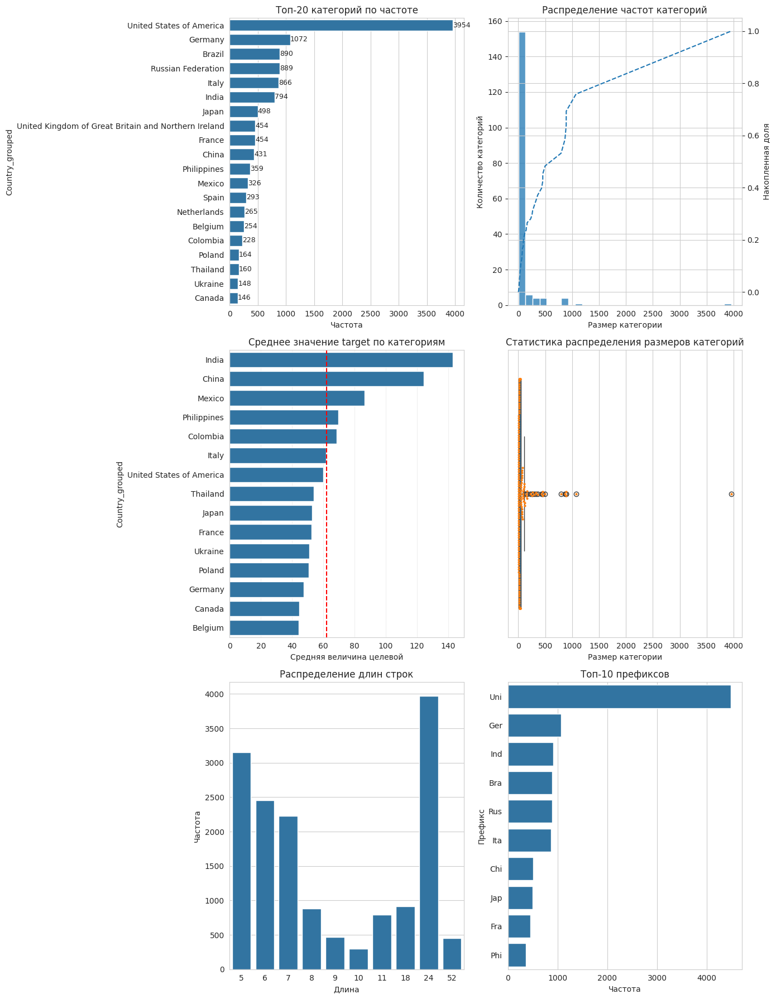


🔍 ДИАГНОСТИКА:
   ✅ Критических проблем не обнаружено

💡 РЕКОМЕНДАЦИИ:
   1. Target Encoding с кросс-валидацией
   2. Bayesian Target Encoding
   3. Использовать извлеченные паттерны как дополнительные признаки
   4. Использовать префиксы для группировки

📋 ИТОГОВАЯ ОЦЕНКА: ✅ ПРИЗНАК РЕКОМЕНДУЕТСЯ К ИСПОЛЬЗОВАНИЮ


{'basic_info': {'cardinality': 174,
  'cardinality_ratio': 0.010614286585737815,
  'cardinality_type': 'Умеренная',
  'missing_rate': 0.018089248277927523,
  'target_type': 'regression'},
 'frequency_analysis': {'rare_categories_count': 41,
  'frequent_categories_count': 133,
  'frequency_stats': {'count': 174.0,
   'mean': 94.21264367816092,
   'std': 338.8220595641699,
   'min': 1.0,
   '25%': 5.25,
   '50%': 17.0,
   '75%': 48.75,
   'max': 3954.0}},
 'statistical_tests': {'mutual_information': np.float64(0.3895343778143827),
  'anova_f_test': {'statistic': np.float64(437.8486919404882),
   'p_value': np.float64(0.0),
   'significant': np.True_},
  'eta_squared': 0.3972056645255839},
 'target_analysis': {'overall_mean': np.float64(61.98813760379597),
  'overall_std': 41.82188341089179,
  'category_stats':                                                           mean        std  \
  Country_grouped                                                             
  India                 

In [ ]:
analyze_high_cardinality_categorical(df, 'Country' , 'AQI Value')

📊 AQI Category (categorical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Категорий: 6

Статистика по группам:
                                count     mean     std
AQI Category                                          
Good                             7708   37.015   8.526
Hazardous                          62  413.194  82.682
Moderate                         7054   65.433  11.969
Unhealthy                         871  166.039  13.305
Unhealthy for Sensitive Groups    869  120.315  13.979


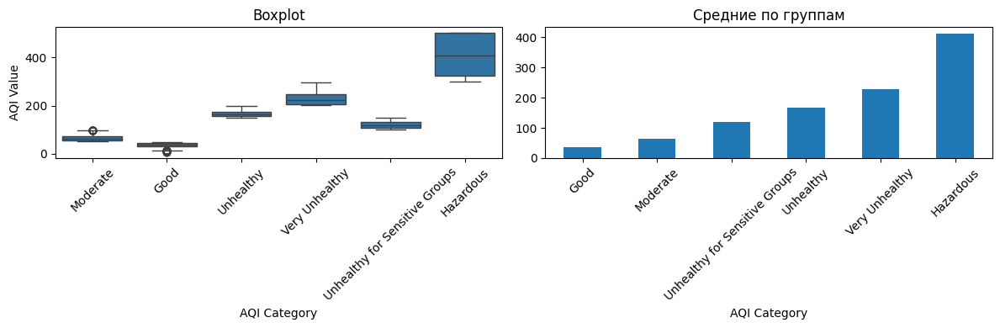

ANOVA: p = 0.000000
Взаимная информация: 1.091
CV оценка: 0.922

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: сильная (CV: 0.922, MI: 1.091)
✅ Проблем не обнаружено


{'p_value': np.float64(0.0),
 'mi_score': np.float64(1.0914013497253459),
 'cv_score': np.float64(0.9222249614978747),
 'is_significant': np.True_,
 'strength': 'сильная',
 'n_samples': 16695,
 'outlier_rate': 0,
 'issues': []}

In [ ]:
analyze_feature(df, 'AQI Category' , 'AQI Value')

Диапазон: [0.00, 133.00]


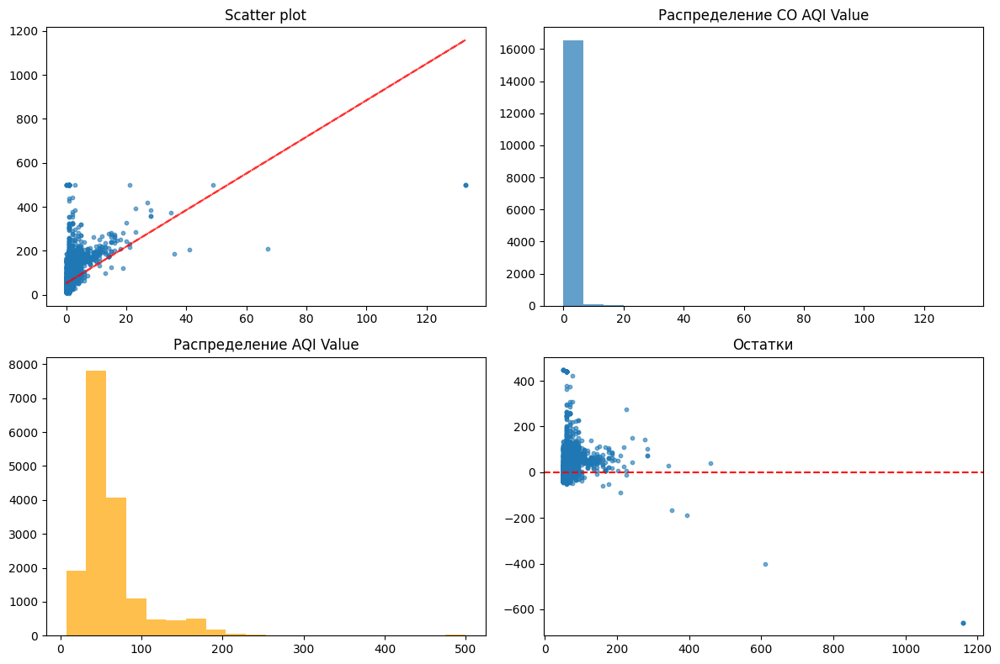

Пирсон: 0.459 (p=0.000000)
Спирмен: 0.622 (p=0.000000)
R²: 0.210
Взаимная информация: 0.351
CV оценка: 0.387

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: умеренная (CV: 0.387, MI: 0.351)
⚠️ Рекомендации:
• Много выбросов (34.4%) - обработать


{'p_value': np.float64(0.0),
 'mi_score': np.float64(0.35067162746716685),
 'cv_score': np.float64(0.3871621341407547),
 'is_significant': np.True_,
 'strength': 'умеренная',
 'n_samples': 16695,
 'outlier_rate': 0.3437556154537287,
 'issues': ['• Много выбросов (34.4%) - обработать']}

In [ ]:
_analyze_numerical(df, "CO AQI Value", 'AQI Value', 0.05, 'regression', 'numerical')

📊 CO AQI Category (categorical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Категорий: 3

Статистика по группам:
                                count     mean     std
CO AQI Category                                       
Good                            16691   62.911  42.682
Moderate                            1  209.000     NaN
Unhealthy for Sensitive Groups      3  500.000   0.000


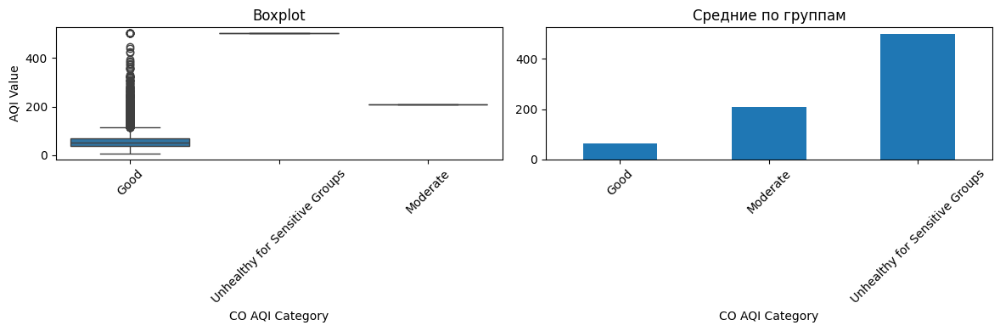

ANOVA: p = 0.000000
Взаимная информация: 0.003
CV оценка: 0.007

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.007, MI: 0.003)
⚠️ Рекомендации:
• Очень слабая предсказательная способность


{'p_value': np.float64(6.759984310663371e-71),
 'mi_score': np.float64(0.0032069882604512934),
 'cv_score': np.float64(0.006581112916554277),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0,
 'issues': ['• Очень слабая предсказательная способность']}

In [ ]:
analyze_feature(df, 'CO AQI Category', 'AQI Value')

Диапазон: [0.00, 222.00]


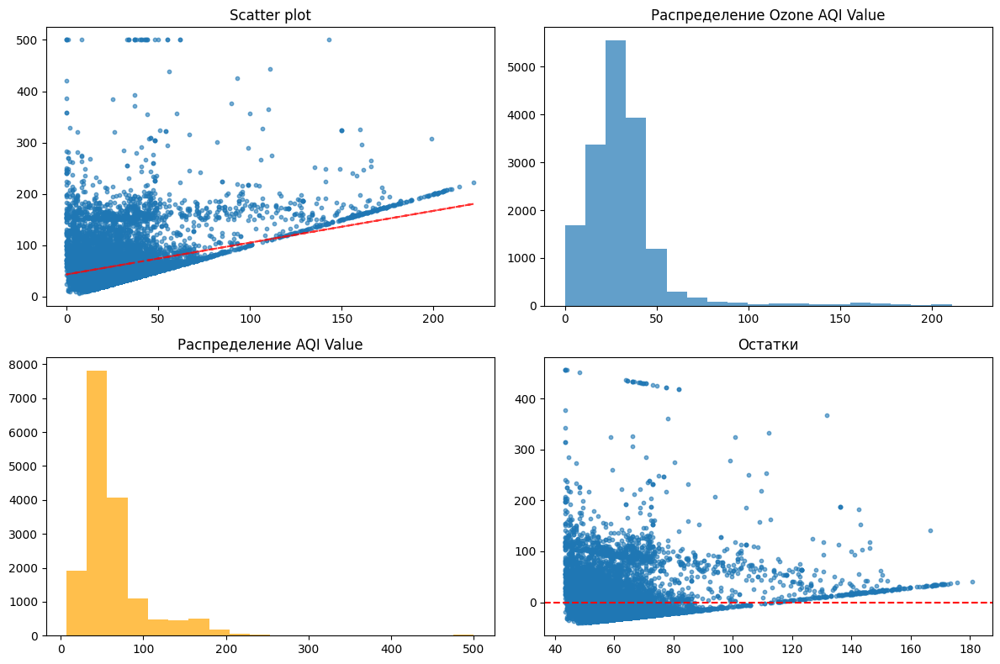

Пирсон: 0.328 (p=0.000000)
Спирмен: 0.079 (p=0.000000)
R²: 0.108
Взаимная информация: 0.850
CV оценка: 0.215

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.215, MI: 0.850)
✅ Проблем не обнаружено


{'p_value': np.float64(0.0),
 'mi_score': np.float64(0.8499177038039409),
 'cv_score': np.float64(0.2145711157038027),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.041749026654687035,
 'issues': []}

In [ ]:
_analyze_numerical(df, "Ozone AQI Value", 'AQI Value', 0.05, 'regression', 'numerical')

📊 Ozone AQI Category (categorical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Категорий: 5

Статистика по группам:
                                count     mean     std
Ozone AQI Category                                    
Good                            15529   58.826  37.859
Moderate                          806   94.976  57.846
Unhealthy                         159  179.025  33.330
Unhealthy for Sensitive Groups    176  159.682  52.757
Very Unhealthy                     25  205.200   4.778


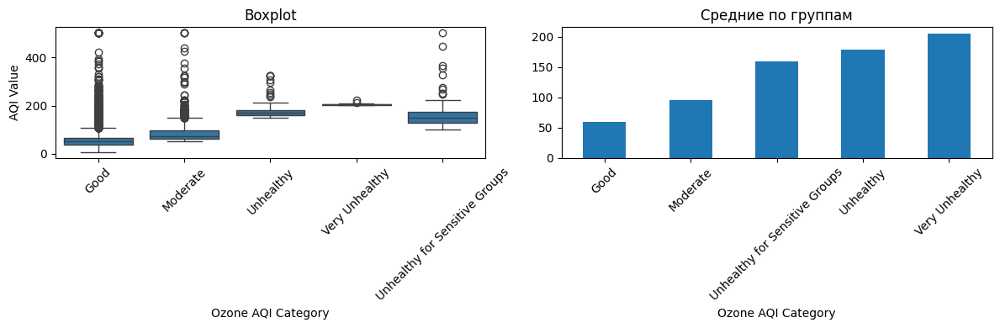

ANOVA: p = 0.000000
Взаимная информация: 0.107
CV оценка: 0.173

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.173, MI: 0.107)
✅ Проблем не обнаружено


{'p_value': np.float64(0.0),
 'mi_score': np.float64(0.10659269788886494),
 'cv_score': np.float64(0.17336275701836812),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0,
 'issues': []}

In [ ]:
analyze_feature(df, 'Ozone AQI Category', 'AQI Value')

Диапазон: [0.00, 91.00]


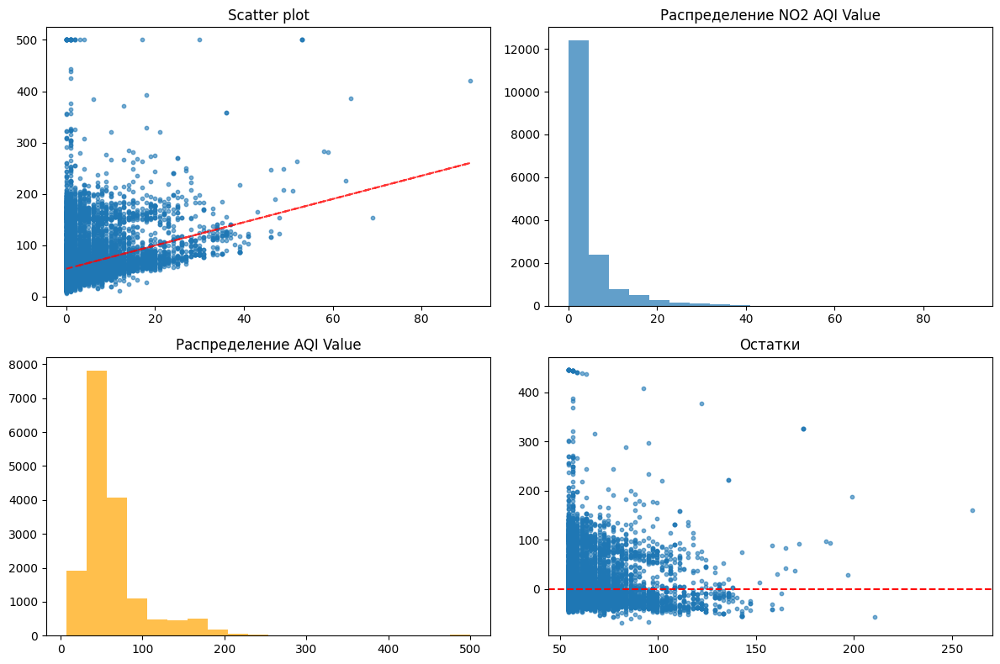

Пирсон: 0.309 (p=0.000000)
Спирмен: 0.326 (p=0.000000)
R²: 0.095
Взаимная информация: 0.193
CV оценка: 0.089

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.089, MI: 0.193)
⚠️ Рекомендации:
• Много выбросов (7.6%) - обработать
• Очень слабая предсказательная способность


{'p_value': np.float64(0.0),
 'mi_score': np.float64(0.19265454376695867),
 'cv_score': np.float64(0.08865662329818524),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.07589098532494759,
 'issues': ['• Много выбросов (7.6%) - обработать',
  '• Очень слабая предсказательная способность']}

In [ ]:
_analyze_numerical(df, "NO2 AQI Value", 'AQI Value', 0.05, 'regression', 'numerical')

📊 NO2 AQI Category (categorical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Категорий: 2

Статистика по группам:
                  count     mean      std
NO2 AQI Category                         
Good              16684   62.817   42.407
Moderate             11  338.182  127.955


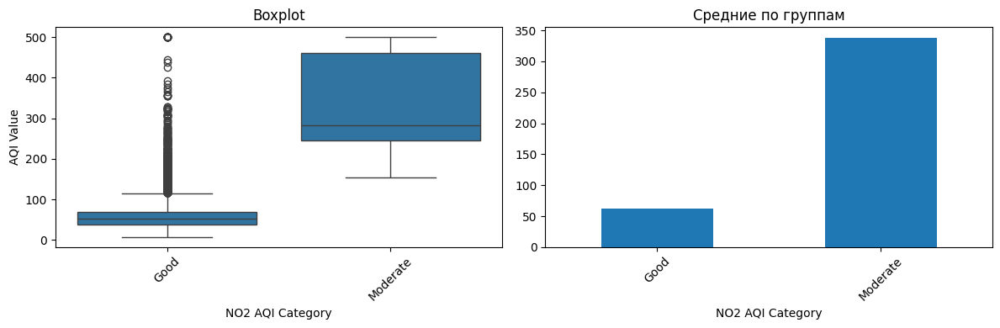

t-тест: p = 0.000000
Взаимная информация: 0.006
CV оценка: 0.023

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.023, MI: 0.006)
⚠️ Рекомендации:
• Очень слабая предсказательная способность


{'p_value': np.float64(5.935636456648951e-101),
 'mi_score': np.float64(0.005651179501009906),
 'cv_score': np.float64(0.02289935752121423),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0,
 'issues': ['• Очень слабая предсказательная способность']}

In [ ]:
analyze_feature(df, 'NO2 AQI Category', 'AQI Value')

Диапазон: [0.00, 500.00]


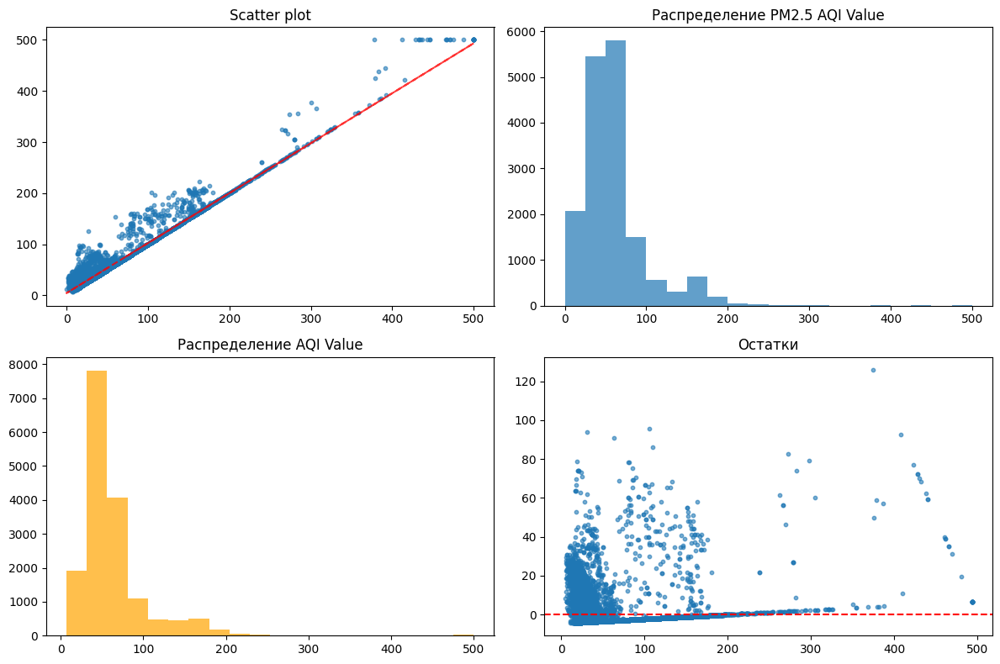

Пирсон: 0.980 (p=0.000000)
Спирмен: 0.959 (p=0.000000)
R²: 0.961
Взаимная информация: 3.651
CV оценка: 0.970

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: сильная (CV: 0.970, MI: 3.651)
⚠️ Рекомендации:
• Много выбросов (8.2%) - обработать


{'p_value': np.float64(0.0),
 'mi_score': np.float64(3.6513537244059204),
 'cv_score': np.float64(0.9699592141543195),
 'is_significant': np.True_,
 'strength': 'сильная',
 'n_samples': 16695,
 'outlier_rate': 0.08164120994309673,
 'issues': ['• Много выбросов (8.2%) - обработать']}

In [ ]:
_analyze_numerical(df, 'PM2.5 AQI Value', 'AQI Value', 0.05, 'regression', 'numerical')

📊 PM2.5 AQI Category (categorical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Категорий: 6

Статистика по группам:
                                count     mean     std
PM2.5 AQI Category                                    
Good                             7936   37.854   9.957
Hazardous                          53  428.415  79.577
Moderate                         6882   65.949  13.425
Unhealthy                         828  167.175  14.727
Unhealthy for Sensitive Groups    881  123.135  18.251


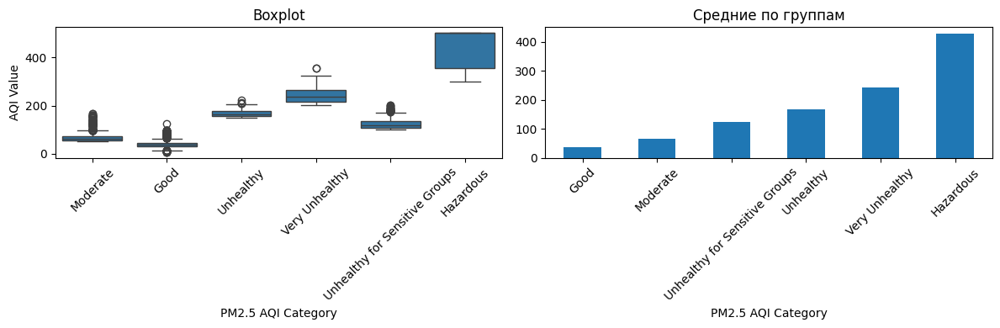

ANOVA: p = 0.000000
Взаимная информация: 0.989
CV оценка: 0.903

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: сильная (CV: 0.903, MI: 0.989)
✅ Проблем не обнаружено


{'p_value': np.float64(0.0),
 'mi_score': np.float64(0.9887233580593002),
 'cv_score': np.float64(0.9034187077055594),
 'is_significant': np.True_,
 'strength': 'сильная',
 'n_samples': 16695,
 'outlier_rate': 0,
 'issues': []}

In [ ]:
analyze_feature(df, 'PM2.5 AQI Category', 'AQI Value')

📊 lat (numerical) → AQI Category (multiclass)
Выборка: 16695, пропуски: 0.0%
Диапазон: [-54.80, 70.77]


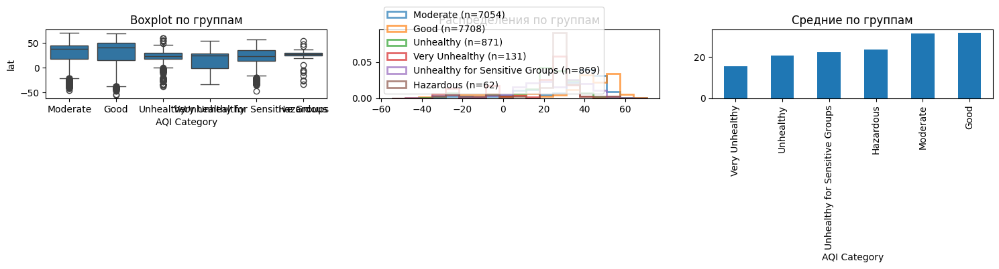

Статистика по группам:
                                count    mean     std
AQI Category                                         
Good                             7708  31.596  26.046
Hazardous                          62  23.523  16.410
Moderate                         7054  31.321  19.819
Unhealthy                         871  20.661  16.454
Unhealthy for Sensitive Groups    869  22.271  18.401
Very Unhealthy                    131  15.474  20.991
Kruskal-Wallis: p = 0.000000
Корреляция с классами: -0.099
Взаимная информация: 0.174
CV оценка: 0.481

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.481, MI: 0.174)
✅ Проблем не обнаружено


{'p_value': np.float64(5.799322842757958e-227),
 'mi_score': np.float64(0.17423978658218853),
 'cv_score': np.float64(0.48086253369272236),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.022162324049116503,
 'issues': []}

In [ ]:
analyze_feature(df, 'lat', 'AQI Category')

📊 lat (numerical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Диапазон: [-54.80, 70.77]


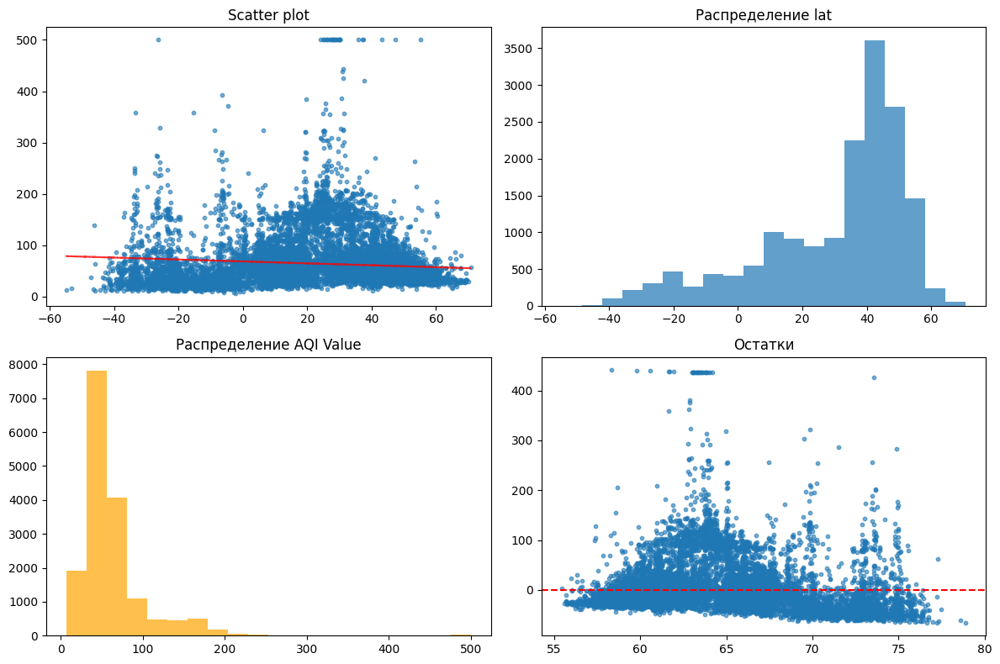

Пирсон: -0.100 (p=0.000000)
Спирмен: -0.190 (p=0.000000)
R²: 0.010
Взаимная информация: 0.318
CV оценка: -0.097

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: -0.097, MI: 0.318)
⚠️ Рекомендации:
• Очень слабая предсказательная способность


{'p_value': np.float64(4.844919506645297e-38),
 'mi_score': np.float64(0.3179472646884687),
 'cv_score': np.float64(-0.0967179949644373),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.022162324049116503,
 'issues': ['• Очень слабая предсказательная способность']}

In [ ]:
analyze_feature(df, 'lat', 'AQI Value')

📊 lng (numerical) → AQI Value (regression)
Выборка: 16695, пропуски: 0.0%
Диапазон: [-171.75, 178.02]


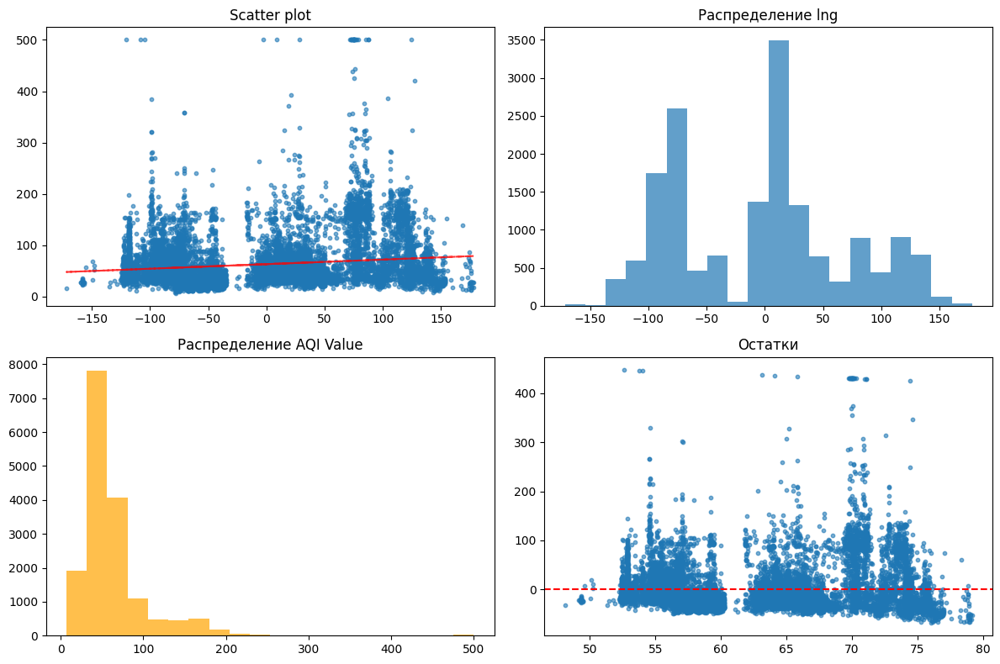

Пирсон: 0.151 (p=0.000000)
Спирмен: 0.040 (p=0.000000)
R²: 0.023
Взаимная информация: 0.326
CV оценка: -0.026

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: -0.026, MI: 0.326)
⚠️ Рекомендации:
• Очень слабая предсказательная способность


{'p_value': np.float64(2.4141023704636154e-85),
 'mi_score': np.float64(0.3264489925161449),
 'cv_score': np.float64(-0.02585697071937121),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.0,
 'issues': ['• Очень слабая предсказательная способность']}

In [ ]:
analyze_feature(df, 'lng', 'AQI Value')

📊 lng (numerical) → AQI Category (multiclass)
Выборка: 16695, пропуски: 0.0%
Диапазон: [-171.75, 178.02]


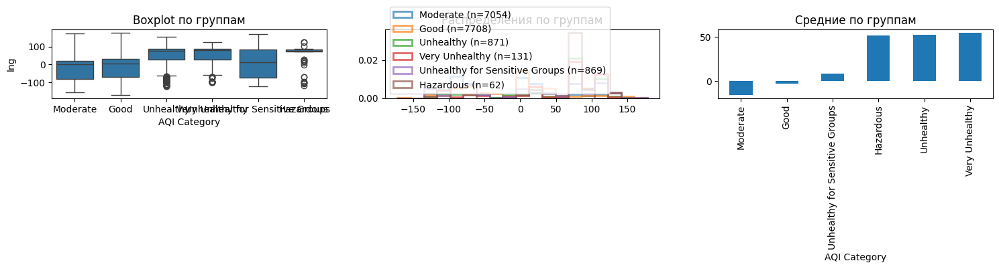

Статистика по группам:
                                count    mean     std
AQI Category                                         
Good                             7708  -2.720  68.391
Hazardous                          62  51.586  62.429
Moderate                         7054 -15.362  72.756
Unhealthy                         871  52.236  66.680
Unhealthy for Sensitive Groups    869   8.802  86.865
Very Unhealthy                    131  54.445  65.375
Kruskal-Wallis: p = 0.000000
Корреляция с классами: 0.046
Взаимная информация: 0.190
CV оценка: 0.486

🔍 РЕЗУЛЬТАТЫ:
Статистическая значимость: ✅ ДА (p=0.000000)
Сила связи: слабая (CV: 0.486, MI: 0.190)
✅ Проблем не обнаружено


{'p_value': np.float64(1.9911494628486763e-170),
 'mi_score': np.float64(0.18978420940854046),
 'cv_score': np.float64(0.4858939802336029),
 'is_significant': np.True_,
 'strength': 'слабая',
 'n_samples': 16695,
 'outlier_rate': 0.0,
 'issues': []}

In [ ]:
analyze_feature(df, 'lng', 'AQI Category')

## Анализ взаимосвязей между признаками (Мультивариантный анализ)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16695 entries, 0 to 16694
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             16393 non-null  object 
 1   City                16695 non-null  object 
 2   AQI Value           16695 non-null  int64  
 3   AQI Category        16695 non-null  object 
 4   CO AQI Value        16695 non-null  int64  
 5   CO AQI Category     16695 non-null  object 
 6   Ozone AQI Value     16695 non-null  int64  
 7   Ozone AQI Category  16695 non-null  object 
 8   NO2 AQI Value       16695 non-null  int64  
 9   NO2 AQI Category    16695 non-null  object 
 10  PM2.5 AQI Value     16695 non-null  int64  
 11  PM2.5 AQI Category  16695 non-null  object 
 12  lat                 16695 non-null  float64
 13  lng                 16695 non-null  float64
dtypes: float64(2), int64(5), object(7)
memory usage: 1.8+ MB


МУЛЬТИВАРИАНТНЫЙ EDA АНАЛИЗ (УЛУЧШЕННАЯ ВЕРСИЯ)
⚠️  Признак 'Country' исключен: слишком много уникальных значений (174)
⚠️  Признак 'City' исключен: слишком много уникальных значений (14229)
📊 Обнаружено 6 числовых и 4 категориальных признаков
🎯 Целевая переменная: AQI Value
📈 Числовые признаки: ['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value', 'lat', 'lng']
📋 Категориальные признаки: ['CO AQI Category', 'Ozone AQI Category', 'NO2 AQI Category', 'PM2.5 AQI Category']

🔗 АНАЛИЗ ВЗАИМОСВЯЗЕЙ МЕЖДУ ВСЕМИ ПРИЗНАКАМИ

    Корреляционная матрица — это таблица, которая показывает коэффициенты корреляции между парами признаков в вашем наборе данных. Коэффициент корреляции варьируется от -1 до 1:

    1: Сильная положительная линейная связь (если один признак растёт, другой тоже растёт).
    -1: Сильная отрицательная линейная связь (если один признак растёт, другой уменьшается).
    0: Линейной связи нет.

    Высокие значения (близкие к 1 или -1): Признаки сильно связаны.

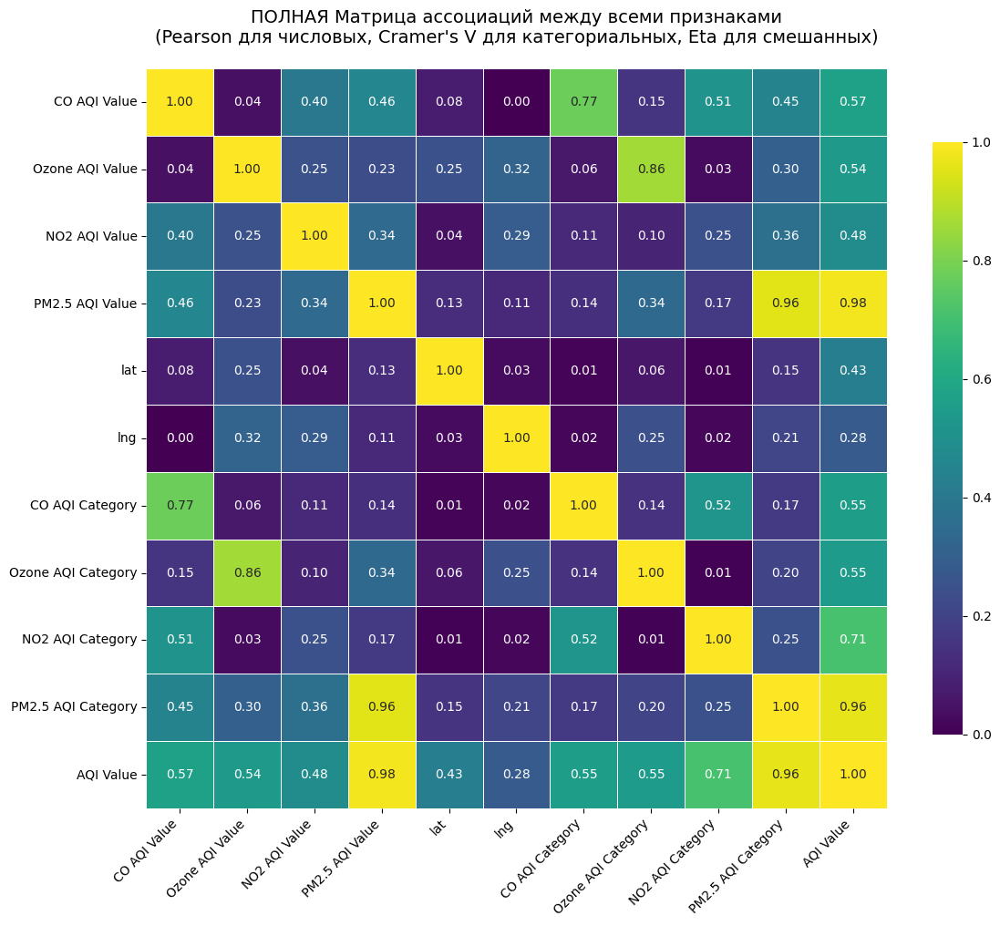


📊 КОРРЕЛЯЦИОННАЯ МАТРИЦА ЧИСЛОВЫХ ПРИЗНАКОВ


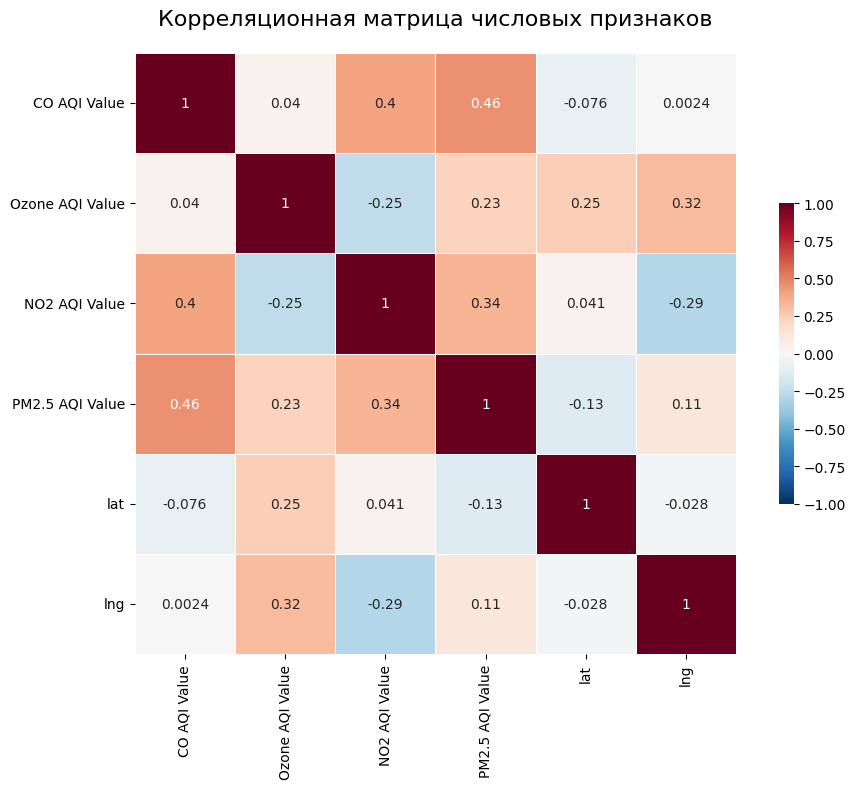

⚠️  Сильные корреляции между числовыми признаками:
   • CO AQI Value ↔ NO2 AQI Value: r = 0.400
   • CO AQI Value ↔ PM2.5 AQI Value: r = 0.459
   • Ozone AQI Value ↔ lng: r = 0.319
   • NO2 AQI Value ↔ PM2.5 AQI Value: r = 0.341

🕳️  АНАЛИЗ ПРОПУСКОВ И РЕКОМЕНДАЦИИ
✅ Пропуски не обнаружены

💡 ИТОГОВЫЕ РЕКОМЕНДАЦИИ
1. Проанализируйте 22 сильных связей между признаками

📋 ИНТЕРПРЕТАЦИЯ МЕТРИК:
   • Pearson: Линейная корреляция (-1 до 1, 0 = нет связи)
   • Cramer's V: Связь между категориями (0 до 1, 0 = независимы)
   • Eta: Связь числовое-категориальное (0 до 1, 0 = нет связи)
   • Порог сильной связи: 0.3

✅ АНАЛИЗ ЗАВЕРШЕН


{'association_matrix':                     CO AQI Value  Ozone AQI Value  NO2 AQI Value  \
 CO AQI Value            1.000000         0.039752       0.399566   
 Ozone AQI Value         0.039752         1.000000       0.251169   
 NO2 AQI Value           0.399566         0.251169       1.000000   
 PM2.5 AQI Value         0.458846         0.233031       0.341455   
 lat                     0.076412         0.249740       0.040666   
 lng                     0.002410         0.318965       0.290813   
 CO AQI Category         0.774586         0.062887       0.112146   
 Ozone AQI Category      0.153859         0.861554       0.100524   
 NO2 AQI Category        0.513098         0.029685       0.247692   
 PM2.5 AQI Category      0.445502         0.301730       0.364509   
 AQI Value               0.569000         0.541359       0.482111   
 
                     PM2.5 AQI Value       lat       lng  CO AQI Category  \
 CO AQI Value               0.458846  0.076412  0.002410         0.7745

In [ ]:
multivariate_eda_analysis(df, target_column='AQI Value', numerical_features=['CO AQI Value','Ozone AQI Value','NO2 AQI Value','PM2.5 AQI Value','lat','lng'], categorical_features=['Country','City','CO AQI Category','Ozone AQI Category','NO2 AQI Category','PM2.5 AQI Category'])

#### Анализ значимых связей

 • CO AQI Category ↔ NO2 AQI Category: Cramers_V = 0.522 (n=16695)

   • CO AQI Value ↔ NO2 AQI Category: Eta = 0.513 (n=16695)

   • CO AQI Value ↔ PM2.5 AQI Value: Pearson = 0.459 (n=16695)

   • CO AQI Value ↔ PM2.5 AQI Category: Eta = 0.446 (n=16695)

   • CO AQI Value ↔ NO2 AQI Value: Pearson = 0.400 (n=16695)

   • NO2 AQI Value ↔ PM2.5 AQI Category: Eta = 0.365 (n=16695)

   • NO2 AQI Value ↔ PM2.5 AQI Value: Pearson = 0.341 (n=16695)

   • PM2.5 AQI Value ↔ Ozone AQI Category: Eta = 0.339 (n=16695)

   • Ozone AQI Value ↔ lng: Pearson = 0.319 (n=16695)

   • Ozone AQI Value ↔ PM2.5 AQI Category: Eta = 0.302 (n=16695)

Because its same feature but categorized :

 • PM2.5 AQI Value ↔ PM2.5 AQI Category: Eta = 0.956 (n=16695)

 • Ozone AQI Value ↔ Ozone AQI Category: Eta = 0.862 (n=16695)

 • CO AQI Value ↔ CO AQI Category: Eta = 0.775 (n=16695)

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Category' ↔ 'NO2 AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Category': 3
   • Уникальных значений в 'NO2 AQI Category': 2
   • Тип 'CO AQI Category': categorical
   • Тип 'NO2 AQI Category': categorical

📋 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ ↔ КАТЕГОРИАЛЬНАЯ
--------------------------------------------------
📊 Таблица сопряженности:
NO2 AQI Category                 Good  Moderate    All
CO AQI Category                                       
Good                            16683         8  16691
Moderate                            1         0      1
Unhealthy for Sensitive Groups      0         3      3
All                             16684        11  16695

📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Chi-square статистика: 4551.0000
   • p-value: 0.000000
   • Степени свободы: 2
   • Cramer's V: 0.5221
   • Связь: значимая (α = 0.05)
   • Сила свя

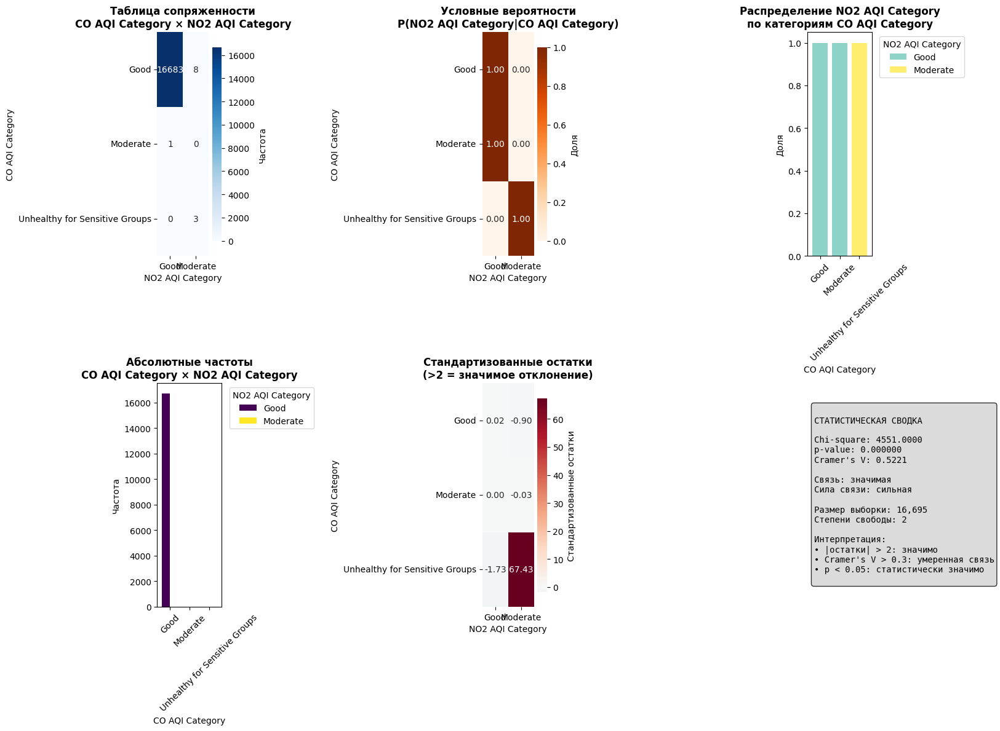


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Chi-square',
 'statistic': np.float64(4550.999956743263),
 'p_value': np.float64(0.0),
 'effect_size': np.float64(0.5221078271900675),
 'effect_size_name': 'Cramers_V',
 'significant': np.True_,
 'contingency_table': NO2 AQI Category                 Good  Moderate
 CO AQI Category                                
 Good                            16683         8
 Moderate                            1         0
 Unhealthy for Sensitive Groups      0         3,
 'residuals': NO2 AQI Category                    Good   Moderate
 CO AQI Category                                    
 Good                            0.023208  -0.903848
 Moderate                        0.000659  -0.025669
 Unhealthy for Sensitive Groups -1.731480  67.432809}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Category', 'NO2 AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Value' ↔ 'NO2 AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Value': 31
   • Уникальных значений в 'NO2 AQI Category': 2
   • Тип 'CO AQI Value': numerical
   • Тип 'NO2 AQI Category': categorical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (NO2 AQI Category) ↔ ЧИСЛОВАЯ (CO AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                  count    mean     std  median  min  max
NO2 AQI Category                                         
Good              16684   1.311   1.539     1.0    0   67
Moderate             11  48.727  54.441    19.0   10  133

📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • F-статистика: 5965.2203
   • p-value: 0.000000
   • Eta-squared: 0.2633
   • Различия между группами: значимые
   • Размер эффекта: большой


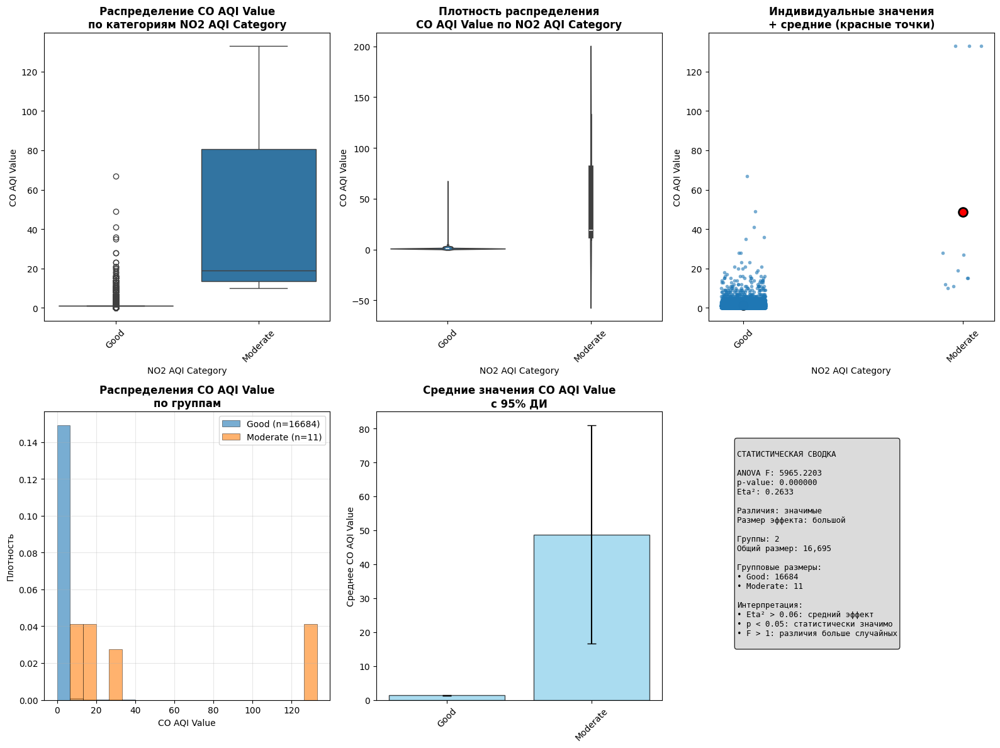


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(5965.220319933826),
 'p_value': np.float64(0.0),
 'eta_squared': np.float64(0.2632695876243356),
 'significant': np.True_,
 'group_stats':                   count       mean        std  median  min  max
 NO2 AQI Category                                               
 Good              16684   1.310897   1.539201     1.0    0   67
 Moderate             11  48.727273  54.440961    19.0   10  133,
 'n_groups': 2}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Value', 'NO2 AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Value' ↔ 'NO2 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Value': 31
   • Уникальных значений в 'NO2 AQI Value': 56
   • Тип 'CO AQI Value': numerical
   • Тип 'NO2 AQI Value': numerical

📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ
--------------------------------------------------
📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Pearson r: 0.3996 (p = 0.000000)
   • Spearman ρ: 0.5166 (p = 0.000000)
   • Сила линейной связи (Pearson): умеренная
   • Сила монотонной связи (Spearman): сильная


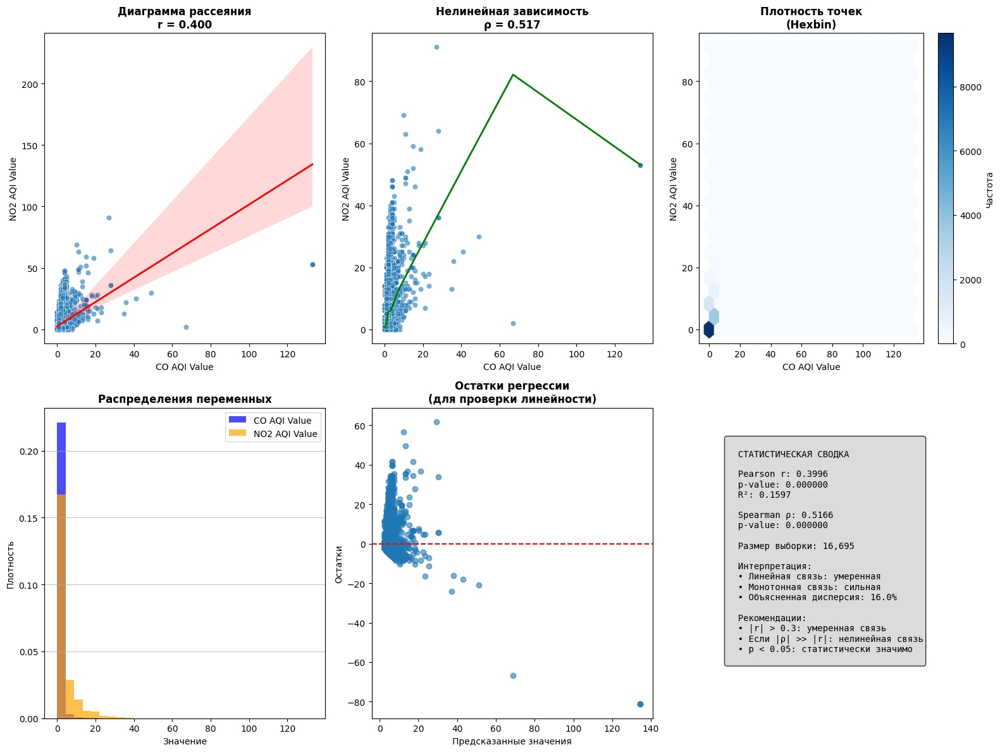


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Correlation',
 'pearson_r': np.float64(0.39956588678985977),
 'pearson_p': np.float64(0.0),
 'spearman_r': np.float64(0.5165702600914447),
 'spearman_p': np.float64(0.0),
 'r_squared': np.float64(0.15965289788616704),
 'significant_pearson': np.True_,
 'significant_spearman': np.True_,
 'residuals': array([-3.4806335, -2.4806335, -2.4806335, ..., -2.4806335,  1.5193665,
        -1.4806335])}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Value', 'NO2 AQI Value')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Category' ↔ 'PM2.5 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Category': 3
   • Уникальных значений в 'PM2.5 AQI Value': 298
   • Тип 'CO AQI Category': categorical
   • Тип 'PM2.5 AQI Value': numerical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (CO AQI Category) ↔ ЧИСЛОВАЯ (PM2.5 AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                                count     mean     std  median  min  max
CO AQI Category                                                         
Good                            16691   59.736  42.802    52.0    0  500
Moderate                            1  157.000     NaN   157.0  157  157
Unhealthy for Sensitive Groups      3  500.000   0.000   500.0  500  500

📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • F-статистика: 161.2733
   • p-value: 0.000000
   • Eta-squared: 0.0190
   

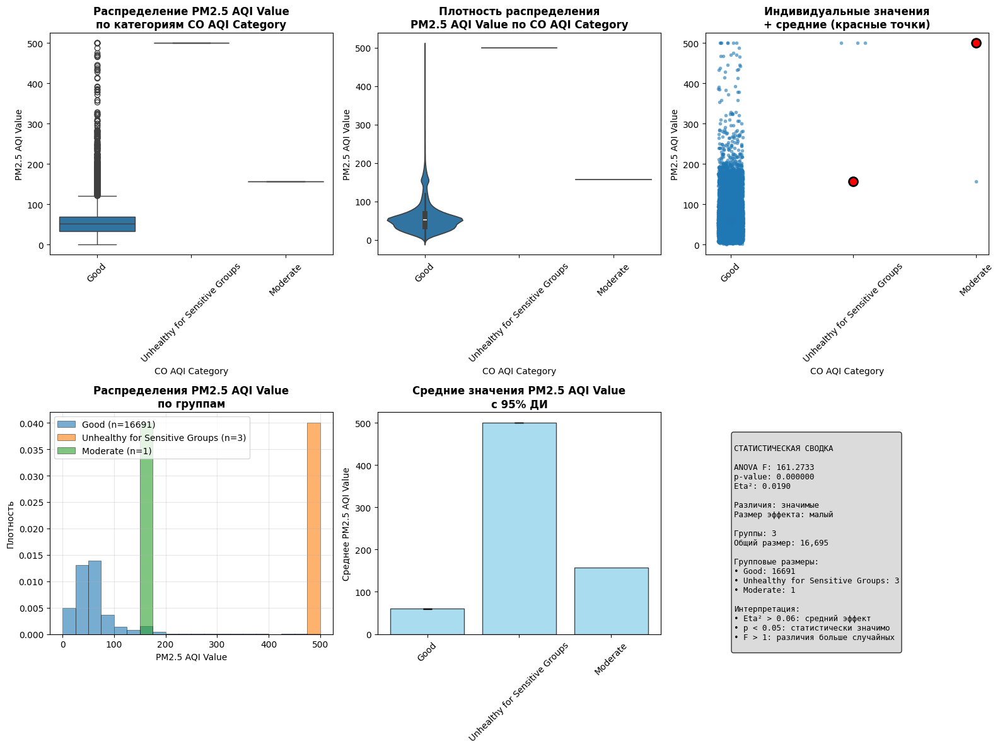


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(161.27332909823338),
 'p_value': np.float64(4.246171644599806e-70),
 'eta_squared': np.float64(0.01895711150441299),
 'significant': np.True_,
 'group_stats':                                 count        mean        std  median  min  max
 CO AQI Category                                                               
 Good                            16691   59.736385  42.801914    52.0    0  500
 Moderate                            1  157.000000        NaN   157.0  157  157
 Unhealthy for Sensitive Groups      3  500.000000   0.000000   500.0  500  500,
 'n_groups': 3}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Category', 'PM2.5 AQI Value')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Category' ↔ 'PM2.5 AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Category': 3
   • Уникальных значений в 'PM2.5 AQI Category': 6
   • Тип 'CO AQI Category': categorical
   • Тип 'PM2.5 AQI Category': categorical

📋 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ ↔ КАТЕГОРИАЛЬНАЯ
--------------------------------------------------
📊 Таблица сопряженности:
PM2.5 AQI Category              Good  Hazardous  Moderate  Unhealthy  \
CO AQI Category                                                        
Good                            7936         50      6882        827   
Moderate                           0          0         0          1   
Unhealthy for Sensitive Groups     0          3         0          0   
All                             7936         53      6882        828   

PM2.5 AQI Category              Unhealthy for Sensitive Groups  \
CO AQI Ca

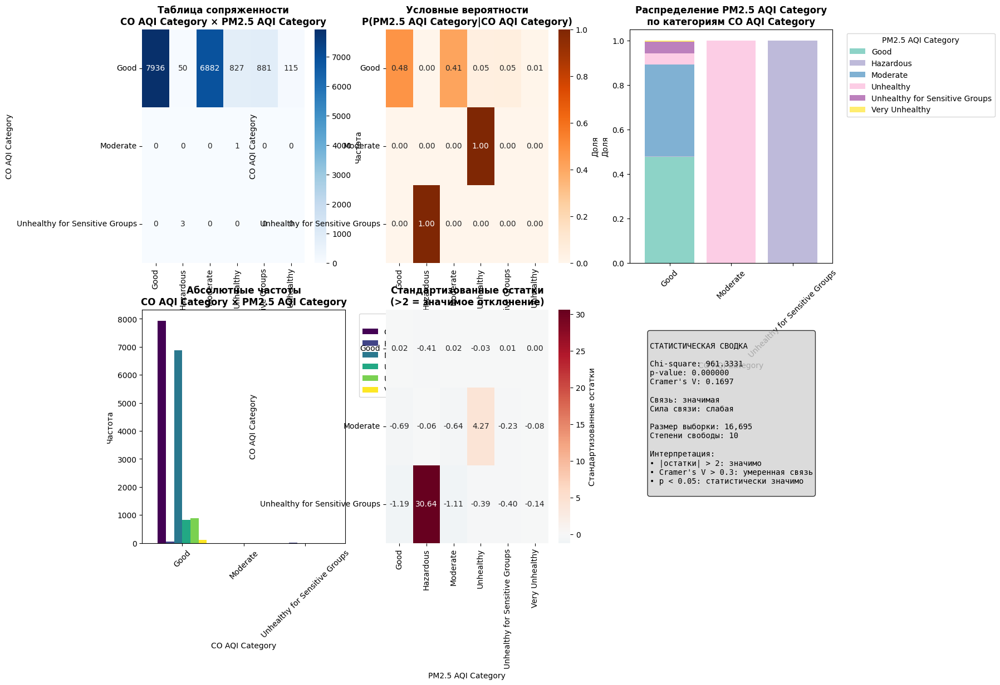


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Chi-square',
 'statistic': np.float64(961.3331449127752),
 'p_value': np.float64(3.980576708404068e-200),
 'effect_size': np.float64(0.16967925495807065),
 'effect_size_name': 'Cramers_V',
 'significant': np.True_,
 'contingency_table': PM2.5 AQI Category              Good  Hazardous  Moderate  Unhealthy  \
 CO AQI Category                                                        
 Good                            7936         50      6882        827   
 Moderate                           0          0         0          1   
 Unhealthy for Sensitive Groups     0          3         0          0   
 
 PM2.5 AQI Category              Unhealthy for Sensitive Groups  Very Unhealthy  
 CO AQI Category                                                                 
 Good                                                       881             115  
 Moderate                                                     0               0  
 Unhealthy for Sensitive Groups                       

In [ ]:
analyze_variable_relationship(df, 'CO AQI Category', 'PM2.5 AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Category' ↔ 'NO2 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Category': 3
   • Уникальных значений в 'NO2 AQI Value': 56
   • Тип 'CO AQI Category': categorical
   • Тип 'NO2 AQI Value': numerical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (CO AQI Category) ↔ ЧИСЛОВАЯ (NO2 AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                                count    mean    std  median  min  max
CO AQI Category                                                       
Good                            16691   3.811  5.844     2.0    0   91
Moderate                            1   2.000    NaN     2.0    2    2
Unhealthy for Sensitive Groups      3  53.000  0.000    53.0   53   53

📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • F-статистика: 106.3013
   • p-value: 0.000000
   • Eta-squared: 0.0126
   • Различия между гр

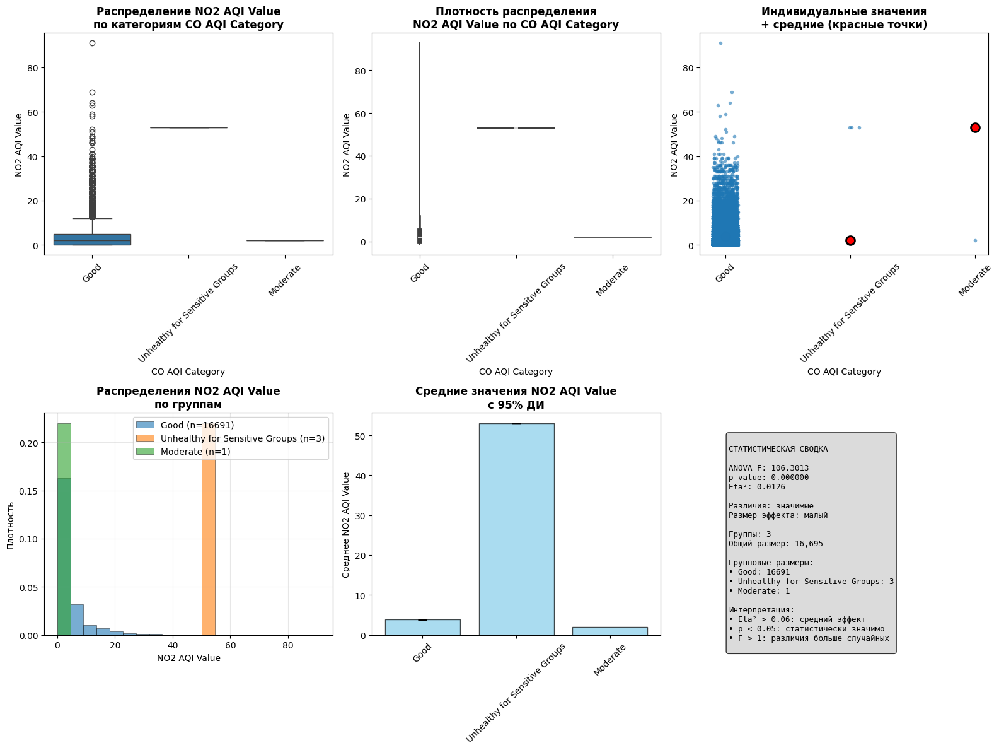


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(106.30132732168677),
 'p_value': np.float64(1.3349079921096231e-46),
 'eta_squared': np.float64(0.01257661354051259),
 'significant': np.True_,
 'group_stats':                                 count       mean       std  median  min  max
 CO AQI Category                                                             
 Good                            16691   3.810916  5.844281     2.0    0   91
 Moderate                            1   2.000000       NaN     2.0    2    2
 Unhealthy for Sensitive Groups      3  53.000000  0.000000    53.0   53   53,
 'n_groups': 3}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Category', 'NO2 AQI Value')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'CO AQI Value' ↔ 'PM2.5 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'CO AQI Value': 31
   • Уникальных значений в 'PM2.5 AQI Value': 298
   • Тип 'CO AQI Value': numerical
   • Тип 'PM2.5 AQI Value': numerical

📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ
--------------------------------------------------
📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Pearson r: 0.4588 (p = 0.000000)
   • Spearman ρ: 0.6041 (p = 0.000000)
   • Сила линейной связи (Pearson): умеренная
   • Сила монотонной связи (Spearman): сильная


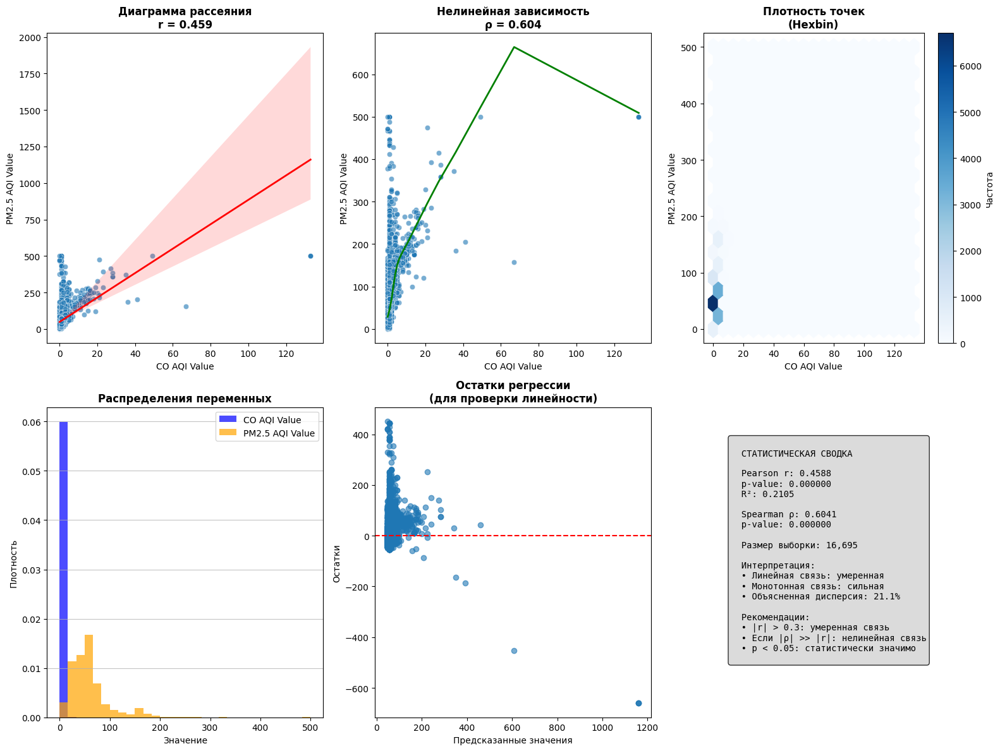


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Correlation',
 'pearson_r': np.float64(0.4588457350466068),
 'pearson_p': np.float64(0.0),
 'spearman_r': np.float64(0.60407484511884),
 'spearman_p': np.float64(0.0),
 'r_squared': np.float64(0.21053940857046088),
 'significant_pearson': np.True_,
 'significant_spearman': np.True_,
 'residuals': array([ -5.96087216, -15.96087216, -15.96087216, ...,  14.03912784,
         -6.96087216,  14.03912784])}

In [ ]:
analyze_variable_relationship(df, 'CO AQI Value', 'PM2.5 AQI Value')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'NO2 AQI Value' ↔ 'PM2.5 AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'NO2 AQI Value': 56
   • Уникальных значений в 'PM2.5 AQI Category': 6
   • Тип 'NO2 AQI Value': numerical
   • Тип 'PM2.5 AQI Category': categorical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (PM2.5 AQI Category) ↔ ЧИСЛОВАЯ (NO2 AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                                count    mean     std  median  min  max
PM2.5 AQI Category                                                     
Good                             7936   1.803   2.344     1.0    0   18
Hazardous                          53  10.509  19.710     1.0    0   91
Moderate                         6882   5.027   6.146     3.0    0   39
Unhealthy                         828   6.685   8.246     3.0    0   69
Unhealthy for Sensitive Groups    881  

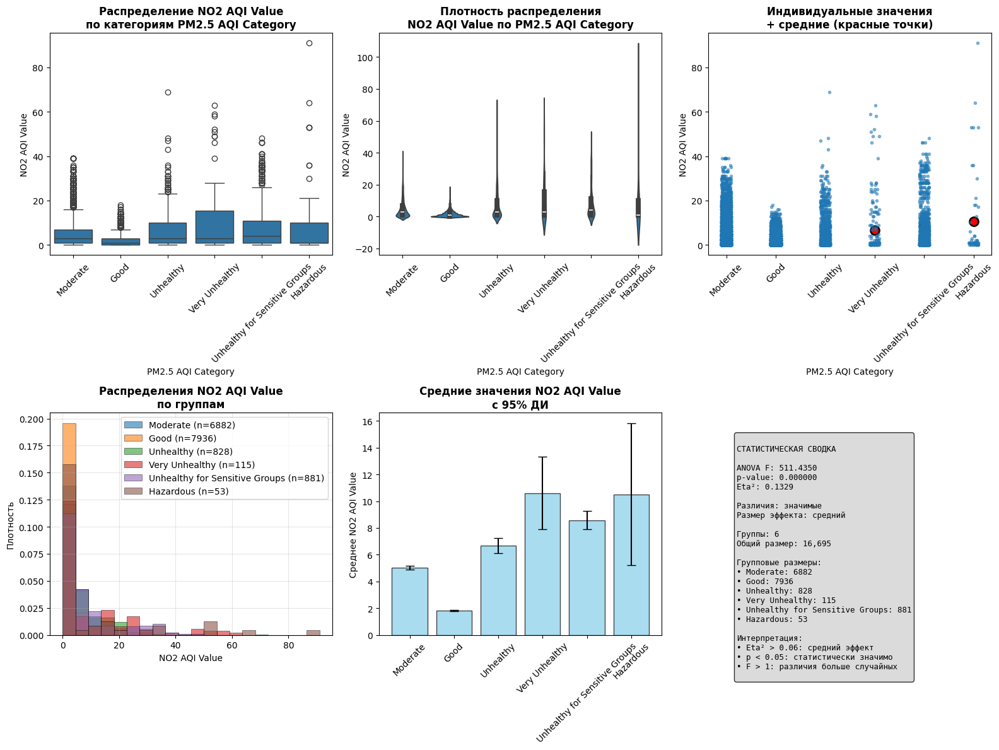


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(511.4349985913498),
 'p_value': np.float64(0.0),
 'eta_squared': np.float64(0.1328666602009259),
 'significant': np.True_,
 'group_stats':                                 count       mean        std  median  min  max
 PM2.5 AQI Category                                                           
 Good                             7936   1.802671   2.343985     1.0    0   18
 Hazardous                          53  10.509434  19.710035     1.0    0   91
 Moderate                         6882   5.027172   6.146281     3.0    0   39
 Unhealthy                         828   6.684783   8.246265     3.0    0   69
 Unhealthy for Sensitive Groups    881   8.574347  10.415427     4.0    0   48
 Very Unhealthy                    115  10.608696  14.859397     3.0    0   63,
 'n_groups': 6}

In [ ]:
analyze_variable_relationship(df, 'NO2 AQI Value', 'PM2.5 AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'NO2 AQI Value' ↔ 'PM2.5 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'NO2 AQI Value': 56
   • Уникальных значений в 'PM2.5 AQI Value': 298
   • Тип 'NO2 AQI Value': numerical
   • Тип 'PM2.5 AQI Value': numerical

📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ
--------------------------------------------------
📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Pearson r: 0.3415 (p = 0.000000)
   • Spearman ρ: 0.3664 (p = 0.000000)
   • Сила линейной связи (Pearson): умеренная
   • Сила монотонной связи (Spearman): умеренная


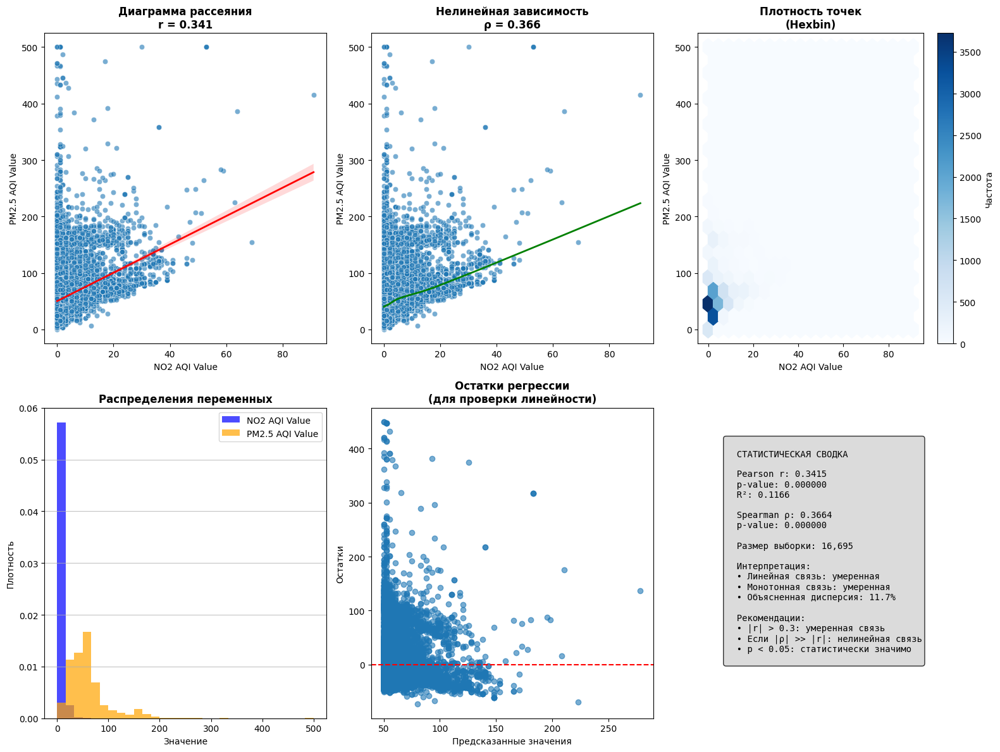


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Correlation',
 'pearson_r': np.float64(0.3414551159483206),
 'pearson_p': np.float64(0.0),
 'spearman_r': np.float64(0.3664111542271059),
 'spearman_p': np.float64(0.0),
 'r_squared': np.float64(0.11659159620728107),
 'significant_pearson': np.True_,
 'significant_spearman': np.True_,
 'residuals': array([  0.76156918, -11.74727363, -11.74727363, ...,  18.25272637,
        -12.78264489,  15.74388355])}

In [ ]:
analyze_variable_relationship(df, 'NO2 AQI Value', 'PM2.5 AQI Value')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'PM2.5 AQI Value' ↔ 'Ozone AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'PM2.5 AQI Value': 298
   • Уникальных значений в 'Ozone AQI Category': 5
   • Тип 'PM2.5 AQI Value': numerical
   • Тип 'Ozone AQI Category': categorical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (Ozone AQI Category) ↔ ЧИСЛОВАЯ (PM2.5 AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                                count     mean     std  median  min  max
Ozone AQI Category                                                      
Good                            15529   56.458  39.058    51.0    0  500
Moderate                          806   84.517  60.436    65.0   12  500
Unhealthy                         159  153.151  47.295   154.0   60  325
Unhealthy for Sensitive Groups    176  145.222  58.708   150.0   27  428
Very Unhealthy          

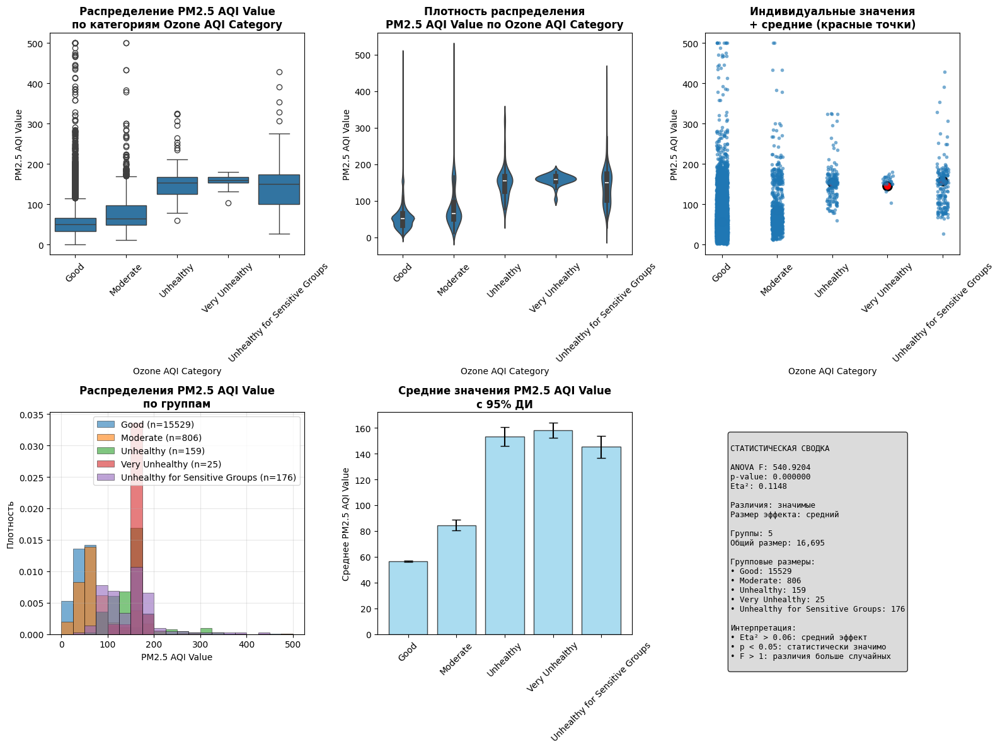


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(540.9203728033972),
 'p_value': np.float64(0.0),
 'eta_squared': np.float64(0.11476175049535767),
 'significant': np.True_,
 'group_stats':                                 count        mean        std  median  min  max
 Ozone AQI Category                                                            
 Good                            15529   56.457982  39.057578    51.0    0  500
 Moderate                          806   84.517370  60.436438    65.0   12  500
 Unhealthy                         159  153.150943  47.295354   154.0   60  325
 Unhealthy for Sensitive Groups    176  145.221591  58.708206   150.0   27  428
 Very Unhealthy                     25  158.000000  15.036068   159.0  104  180,
 'n_groups': 5}

In [ ]:
analyze_variable_relationship(df, 'PM2.5 AQI Value', 'Ozone AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'Ozone AQI Value' ↔ 'lng'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'Ozone AQI Value': 203
   • Уникальных значений в 'lng': 14,896
   • Тип 'Ozone AQI Value': numerical
   • Тип 'lng': numerical

📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ
--------------------------------------------------
📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Pearson r: 0.3190 (p = 0.000000)
   • Spearman ρ: 0.3147 (p = 0.000000)
   • Сила линейной связи (Pearson): умеренная
   • Сила монотонной связи (Spearman): умеренная


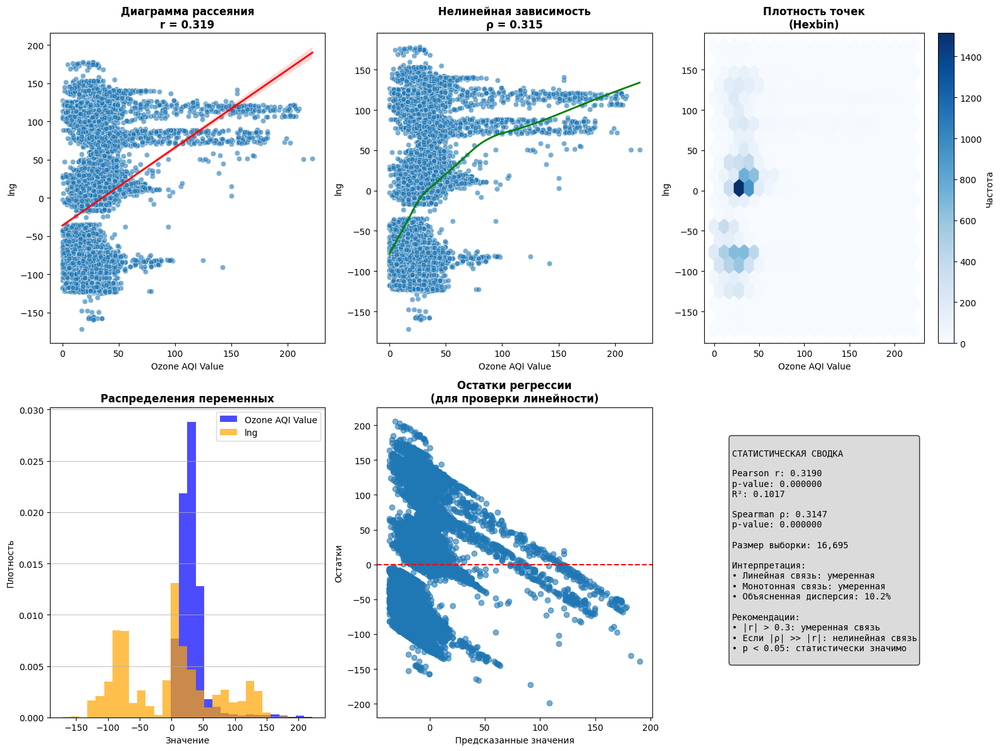


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Correlation',
 'pearson_r': np.float64(0.3189649623594129),
 'pearson_p': np.float64(0.0),
 'spearman_r': np.float64(0.3147031902341465),
 'spearman_p': np.float64(0.0),
 'r_squared': np.float64(0.1017386472129417),
 'significant_pearson': np.True_,
 'significant_spearman': np.True_,
 'residuals': array([ 43.83025744, -13.24262331, -10.73952331, ..., -92.28416377,
         18.23787061, -91.45389914])}

In [ ]:
analyze_variable_relationship(df, 'Ozone AQI Value', 'lng')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'Ozone AQI Value' ↔ 'PM2.5 AQI Category'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'Ozone AQI Value': 203
   • Уникальных значений в 'PM2.5 AQI Category': 6
   • Тип 'Ozone AQI Value': numerical
   • Тип 'PM2.5 AQI Category': categorical

📊 АНАЛИЗ: КАТЕГОРИАЛЬНАЯ (PM2.5 AQI Category) ↔ ЧИСЛОВАЯ (Ozone AQI Value)
--------------------------------------------------
📊 ОПИСАТЕЛЬНАЯ СТАТИСТИКА ПО ГРУППАМ:
                                count    mean     std  median  min  max
PM2.5 AQI Category                                                     
Good                             7936  29.863  12.098    30.0    0  125
Hazardous                          53  54.717  47.866    43.0    0  199
Moderate                         6882  29.369  17.061    28.0    0  168
Unhealthy                         828  59.188  56.465    37.0    0  222
Unhealthy for Sensitive Groups

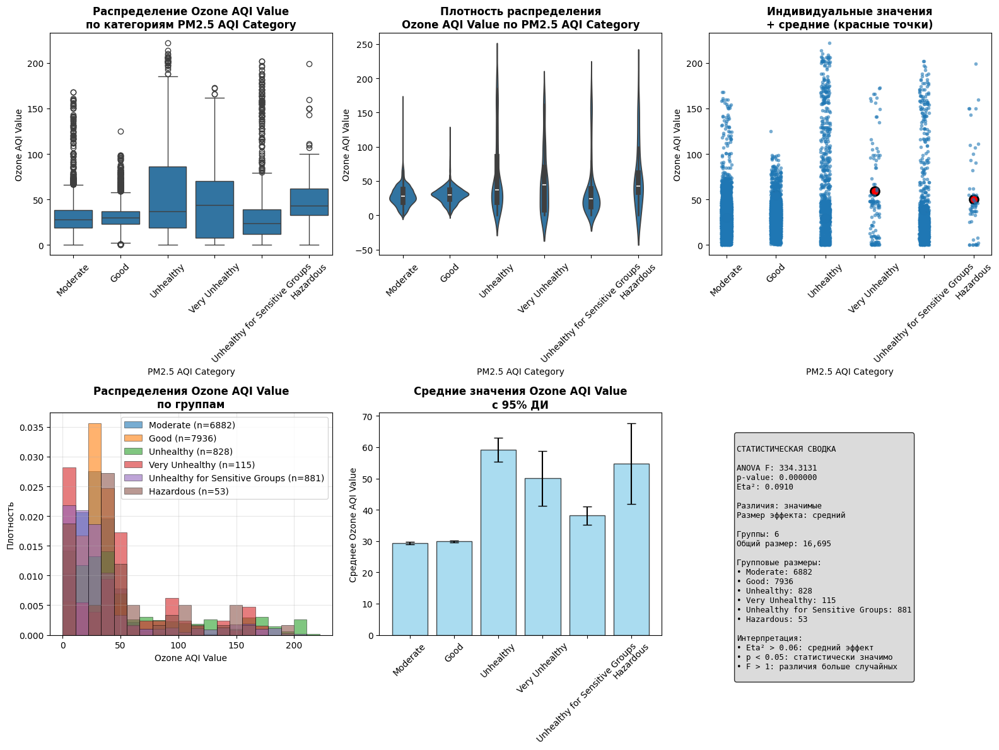


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'ANOVA',
 'f_statistic': np.float64(334.31313371094376),
 'p_value': np.float64(0.0),
 'eta_squared': np.float64(0.0910410767690864),
 'significant': np.True_,
 'group_stats':                                 count       mean        std  median  min  max
 PM2.5 AQI Category                                                           
 Good                             7936  29.862777  12.098189    30.0    0  125
 Hazardous                          53  54.716981  47.866150    43.0    0  199
 Moderate                         6882  29.368788  17.060839    28.0    0  168
 Unhealthy                         828  59.188406  56.464932    37.0    0  222
 Unhealthy for Sensitive Groups    881  38.125993  44.321129    24.0    0  202
 Very Unhealthy                    115  50.017391  48.359397    44.0    0  173,
 'n_groups': 6}

In [ ]:
analyze_variable_relationship(df, 'Ozone AQI Value', 'PM2.5 AQI Category')

🔍 ДЕТАЛЬНЫЙ АНАЛИЗ СВЯЗИ: 'Ozone AQI Value' ↔ 'PM2.5 AQI Value'
📊 БАЗОВАЯ ИНФОРМАЦИЯ:
   • Исходный размер выборки: 16,695
   • После удаления пропусков: 16,695
   • Доля пропусков: 0.00%
   • Уникальных значений в 'Ozone AQI Value': 203
   • Уникальных значений в 'PM2.5 AQI Value': 298
   • Тип 'Ozone AQI Value': numerical
   • Тип 'PM2.5 AQI Value': numerical

📊 АНАЛИЗ: ЧИСЛОВАЯ ↔ ЧИСЛОВАЯ
--------------------------------------------------
📈 СТАТИСТИЧЕСКИЕ ПОКАЗАТЕЛИ:
   • Pearson r: 0.2330 (p = 0.000000)
   • Spearman ρ: -0.0337 (p = 0.000013)
   • Сила линейной связи (Pearson): слабая
   • Сила монотонной связи (Spearman): очень слабая


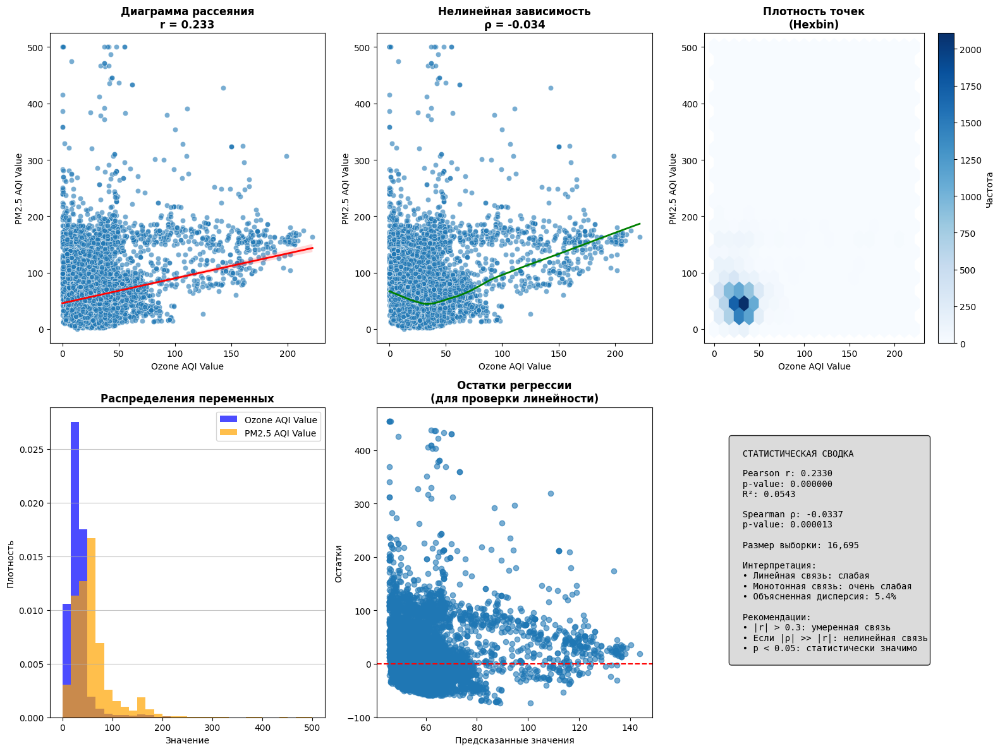


✅ АНАЛИЗ ЗАВЕРШЕН


{'test_type': 'Correlation',
 'pearson_r': np.float64(0.23303077512020137),
 'pearson_p': np.float64(1.0855564924472278e-204),
 'spearman_r': np.float64(-0.033695462561816644),
 'spearman_p': np.float64(1.3326632059368764e-05),
 'r_squared': np.float64(0.05430334215312186),
 'significant_pearson': np.True_,
 'significant_spearman': np.True_,
 'residuals': array([-10.6873108 ,  -7.0207724 ,  -7.0207724 , ...,   7.99012096,
         -4.63361356,   5.78584058])}

In [ ]:
analyze_variable_relationship(df, 'Ozone AQI Value', 'PM2.5 AQI Value')

# Выводы о проблемах

Корреляции:
- 1) Свяь между CO и NO2 очень слабая чем больше CO тем больше NO2
- 2) Связи между CO и PM2.5 практически нет но есть случаи когда чем больше CO тем больше PM2.5
- 3) Связь между NO2 и PM2.5 очень слабая чем больше NO2 тем больше PM2.5 но есть случаи когда при малых NO2 большие значения PM2.5
- 4) Связь между Ozone и PM2.5 очень слабая , чем больше Ozone тем больше PM2.5
но очень много случаев когда PM2.5 высокая когда Ozone не большой или средний или очень малый
- 5) Связь между Ozone и lng слабая , чем больше lng тем больше Ozone но бывают случаи когда при высоком lng низкий Ozone

С осоновным признаком:

- 1) Связь между CO и AQI слабая, есть случаи когда при низком CO большая AQI
- 2) Связь между Ozone и AQI слабая, есть случаи когда при низком Ozone большая AQI
- 3) Связь между NO2 и AQI слабая, есть случаи когда при низком NO2 большая AQI
- 4) Связь между PM2.5 и AQI сильная, чем больше PM2.5 тем больше AQI
- 5) Связь между lat и AQI слабая
- 6) Связь между lng и AQI слабая, чем больше lng тем больше AQI
- 7) Связь между Country и AQI умеренная
- 8) Связь между City и AQI умеренная

PM2.5 - это один из наиболее важных и опасных загрязнителей воздуха. PM2.5 — это тонкодисперсные частицы (твердые частицы и жидкие капли), взвешенные в воздухе, диаметр которых составляет 2.5 микрометра (мкм) или меньше

lat - измеряет положение точки к северу или к югу от экватора. Линии широты (параллели) идут параллельно экватору. Значения варьируются от -90° (Южный полюс) до +90° (Северный полюс), с 0° на экваторе.

lng - змеряет положение точки к востоку или к западу от нулевого меридиана (Гринвичского меридиана), проходящего через Гринвич, Лондон. Линии долготы (меридианы) идут от Северного полюса к Южному полюсу. Значения варьируются от -180° (запад) до +180° (восток), с 0° на нулевом меридиане.





### Гипотезы, основанные на корреляциях между загрязнителями:

**1) Связь между CO и NO2 очень слабая: "чем больше CO, тем больше NO2".**
* **Гипотеза 1.1:** Источники CO и NO2 могут быть разными или их выбросы не всегда происходят синхронно. Например, CO часто ассоциируется с неполным сгоранием топлива (выхлопные газы старых автомобилей, бытовое отопление), а NO2 – с более полным сгоранием при высоких температурах (современные автомобили, промышленность).
* **Гипотеза 1.2:** Если и CO, и NO2 являются продуктами сгорания, возможно, их образование или рассеивание подвержены влиянию других факторов, которые разрывают прямую сильную корреляцию.

**2) Связи между CO и PM2.5 практически нет, но есть случаи, когда "чем больше CO, тем больше PM2.5".**
* **Гипотеза 2.1:** Несмотря на общую слабую связь, есть специфические условия или источники, которые одновременно генерируют как CO, так и PM2.5. Это может указывать на локальные, временные или специфические источники загрязнения, например, интенсивные пробки с большим количеством старых дизельных автомобилей, лесные пожары (сжигание биомассы), или промышленные объекты с устаревшими технологиями.
* **Гипотеза 2.2:** Фоновые уровни CO и PM2.5 могут быть обусловлены разными факторами, но в пиковых ситуациях (например, при сильном сжигании) они могут совместно расти.

**3) Связь между NO2 и PM2.5 очень слабая: "чем больше NO2, тем больше PM2.5", но есть случаи, когда при малых NO2 большие значения PM2.5.**
* **Гипотеза 3.1:** Аналогично CO, основные источники NO2 (транспорт, промышленность) не всегда являются доминирующими источниками PM2.5. PM2.5 может быть вызван другими причинами, такими как пыль, сельскохозяйственные работы, вторичные аэрозоли (образующиеся из газообразных прекурсоров, включая NO2, но с задержкой или при определенных метеорологических условиях).
* **Гипотеза 3.2:** Случаи высоких PM2.5 при низких NO2 могут указывать на то, что PM2.5 поступает из региональных источников, находящихся далеко от основных городских центров (где обычно выше NO2) – например, трансграничное загрязнение, пыльные бури или сезонные пожары, влияющие на качество воздуха на большой территории.

**4) Связь между Ozone и PM2.5 очень слабая: "чем больше Ozone, тем больше PM2.5", но очень много случаев, когда PM2.5 высокая, когда Ozone не большой или средний, или очень малый.**
* **Гипотеза 4.1:** Озон (O3) в приземном слое является вторичным загрязнителем, образующимся из прекурсоров (NOx, ЛОС) под воздействием солнечного света. PM2.5 же может быть как первичным, так и вторичным. Отсутствие сильной корреляции говорит о том, что механизмы образования и факторы, влияющие на O3 и PM2.5, часто независимы или их пики приходятся на разное время/условия. Высокие PM2.5 могут быть в холодное время года или при туманах, когда образование озона минимально.
* **Гипотеза 4.2:** Случаи высоких PM2.5 при низком Озоне подтверждают, что PM2.5 часто является результатом местных выбросов (сжигание, пыль) или регионального переноса, которые не зависят от фотохимических реакций, необходимых для образования озона.

**5) Связь между Ozone и lng слабая: "чем больше lng, тем больше Ozone", но бывают случаи, когда при высоком lng низкий Ozone.**
* **Гипотеза 5.1:** Увеличение озона с долготой может указывать на влияние преобладающих западных ветров, которые переносят загрязнения, способствующие образованию озона, или на рост индустриализации/урбанизации в восточных регионах.
* **Гипотеза 5.2:** Низкий озон при высоком lng (восточнее) может быть связан с региональными особенностями, такими как: наличие больших водоемов (которые могут способствовать рассеиванию загрязнителей), меньшая солнечная инсоляция, или же более высокая концентрация оксида азота (NO), который "потребляет" озон.


### Гипотезы, основанные на корреляциях с основным признаком (AQI):

**1) Связь между CO и AQI слабая, есть случаи, когда при низком CO большая AQI.**
* **Гипотеза 1.1:** Это сильное подтверждение того, что **CO редко является доминирующим загрязнителем, определяющим общий AQI** в вашем датасете. Высокий AQI, при этом низкий CO, указывает, что AQI в этих случаях формируется за счет других загрязнителей, скорее всего PM2.5, PM10 или озона.
* **Гипотеза 1.2:** CO может быть значимым фактором для AQI только в очень специфических, локализованных условиях (например, в плохо вентилируемых помещениях или при очень высокой интенсивности дорожного движения без рассеивания).

**2) Связь между Ozone и AQI слабая, есть случаи, когда при низком Ozone большая AQI.**
* **Гипотеза 2.1:** Аналогично CO, это указывает на то, что **Озон часто не является основным фактором, определяющим AQI**. Пиковые значения AQI, вероятно, обусловлены другими загрязнителями, даже когда озон находится на низком или среднем уровне.
* **Гипотеза 2.2:** Если данные включают различные сезоны, то высокий AQI зимой может быть вызван PM2.5/PM10 (отопление), тогда как озон ниже. Летом AQI может быть высоким из-за озона, но PM2.5 может быть ниже. Это подтверждает, что AQI — это индекс, который "переключается" между загрязнителями.

**3) Связь между NO2 и AQI слабая, есть случаи, когда при низком NO2 большая AQI.**
* **Гипотеза 3.1:** NO2 также, вероятно, **не является основным фактором, формирующим высокий AQI** в большинстве случаев. Это означает, что даже при низких выбросах NO2 (например, в менее населенных районах или в ночное время), другие загрязнители могут вызывать плохой AQI.
* **Гипотеза 3.2:** NO2 чаще всего связан с городскими выбросами. Высокий AQI при низком NO2 может указывать на сельскохозяйственное загрязнение, пыль из пустынь, трансграничные перенос загрязнителей или пожары, которые не связаны напрямую с городской транспортной активностью.

**4) Связь между PM2.5 и AQI сильная: "чем больше PM2.5, тем больше AQI".**
* **Гипотеза 4.1 (Основная):** **PM2.5 является наиболее значимым и частым загрязняющим веществом, определяющим общее значение AQI** в вашем датасете. Это очень типично для многих регионов мира, где PM2.5 является главной проблемой качества воздуха.
* **Гипотеза 4.2:** Это подтверждает, что PM2.5 чаще всего достигает уровней, которые переводятся в более высокие, "нездоровые" категории AQI по сравнению с другими загрязнителями, присутствующими в данных.

**5) Связь между lat и AQI слабая.**
* **Гипотеза 5.1:** Изменение широты (движение с севера на юг) в пределах вашего набора данных **не является сильным предиктором общего уровня AQI**. Это означает, что факторы, влияющие на качество воздуха (например, плотность населения, промышленность, климатические условия, которые влияют на AQI), не сильно зависят от широты в охваченном вашем датасетом диапазоне.
* **Гипотеза 5.2:** Вариативность AQI на одной и той же широте может быть очень высокой из-за локальных источников загрязнения и метеорологических условий.

**6) Связь между lng и AQI слабая: "чем больше lng, тем больше AQI".**
* **Гипотеза 6.1:** Небольшое увеличение AQI с долготой (движение с запада на восток) может указывать на **региональную тенденцию к ухудшению качества воздуха в восточных регионах**, возможно, из-за:
    * Увеличения промышленной активности или урбанизации.
    * Преобладающих ветров, несущих загрязнения с запада на восток.
    * Особенностей географии или климата, которые способствуют накоплению загрязнителей.
* **Гипотеза 6.2:** Слабость этой связи указывает, что это не глобальная тенденция, а скорее региональная особенность, которая может быть перекрыта локальными факторами.

**7) Связь между Country и AQI умеренная.**
* **Гипотеза 7.1:** Существуют **заметные различия в качестве воздуха между странами**. Это может быть связано с:
    * Разной степенью индустриализации и урбанизации.
    * Различиями в экологическом регулировании и правоприменении.
    * Различиями в преобладающих источниках загрязнения (например, угольные электростанции в одной стране, автомобильный транспорт в другой).
    * Климатическими и географическими особенностями, влияющими на рассеивание загрязнителей.

**8) Связь между City и AQI умеренная.**
* **Гипотеза 8.1:** Качество воздуха **значительно варьируется от города к городу**. Это естественно, так как каждый город имеет свои уникальные:
    * Источники загрязнения (транспорт, промышленность, отопление).
    * Плотность населения и застройки.
    * Метеорологические условия (скорость ветра, наличие инверсий, рельеф), которые влияют на накопление загрязнителей.
* **Гипотеза 8.2:** Это подтверждает, что локальные факторы (уровень выбросов, городское планирование) играют очень важную роль в формировании AQI.


- 1) Только Country имеет пропуски но их мало и можно использовать простые методы
- 2) Категория City имеет очень большое количество значении
- 3) Практически все признаки имеют не нормальное распределение (не равномерные частоты) по этому нельзя правильно через абсолютные значения определить связь


## Выводы о решении проблем

Для категориальных группировку редких категории , в Country заполнить пропуски средним

Для категориальных провести Target encoding

Для численных данных провести нормализацию распределения через трансформацию и так же провести нормализацию значении через Z-нормализацию или StandardScaler



# PREPROCESSING

In [ ]:
df.describe()

,AQI Value,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value,lat,lng
count,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000
mean,62.998682,1.342138,31.767355,3.819647,59.821324,30.267148,-3.944485
std,43.091971,2.371379,22.839343,5.880677,43.208298,22.947398,73.037148
min,7.000000,0.000000,0.000000,0.000000,0.000000,-54.801900,-171.750000
25%,38.500000,1.000000,20.000000,0.000000,34.000000,16.515450,-75.180000
50%,52.000000,1.000000,29.000000,2.000000,52.000000,38.815800,5.643100
75%,69.000000,1.000000,38.000000,5.000000,69.000000,46.683300,36.275000
max,500.000000,133.000000,222.000000,91.000000,500.000000,70.767000,178.017800


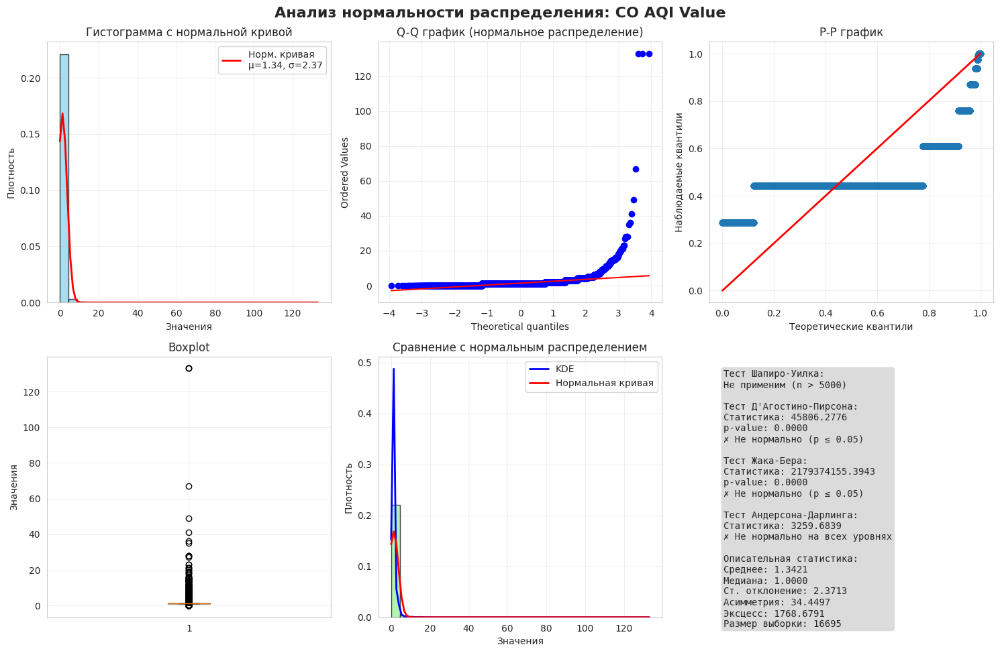


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: CO AQI Value
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'CO AQI Value')

In [ ]:
df['CO AQI Value Transformed'] = safe_log_transform(df['CO AQI Value'], method='log1p')

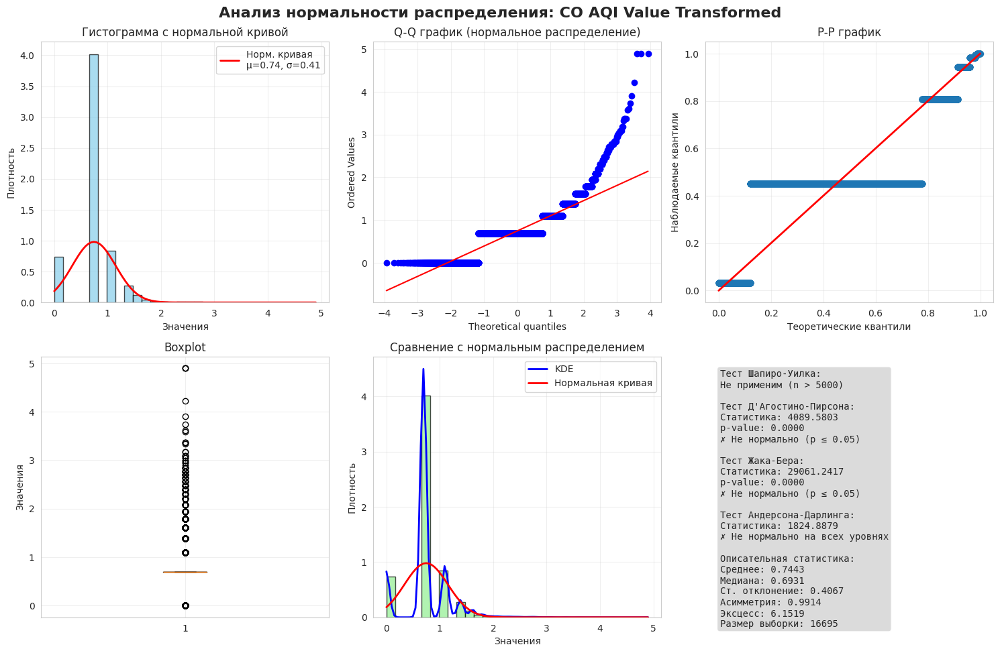


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: CO AQI Value Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'CO AQI Value Transformed')

In [ ]:
df['CO AQI Value Transformed_1'] = np.log10(df['CO AQI Value'] + 0.5)

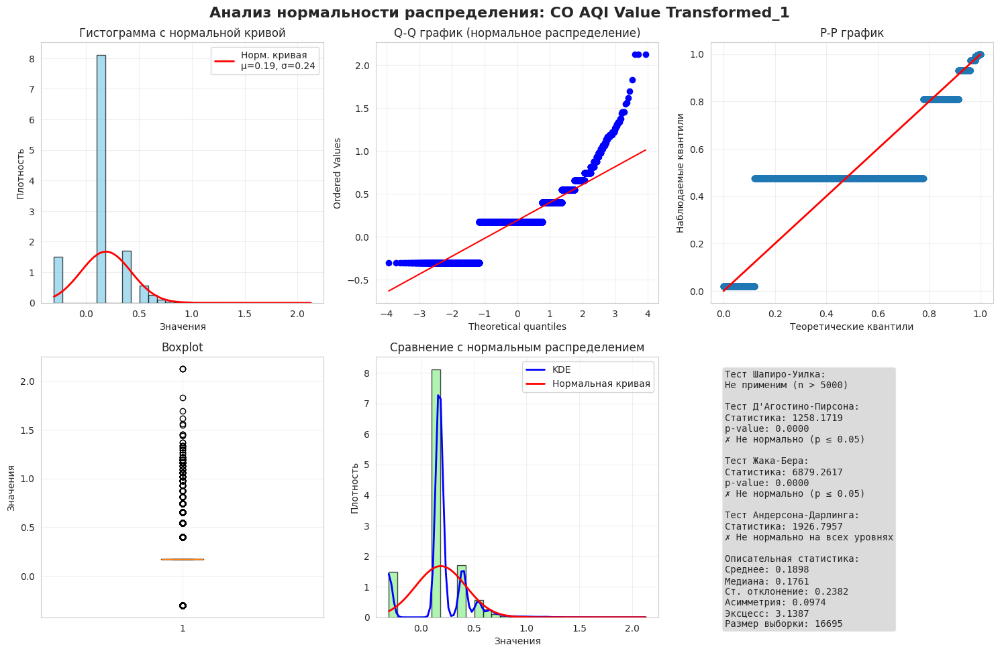


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: CO AQI Value Transformed_1
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 1/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'CO AQI Value Transformed_1')

In [ ]:
df['CO AQI Value Transformed'].isnull().sum()

np.int64(0)

In [ ]:
temp_value = df['CO AQI Value Transformed_1'] + 0.01

clipped_value = np.clip(temp_value, -1, 1)

df['CO AQI Value Transformed_2'] = np.asin(clipped_value)

In [ ]:
df['CO AQI Value Transformed_2'].isnull().sum()

np.int64(0)

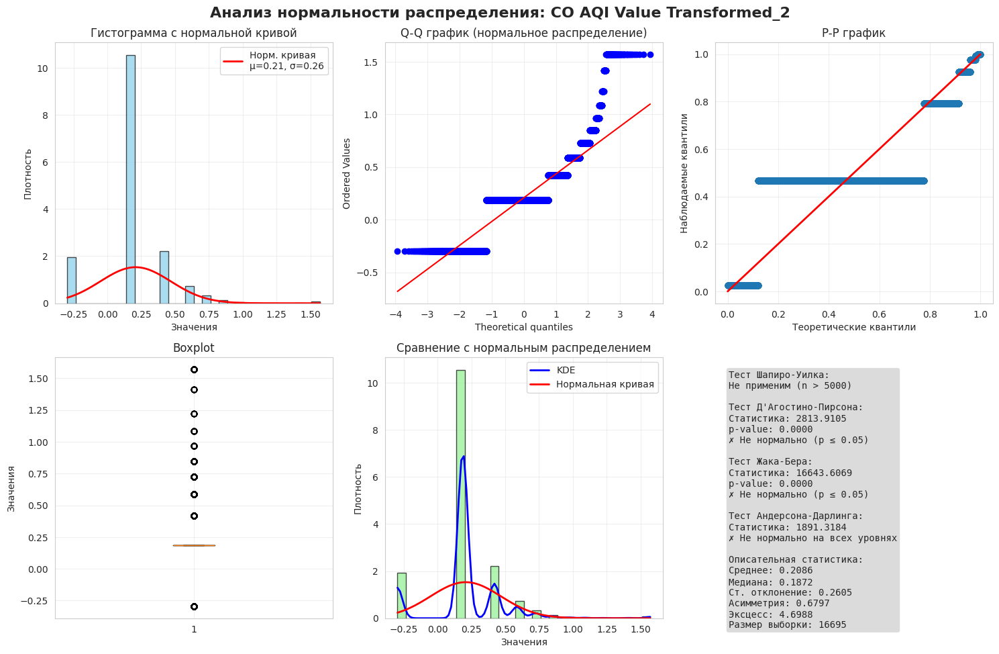


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: CO AQI Value Transformed_2
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'CO AQI Value Transformed_2')

In [ ]:
df['CO AQI Value'] = df['CO AQI Value Transformed_1']
df.drop(columns=['CO AQI Value Transformed', 'CO AQI Value Transformed_1', 'CO AQI Value Transformed_2'], inplace=True)

In [ ]:
sc = StandardScaler()
df['CO AQI Value'] = sc.fit_transform(df[['CO AQI Value']])

In [ ]:
df['CO AQI Value'].describe() # Для CO sc.fit_transform(np.log10(df['CO AQI Value'] + 0.5)

,CO AQI Value
count,1.669500e+04
mean,-7.256516e-17
std,1.000030e+00
min,-2.060639e+00
25%,-5.774094e-02
50%,-5.774094e-02
75%,-5.774094e-02
max,8.125564e+00


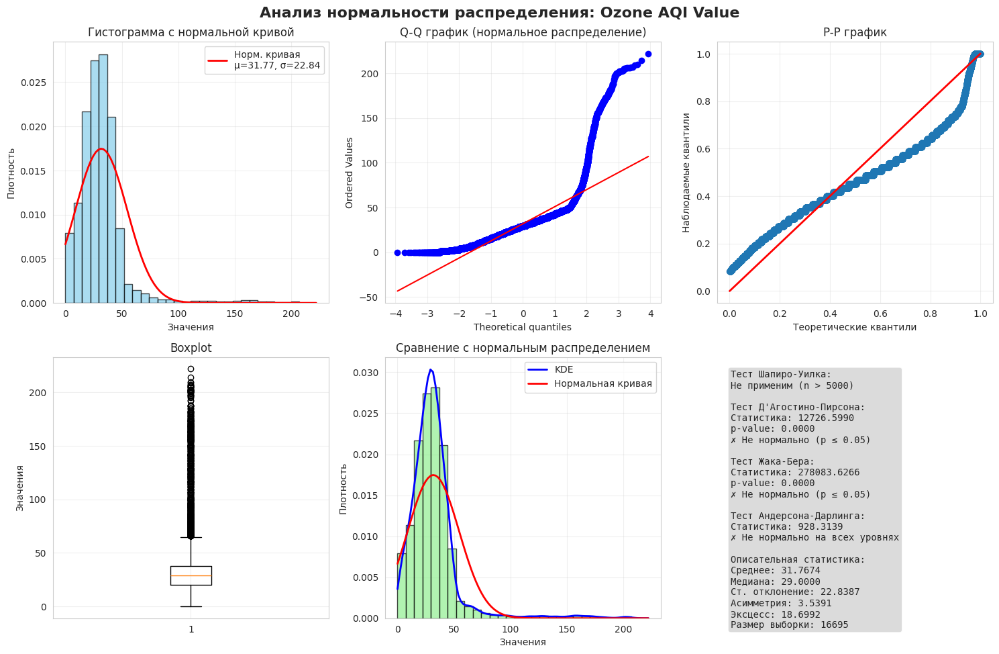


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: Ozone AQI Value
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df,'Ozone AQI Value')

In [ ]:
df['Ozone AQI Value Transformed'] = safe_log_transform(df['Ozone AQI Value'], method='log1p')

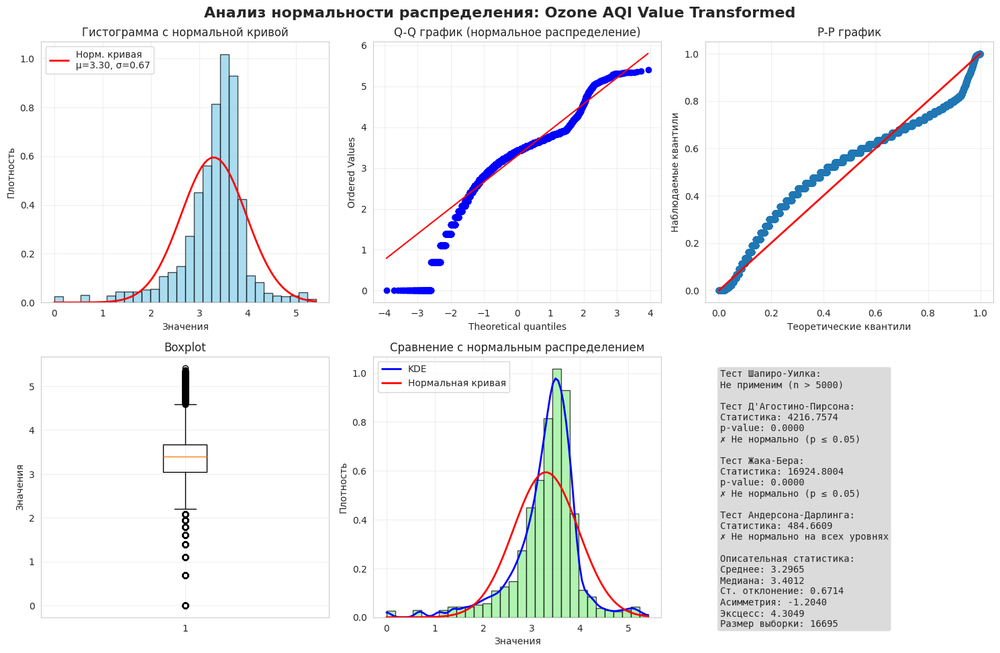


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: Ozone AQI Value Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'Ozone AQI Value Transformed')

In [ ]:
df['Ozone AQI Value Transformed'].isnull().sum()

np.int64(0)

In [ ]:
clipped_value_for_arccosh = np.maximum(1, df['Ozone AQI Value Transformed'])
df['Ozone AQI Value Transformed_1'] = np.arccosh(clipped_value_for_arccosh)**2

In [ ]:
df['Ozone AQI Value Transformed_1'].isnull().sum()

np.int64(0)

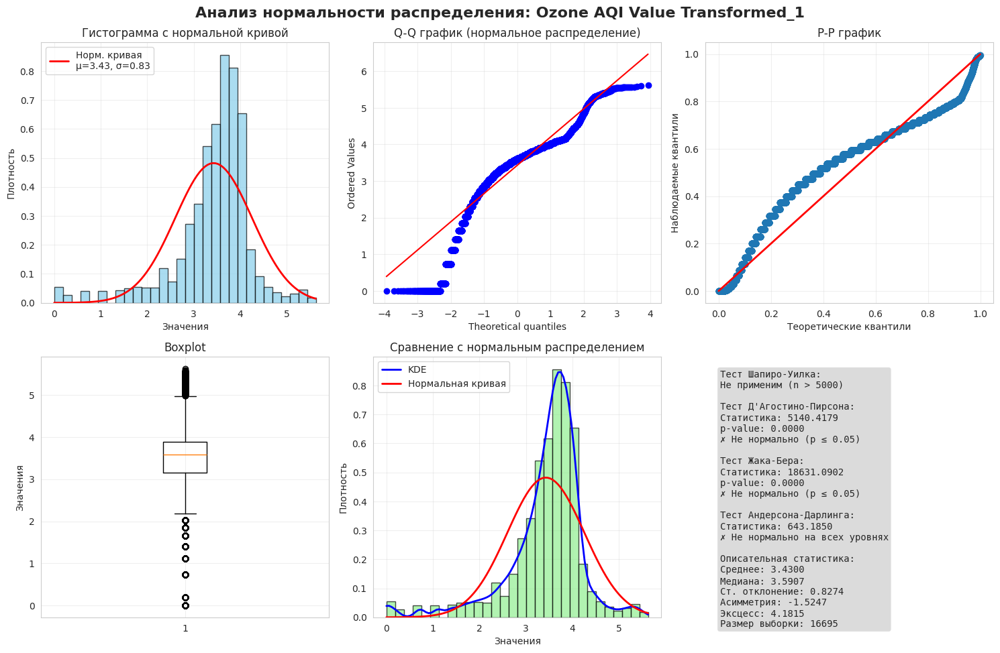


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: Ozone AQI Value Transformed_1
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'Ozone AQI Value Transformed_1')

In [ ]:
df['Ozone AQI Value'] = df['Ozone AQI Value Transformed']
df.drop(columns=['Ozone AQI Value Transformed','Ozone AQI Value Transformed_1'], inplace=True)

In [ ]:
sc = StandardScaler()
df['Ozone AQI Value'] = sc.fit_transform(df[['Ozone AQI Value']]) # Для Ozone sc.fit_transform(safe_log_transform(df['Ozone AQI Value'], method='log1p'))

In [ ]:
df['Ozone AQI Value'].describe()

,Ozone AQI Value
count,1.669500e+04
mean,3.213296e-17
std,1.000030e+00
min,-4.910085e+00
25%,-3.753510e-01
50%,1.559067e-01
75%,5.466912e-01
max,3.143751e+00


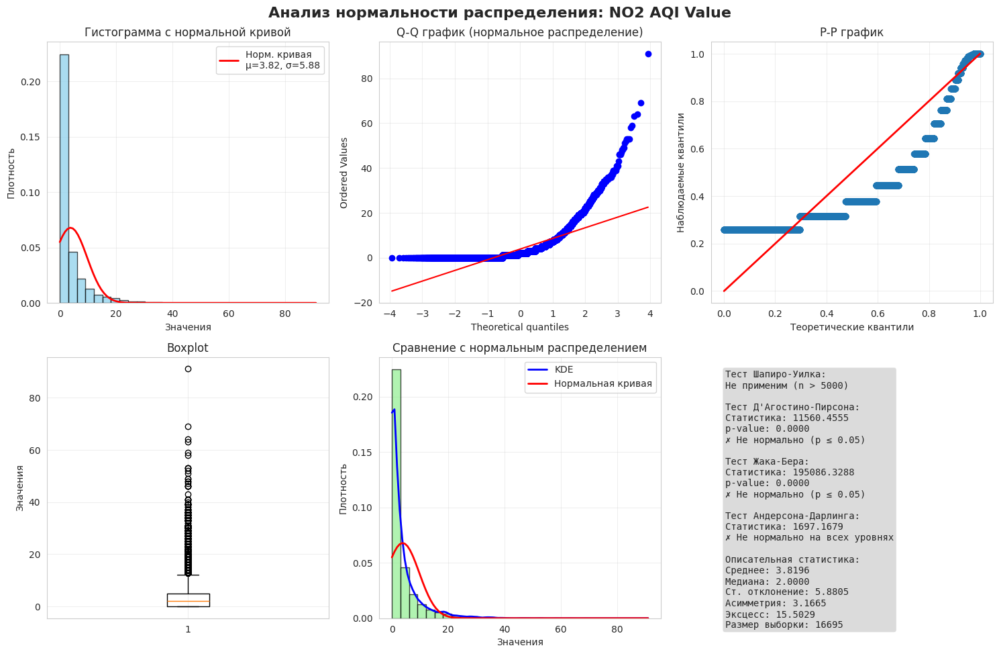


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: NO2 AQI Value
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df,'NO2 AQI Value')

In [ ]:
df['NO2 AQI Value Transformed'] = safe_log_transform(df['NO2 AQI Value'], method='log1p')

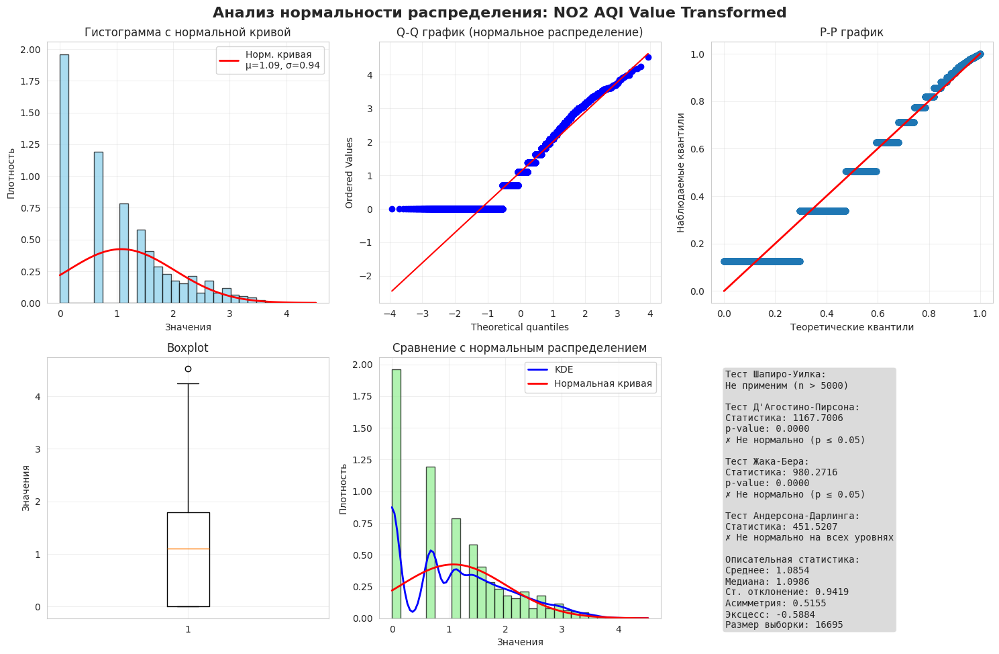


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: NO2 AQI Value Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'NO2 AQI Value Transformed')

In [ ]:
df['NO2 AQI Value'] = df['NO2 AQI Value Transformed']
df.drop(columns=['NO2 AQI Value Transformed'], inplace=True)

In [ ]:
sc = StandardScaler()
df['NO2 AQI Value'] = sc.fit_transform(df[['NO2 AQI Value']]) # Для NO2 sc.fit_transform(safe_log_transform(df['NO2 AQI Value'], method='log1p'))

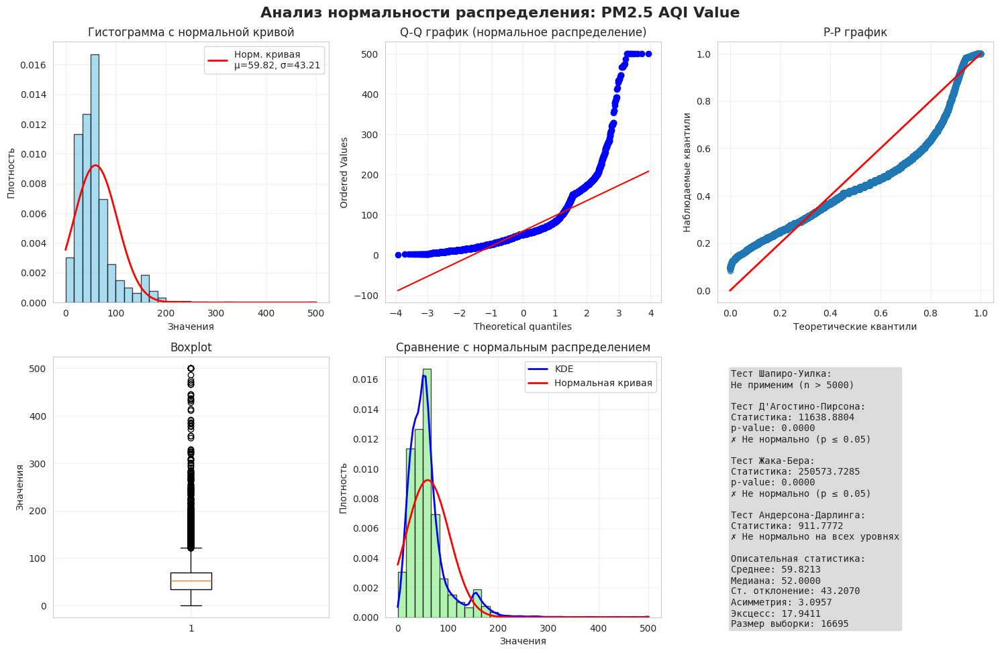


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: PM2.5 AQI Value
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'PM2.5 AQI Value')

In [ ]:
df['PM2.5 AQI Value Transformed'] = safe_log_transform(df['PM2.5 AQI Value'], method='log1p')

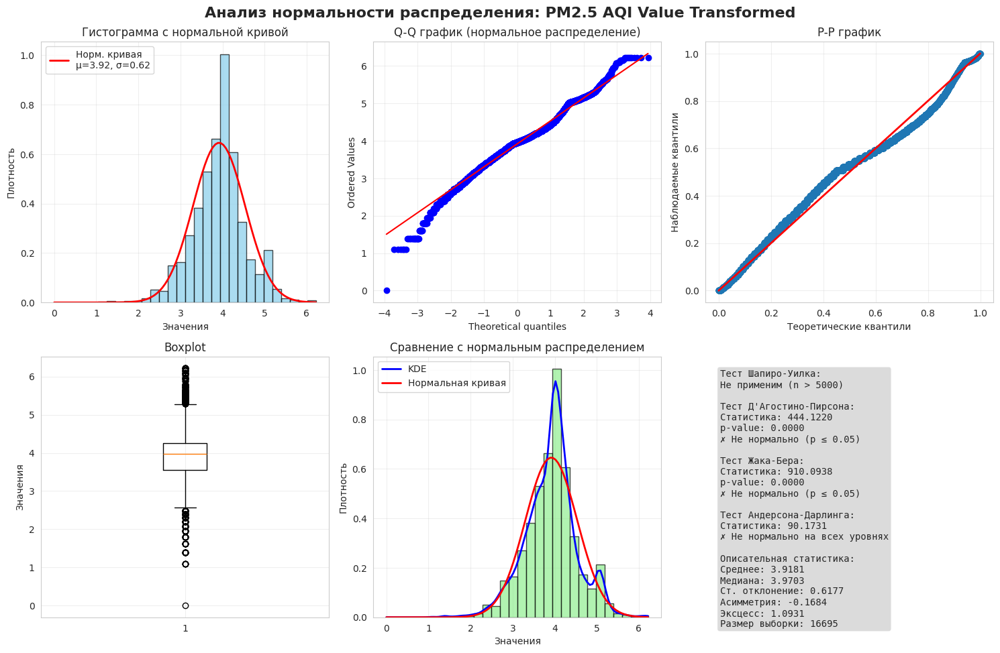


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: PM2.5 AQI Value Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 1/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'PM2.5 AQI Value Transformed')

In [ ]:
df['PM2.5 AQI Value'] = df['PM2.5 AQI Value Transformed']
df.drop(columns=['PM2.5 AQI Value Transformed'], inplace=True)

In [ ]:
sc = StandardScaler()
df['PM2.5 AQI Value'] = sc.fit_transform(df[['PM2.5 AQI Value']]) # Для PM2.5 sc.fit_transform(safe_log_transform(df['PM2.5 AQI Value'], method='log1p'))

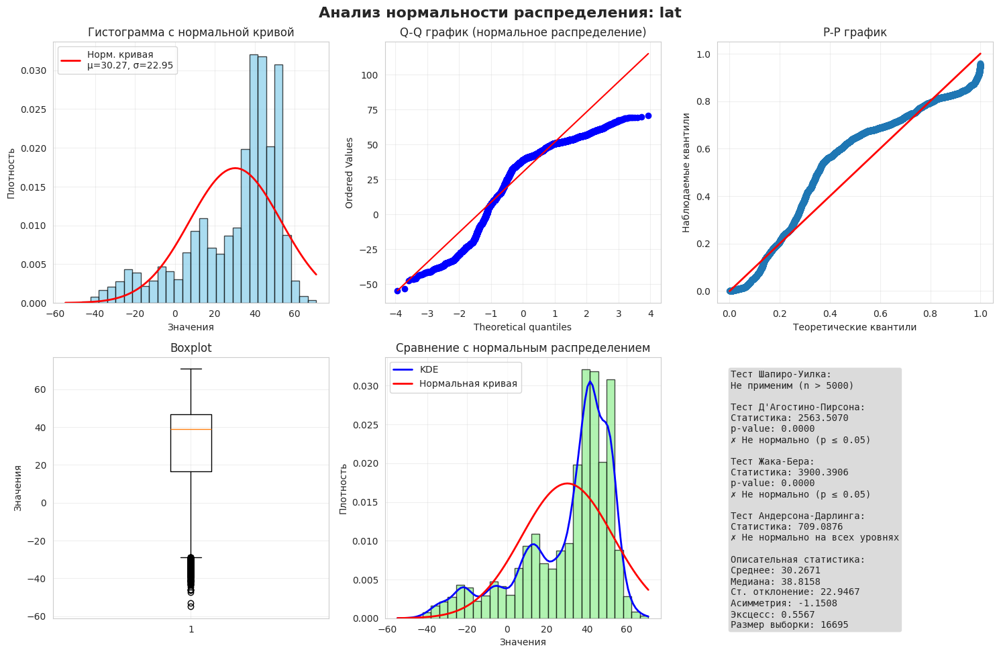


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: lat
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 0/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'lat')

In [ ]:
df['lat Transformed'] = (df['lat'])**2

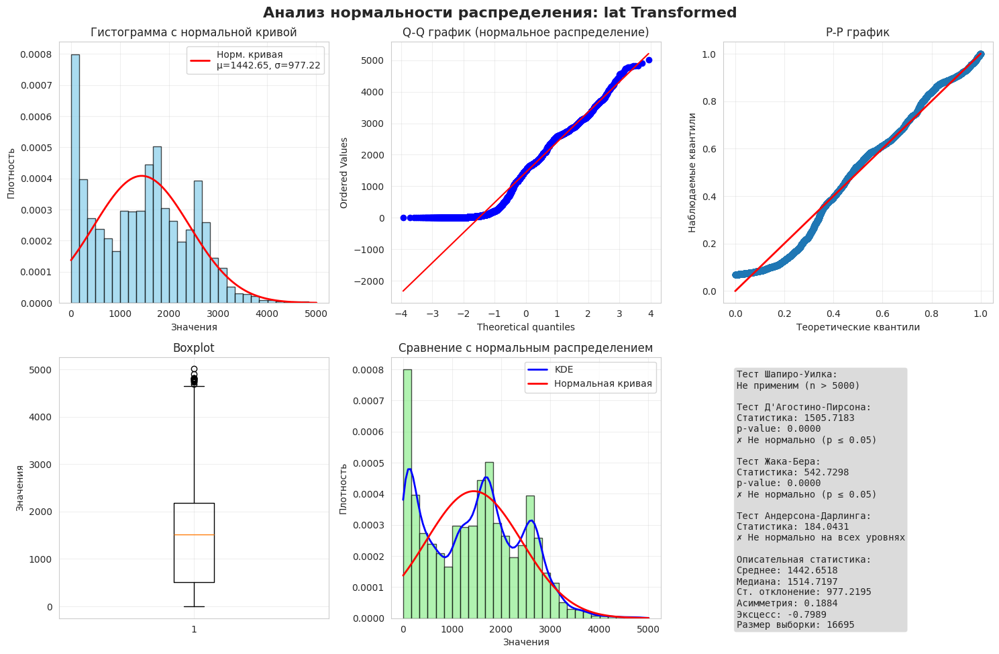


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: lat Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 1/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'lat Transformed')

In [ ]:
df['lat'] = df['lat Transformed']
df = df.drop(['lat Transformed'], axis=1)

In [ ]:
sc = StandardScaler()
df['lat'] = sc.fit_transform(df[['lat']]) # Для lat sc.fit_transform((df['lat'])**2)

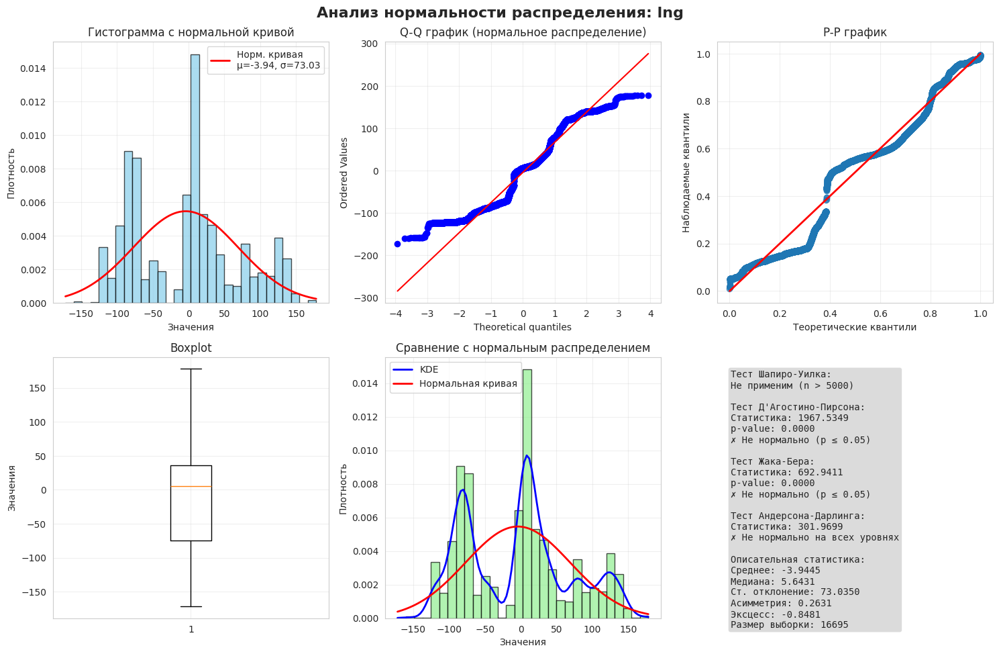


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: lng
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 1/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'lng')

In [ ]:
df['lng Transformed'] = df['lng'] + abs(df['lng'].min()) + 0.0001

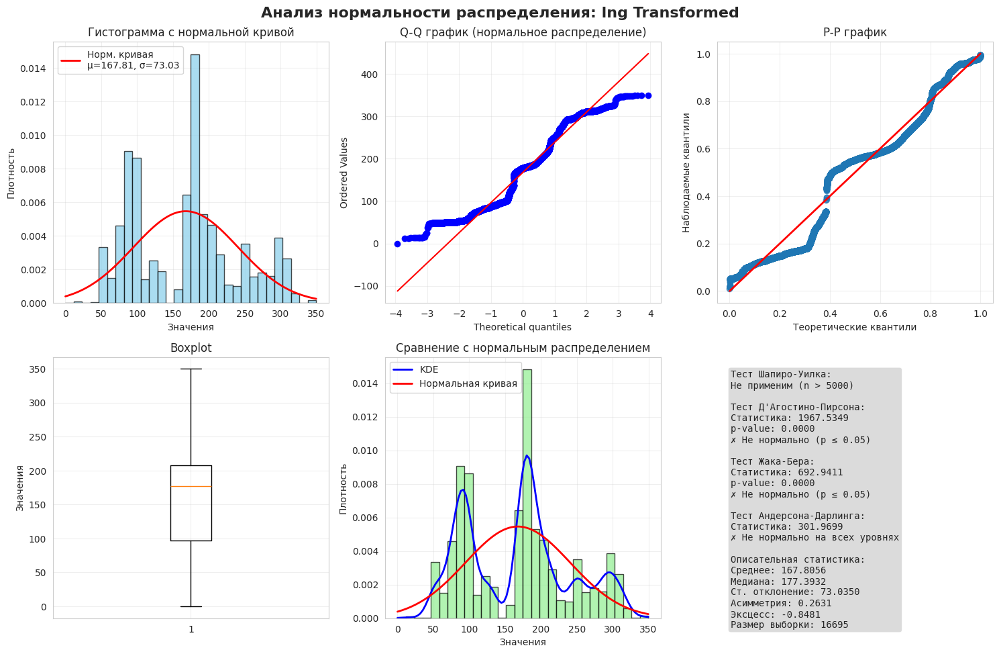


ЗАКЛЮЧЕНИЕ О НОРМАЛЬНОСТИ РАСПРЕДЕЛЕНИЯ: lng Transformed
Тестов указывает на нормальность: 0 из 3
Степень нормальности: 0.0%
Визуальная оценка: 1/2 критериев

ИТОГ: 🔴 СКОРЕЕ ВСЕГО НЕ НОРМАЛЬНОЕ распределение


In [ ]:
analyze_normality(df, 'lng Transformed')

In [ ]:
df['lng'] = df['lng Transformed']
df = df.drop(['lng Transformed'], axis=1)

In [ ]:
sc = StandardScaler()
df['lng'] = sc.fit_transform(df[['lng']]) # Для lng sc.fit_transform(df['lng'] + abs(df['lng'].min()) + 0.0001)

In [ ]:
df.describe()

,AQI Value,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value,lat,lng
count,16695.000000,1.660800e+04,1.652400e+04,1.669500e+04,1.669500e+04,1.669500e+04,1.669500e+04
mean,62.998682,1.929521e-16,3.831358e-16,-1.451303e-16,1.157638e-15,-9.725008e-17,-4.319861e-17
std,43.091971,1.000030e+00,1.000030e+00,1.000030e+00,1.000030e+00,1.000030e+00,1.000030e+00
min,7.000000,-2.055175e+00,-4.338156e+00,-1.152337e+00,-6.343426e+00,-1.476282e+00,-2.297605e+00
25%,38.500000,-5.917063e-02,-3.256749e-01,-1.152337e+00,-5.872422e-01,-9.496859e-01,-9.753619e-01
50%,52.000000,-5.917063e-02,1.661480e-01,1.405195e-02,8.456068e-02,7.374795e-02,1.312739e-01
75%,69.000000,-5.917063e-02,5.635296e-01,7.499613e-01,5.349777e-01,7.546879e-01,5.506881e-01
max,500.000000,5.015837e+00,2.866906e+00,3.648413e+00,3.721391e+00,3.648430e+00,2.491441e+00


In [ ]:
df['Country'] = df['Country'].fillna(df['Country'].mode()[0])

In [ ]:
df['Country'].describe()

,Country
count,16695
unique,174
top,United States of America
freq,4256


In [ ]:
# Ошибка применять это на всем датасете , нужно сделать раздельно для тестового и обучающего изза утечки данных

In [ ]:
df = df.drop(['AQI Category', 'CO AQI Category', 'Ozone AQI Category', 'NO2 AQI Category', 'PM2.5 AQI Category'],axis=1)

In [ ]:
df.isnull().sum()

,0
Country,0
City,0
AQI Value,0
CO AQI Value,0
Ozone AQI Value,0
NO2 AQI Value,0
PM2.5 AQI Value,0
lat,0
lng,0


In [ ]:
X = df.drop(columns=['AQI Value'])
y = df['AQI Value']

In [ ]:
X.isnull().sum()
y.isnull().sum()

np.int64(0)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42
)

In [ ]:
X_train.isnull().sum()
X_test.isnull().sum()
y_train.isnull().sum()
y_test.isnull().sum()

np.int64(0)

In [ ]:
X_train_cat = X_train[['Country', 'City']].copy()
X_test_cat = X_test[['Country', 'City']].copy()

In [ ]:
X_train_num = X_train.drop(columns=['Country', 'City'])
X_test_num = X_test.drop(columns=['Country', 'City'])

In [ ]:
X_test_cat.isnull().sum()
X_train_cat.isnull().sum()

,0
Country,0
City,0


In [ ]:
# X_train_before_sc['CO AQI Value'] = np.log10(X_train_before_sc['CO AQI Value'] + 0.5)
# X_train_before_sc['Ozone AQI Value'] = safe_log_transform(X_train_before_sc['Ozone AQI Value'], method='log1p')
# X_train_before_sc['NO2 AQI Value'] = safe_log_transform(X_train_before_sc['NO2 AQI Value'], method='log1p')
# X_train_before_sc['PM2.5 AQI Value'] = safe_log_transform(X_train_before_sc['PM2.5 AQI Value'], method='log1p')
# X_train_before_sc['lat'] = (X_train_before_sc['lat'])**2
# X_train_before_sc['lng'] = X_train_before_sc['lng'] + abs(X_train_before_sc['lng'].min()) + 0.0001

# X_test_before_sc['CO AQI Value'] = np.log10(X_test_before_sc['CO AQI Value'] + 0.5)
# X_test_before_sc['Ozone AQI Value'] = safe_log_transform(X_test_before_sc['Ozone AQI Value'], method='log1p')
# X_test_before_sc['NO2 AQI Value'] = safe_log_transform(X_test_before_sc['NO2 AQI Value'], method='log1p')
# X_test_before_sc['PM2.5 AQI Value'] = safe_log_transform(X_test_before_sc['PM2.5 AQI Value'], method='log1p')
# X_test_before_sc['lat'] = (X_test_before_sc['lat'])**2
# X_test_before_sc['lng'] = X_test_before_sc['lng'] + abs(X_test_before_sc['lng'].min()) + 0.0001

# sc = StandardScaler()

# X_train_scaled_array = sc.fit_transform(X_train_before_sc)
# X_test_scaled_array = sc.transform(X_test_before_sc)

# X_train_scaled = pd.DataFrame(X_train_scaled_array,
#                               columns=X_train_before_sc.columns,
#                               index=X_train_before_sc.index)

# X_test_scaled = pd.DataFrame(X_test_scaled_array,
#                              columns=X_test_before_sc.columns,
#                              index=X_test_before_sc.index)

In [ ]:
threshold_count = 2
column_to_process = 'City'

counts_train = X_train_cat[column_to_process].value_counts()
rare_categories_train = counts_train[counts_train < threshold_count].index.tolist()

print(f"Редкие категории (на основе X_train_cat): {rare_categories_train}")

Редкие категории (на основе X_train_cat): ['Malacky', 'Apodi', 'Aguazul', 'Sidlaghatta', 'Krishnanagar', 'Oupeye', 'Frolovo', 'Taquaritinga', 'Dhuburi', 'Nevyansk', 'Manching', 'Mingguang', 'Cainta', 'Ananindeua', 'Kindu', 'Rahway', 'Ringsted', 'Buford', 'Uyo', 'Hillsdale', 'Fargo', 'Anjangaon', 'Friedberg', 'Fairview Heights', 'Corigliano Calabro', 'Auckland', 'Bulungu', 'Zvenigovo', 'Bondeno', 'Chiavari', 'Jinzhou', 'Semiluki', 'Akron', 'Ken Caryl', 'Indaiatuba', 'La Algaba', 'Sattahip', 'Irvington', 'Talant', 'Steinbach', 'Mettlach', 'Maumee', 'Pflugerville', 'New Providence', 'Tahlequah', 'Hayama', 'Suzuka', 'Blomberg', 'Xushan', 'Haan', 'Bellview', 'Herve', 'Arsenyev', 'Port Said', 'Monte Azul', 'Narimanov', 'Yurga', 'Bosconia', 'Wiang Sa', 'Sudak', 'Ovalle', 'Raxaul', 'La Romana', 'Miastko', 'Fomento', 'Currais Novos', 'Adria', 'Changuinola', 'Nidzica', 'Sikonge', 'Fort Collins', 'Pout', 'Nowogard', 'South Holland', 'Agidel', 'Davlekanovo', 'Spa', 'West Little River', 'Steinhagen

In [ ]:
X_train_cat[column_to_process] = X_train_cat[column_to_process].replace(rare_categories_train, 'Other')
X_test_cat[column_to_process] = X_test_cat[column_to_process].replace(rare_categories_train, 'Other')

target_encoder_city = TargetEncoder(cols=[column_to_process], smoothing=1.0, min_samples_leaf=1)
X_train_cat_encoded_city = target_encoder_city.fit_transform(X_train_cat[[column_to_process]], y_train)
X_test_cat_encoded_city = target_encoder_city.transform(X_test_cat[[column_to_process]])

In [ ]:
target_encoder_country = TargetEncoder(cols=['Country'], smoothing=1.0, min_samples_leaf=1)
X_train_cat_encoded_country = target_encoder_country.fit_transform(X_train_cat[['Country']], y_train)
X_test_cat_encoded_country = target_encoder_country.transform(X_test_cat[['Country']])

In [ ]:
X_train_final = pd.concat([
  X_train_num,
  X_train_cat_encoded_city,
  X_train_cat_encoded_country
], axis=1)

X_test_final = pd.concat([
  X_test_num,
  X_test_cat_encoded_city,
  X_test_cat_encoded_country
], axis=1)

In [ ]:
X_train_final.isnull().sum()

,0
CO AQI Value,0
Ozone AQI Value,0
NO2 AQI Value,0
PM2.5 AQI Value,0
lat,0
lng,0
City,0
Country,0


In [ ]:
X_test_final.isnull().sum()

,0
CO AQI Value,0
Ozone AQI Value,0
NO2 AQI Value,0
PM2.5 AQI Value,0
lat,0
lng,0
City,0
Country,0


In [ ]:
X_test_final.head()

,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value,lat,lng,City,Country
11822,-0.057741,0.546691,-0.416427,-0.682506,1.307806,0.115486,63.437447,38.069149
7379,0.873553,-0.057238,1.180441,1.779656,-1.387414,-0.967010,149.998554,70.381890
6494,0.873553,-0.001025,0.319482,1.853022,-1.253144,-0.174421,63.437447,153.460985
8749,0.873553,0.792573,0.556392,0.258193,0.645331,0.211238,63.437447,61.793496
5129,2.311003,-3.877661,1.570851,1.842743,-0.937456,-0.593832,63.437447,44.496795


# Обучение моделей

In [ ]:

# Подавать трансформированные данные так же как при препроцессинге, производить трансформации только после разделения на тестовые и валидационные
def train_regression_models(X_train, X_test, y_train, y_test, target_column, test_size=0.2, random_state=42):
    # Словарь моделей
    models = {
        'Linear Regression': LinearRegression(),
        'Ridge': Ridge(alpha=1.0),
        'Lasso': Lasso(alpha=1.0),
        'ElasticNet': ElasticNet(alpha=1.0),
        'Random Forest': RandomForestRegressor(n_estimators=100, random_state=random_state),
        'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=random_state),
        'Extra Trees': ExtraTreesRegressor(n_estimators=100, random_state=random_state),
        'SVR': SVR(kernel='rbf'),
        'Decision Tree': DecisionTreeRegressor(random_state=random_state),
        'KNN': KNeighborsRegressor(n_neighbors=5)
    }

    results = []

    print("Обучение моделей...")
    print("-" * 80)

    for name, model in models.items():
        # Выбор данных (масштабированные для линейных моделей и SVR)
        X_tr, X_te = X_train, X_test

        # Обучение модели
        model.fit(X_tr, y_train)

        # Предсказания
        y_pred = model.predict(X_te)

        # Кросс-валидация
        cv_scores = cross_val_score(model, X_tr, y_train, cv=5, scoring='r2')

        # Метрики
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        cv_mean = cv_scores.mean()
        cv_std = cv_scores.std()

        results.append({
            'Model': name,
            'RMSE': rmse,
            'MAE': mae,
            'R²': r2,
            'CV R² Mean': cv_mean,
            'CV R² Std': cv_std,
            'Model_Object': model
        })

        print(f"{name:18} | RMSE: {rmse:.4f} | MAE: {mae:.4f} | R²: {r2:.4f} | CV: {cv_mean:.4f}±{cv_std:.4f}")

    # Создание DataFrame с результатами
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('R²', ascending=False)

    print("\n" + "="*80)
    print("ИТОГОВЫЕ РЕЗУЛЬТАТЫ (отсортированы по R²)")
    print("="*80)

    display_df = results_df[['Model', 'RMSE', 'MAE', 'R²', 'CV R² Mean', 'CV R² Std']].round(4)
    print(display_df.to_string(index=False))

    top_3 = results_df.head(3)

    print(f"\n🏆 ТОП-3 МОДЕЛИ:")
    print("-" * 50)
    for i, (_, row) in enumerate(top_3.iterrows(), 1):
        print(f"{i}. {row['Model']} (R² = {row['R²']:.4f})")

    print(f"\n🥇 ЛУЧШАЯ МОДЕЛЬ: {top_3.iloc[0]['Model']}")
    print(f"   R² Score: {top_3.iloc[0]['R²']:.4f}")
    print(f"   RMSE: {top_3.iloc[0]['RMSE']:.4f}")
    print(f"   Cross-Validation R²: {top_3.iloc[0]['CV R² Mean']:.4f} ± {top_3.iloc[0]['CV R² Std']:.4f}")

    return {
        'results': results_df,
        'best_model': top_3.iloc[0]['Model_Object'],
        'best_model_name': top_3.iloc[0]['Model'],
        'top_3': top_3
    }

In [ ]:
def predict(model, X_data,
           target_encoder_city=None, target_encoder_country=None,
           rare_categories_train=None, scaler=None,
           apply_log_transforms=False, apply_scaling=False):
    """
    Функция для предсказания с применением всех необходимых трансформаций данных

    Parameters:
    -----------
    model : trained model
        Обученная модель для предсказания
    X_data : pd.DataFrame
        Входные данные для предсказания
    target_encoder_city : TargetEncoder, optional
        Обученный энкодер для города
    target_encoder_country : TargetEncoder, optional
        Обученный энкодер для страны
    rare_categories_train : list, optional
        Список редких категорий из обучающей выборки
    scaler : StandardScaler, optional
        Обученный скейлер для нормализации
    apply_log_transforms : bool, default=False
        Применять ли логарифмические преобразования
    apply_scaling : bool, default=False
        Применять ли стандартизацию

    Returns:
    --------
    predictions : array
        Предсказания модели
    """

    X = X_data.copy()

    X_cat = X[['Country', 'City']].copy()
    X_num = X.drop(columns=['Country', 'City'])

    if rare_categories_train is not None:
        X_cat['City'] = X_cat['City'].replace(rare_categories_train, 'Other')

    if apply_log_transforms:
        if 'CO AQI Value' in X_num.columns:
            X_num['CO AQI Value'] = np.log10(X_num['CO AQI Value'] + 0.5)
        if 'Ozone AQI Value' in X_num.columns:
            X_num['Ozone AQI Value'] = safe_log_transform(X_num['Ozone AQI Value'], method='log1p')
        if 'NO2 AQI Value' in X_num.columns:
            X_num['NO2 AQI Value'] = safe_log_transform(X_num['NO2 AQI Value'], method='log1p')
        if 'PM2.5 AQI Value' in X_num.columns:
            X_num['PM2.5 AQI Value'] = safe_log_transform(X_num['PM2.5 AQI Value'], method='log1p')
        if 'lat' in X_num.columns:
            X_num['lat'] = (X_num['lat']) ** 2
        if 'lng' in X_num.columns:
            X_num['lng'] = X_num['lng'] + abs(X_num['lng'].min()) + 0.0001

    if apply_scaling and scaler is not None:
        X_num_scaled_array = scaler.transform(X_num)
        X_num = pd.DataFrame(X_num_scaled_array,
                            columns=X_num.columns,
                            index=X_num.index)

    if target_encoder_city is not None:
        X_cat_encoded_city = target_encoder_city.transform(X_cat[['City']])
    else:
        X_cat_encoded_city = pd.DataFrame()

    if target_encoder_country is not None:
        X_cat_encoded_country = target_encoder_country.transform(X_cat[['Country']])
    else:
        X_cat_encoded_country = pd.DataFrame()

    X_final_parts = [X_num]

    if not X_cat_encoded_city.empty:
        X_final_parts.append(X_cat_encoded_city)

    if not X_cat_encoded_country.empty:
        X_final_parts.append(X_cat_encoded_country)

    X_final = pd.concat(X_final_parts, axis=1)

    predictions = model.predict(X_final)

    return predictions

In [ ]:
res = train_regression_models(X_train_final, X_test_final, y_train, y_test, 'AQI Value')

Обучение моделей...
--------------------------------------------------------------------------------
Linear Regression  | RMSE: 21.1202 | MAE: 12.8366 | R²: 0.7356 | CV: 0.7417±0.0169
Ridge              | RMSE: 21.1203 | MAE: 12.8362 | R²: 0.7356 | CV: 0.7417±0.0169
Lasso              | RMSE: 21.3570 | MAE: 12.7252 | R²: 0.7296 | CV: 0.7391±0.0189
ElasticNet         | RMSE: 23.3727 | MAE: 13.2124 | R²: 0.6762 | CV: 0.7004±0.0276
Random Forest      | RMSE: 1.7297 | MAE: 0.1130 | R²: 0.9982 | CV: 0.9972±0.0014
Gradient Boosting  | RMSE: 2.0689 | MAE: 0.8746 | R²: 0.9975 | CV: 0.9967±0.0009
Extra Trees        | RMSE: 1.5645 | MAE: 0.2202 | R²: 0.9985 | CV: 0.9978±0.0006
SVR                | RMSE: 30.0056 | MAE: 16.9294 | R²: 0.4663 | CV: 0.4826±0.0205
Decision Tree      | RMSE: 2.0146 | MAE: 0.1114 | R²: 0.9976 | CV: 0.9964±0.0022
KNN                | RMSE: 11.8665 | MAE: 4.6824 | R²: 0.9165 | CV: 0.9264±0.0122

ИТОГОВЫЕ РЕЗУЛЬТАТЫ (отсортированы по R²)
            Model    RMSE     MAE  